# Introduction

**Instacart** is an American company that operates a grocery delivery and pick-up service in the United States and Canada. The company offers its services via a website and mobile app. The service allows customers to order groceries from participating retailers with the shopping being done by a personal shopper.

With the large customer base, the company collects data of the users’ transactions behaviour and purchasing history. 

**The objective** of this study is to increase profitability by tailoring suitable marketing approach and find key driver to used as a lever to improve profit.

The dataset contains a sample of over 3 million grocery orders from more than 200,000 Instacart users.

Dataset: https://www.kaggle.com/c/instacart-market-basket-analysis

# Business Model



- Customers access Instacart’s platform via website or app. Whenever an order is placed on the platform, the so-called personal shoppers in proximity will receive a notification of the request. These shoppers are independent contractors, and they receive by delivery made. Once a shopper accepts the request, they drive to the grocery store chosen, pick up the groceries and deliver them to the customer’s address. 
- Revenue Stream
	- Commissions 
	  
		- Every time an item is sold through Instacart’s platform, the company receives a percentage of the price, according to the agreement made with the retailer. In some cases, Instacart even sells some products at a higher price to increase markup.
	- Delivery and Service Fees (Price Discrimination)
	  
		- Delivery fees vary from USD 3.99 - 9.99. Because Instacart, just like other platforms, such as Uber or Lyft, charges according to the demand and external conditions (such as the weather), the so-called surge pricing. And also due to shipment scheduling. These fees are distributed between the store and Instacart. The service fees (mark-up prices) get around 5% to 10% of the purchase. Sometimes, there are additional fees, for example, when an order surpasses a certain weight threshold or when there is a bag fee.
	- Subscription
	  
		- The company has the Instacart Express. It is a subscription service that ensures unlimited deliveries (or orders above USD 35), cheaper service fees, and no surge pricing for an annual (USD 99) or monthly fee (USD 9.99).
	- Advertising
	  
		- Sellers and brands can advertise on the platform, for additional visibility. The price will depend on the categories and search terms. Usually, advertisers set a budget previously, to avoid overspending.
- Cost Structure
	- Technological maintenance
	- Salaries
	- Shoppers payment
	- Payment processing fees
	- Administration and operations
	- Marketing
- Key Customer
	- Users: People who don’t like shopping, elderly people, people who have a tight schedule; Users can schedule orders for a specific day and time
	- Shopper: People with a smartphone and a vehicle (car or bicycle), people who love shopping, people who need an additional income;
	- Partner Stores: The ones that want to increase their sales, and those that want to reach out to more customers.
- Value Proposition
	- Users: A convenient way to shop for groceries, quick delivery, vast inventory;
	- Shoppers: Flexible working schedule, additional income, part-time work;
	- Stores: Additional sales, increase in the number of customers.

# Load Library

In [ ]:
import warnings
warnings.filterwarnings('ignore') 

import re

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline

# Lib for Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from scipy import stats

#pip install yellowbrick
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Lib for Association Rule
#pip install mlxtend
from mlxtend.frequent_patterns import apriori, association_rules, fpgrowth
from mlxtend.preprocessing import TransactionEncoder

import networkx as nx

# Set color palette for all graph
sns.set_palette("Set2")

In [ ]:
# Change path location
import os 
os.chdir ('C:\Working Folder\Bootcamp\Final Project')

# Load Dataset

Load and Compressed the dataset to reduce memory usage.

In [ ]:
df_aisle = pd.read_csv("Dataset/aisles.csv",dtype={"aisle_id":"int16"})
print(f'Total Aisles: {df_aisle.shape[0]}')
df_aisle.head()

Total Aisles: 134


,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


In [ ]:
df_departments = pd.read_csv("Dataset/departments.csv",dtype={"department_id":"int8","department":"category"})
print(f'Total Departments: {df_departments.shape[0]}')
df_departments.head()

Total Departments: 21


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


In [ ]:
df_order_products_prior = pd.read_csv("Dataset/order_products__prior.csv",dtype={"reordered":"int8","add_to_cart_order":"int16"})
print(f'Total Product Orders: {df_order_products_prior.shape[0]}')
df_order_products_prior.head()

Total Product Orders: 32434489


,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


In [ ]:
df_order = pd.read_csv("Dataset/orders.csv",dtype={"eval_set":"category","order_number":"int8","order_dow":"int8","order_hour_of_day":"int8","days_since_prior_order":"float16"})
# Drop eval set because it is unrelated to the scope of the study. It is used to predict reorder product.
df_order = df_order.drop(columns="eval_set")
print(f'Total Order: {df_order.shape[0]}')
df_order.head()

Total Order: 3421083


,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,1,2,8,NaN
1,2398795,1,2,3,7,15.0
2,473747,1,3,3,12,21.0
3,2254736,1,4,4,7,29.0
4,431534,1,5,4,15,28.0


In [ ]:
df_products = pd.read_csv("Dataset/products.csv",dtype={"aisle_id":"int16","department_id":"int8"})
print(f'Total Products: {df_products.shape[0]}')
df_products.head()

Total Products: 49688


,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


From above dataset, the following are true:
* Instacart Store is divided into `Department` (Category)
* `Department` can be further divided into `Aisle`
* Each `Aisle` contain group of variety products


## Merge Dataset

In [ ]:
# Merge order product to order
df1 = pd.merge(df_order_products_prior, df_order, on='order_id')
df1.head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2,33120,1,1,202279,3,5,9,8.0
1,2,28985,2,1,202279,3,5,9,8.0
2,2,9327,3,0,202279,3,5,9,8.0
3,2,45918,4,1,202279,3,5,9,8.0
4,2,30035,5,0,202279,3,5,9,8.0


In [ ]:
# Merge aisles & department to product
aisles = pd.merge(df_products,df_aisle, on='aisle_id')
df2 = pd.merge(aisles, df_departments, on='department_id')
df2.head()

,product_id,product_name,aisle_id,department_id,aisle,department
0,1,Chocolate Sandwich Cookies,61,19,cookies cakes,snacks
1,78,Nutter Butter Cookie Bites Go-Pak,61,19,cookies cakes,snacks
2,102,Danish Butter Cookies,61,19,cookies cakes,snacks
3,172,Gluten Free All Natural Chocolate Chip Cookies,61,19,cookies cakes,snacks
4,285,Mini Nilla Wafers Munch Pack,61,19,cookies cakes,snacks


## Final Dataset

In [ ]:
# Combine into final dataset
df_final = pd.merge(df1, df2, on = 'product_id').sort_values(by=['order_id','product_id']).reset_index(drop=True)
df_final.head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
0,2,1819,8,1,202279,3,5,9,8.0,All Natural No Stir Creamy Almond Butter,88,13,spreads,pantry
1,2,9327,3,0,202279,3,5,9,8.0,Garlic Powder,104,13,spices seasonings,pantry
2,2,17794,6,1,202279,3,5,9,8.0,Carrots,83,4,fresh vegetables,produce
3,2,28985,2,1,202279,3,5,9,8.0,Michigan Organic Kale,83,4,fresh vegetables,produce
4,2,30035,5,0,202279,3,5,9,8.0,Natural Sweetener,17,13,baking ingredients,pantry


In [ ]:
print(df_final.shape)
df_final.info()

(32434489, 14)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32434489 entries, 0 to 32434488
Data columns (total 14 columns):
 #   Column                  Dtype   
---  ------                  -----   
 0   order_id                int64   
 1   product_id              int64   
 2   add_to_cart_order       int16   
 3   reordered               int8    
 4   user_id                 int64   
 5   order_number            int8    
 6   order_dow               int8    
 7   order_hour_of_day       int8    
 8   days_since_prior_order  float16 
 9   product_name            object  
 10  aisle_id                int16   
 11  department_id           int8    
 12  aisle                   object  
 13  department              category
dtypes: category(1), float16(1), int16(2), int64(3), int8(5), object(2)
memory usage: 1.6+ GB


Data Description (32.434.489 rows, 14 columns)


---


* order_id : unique number identifier for every order
* product_id :unique number identifier for product
* add_to_cart_order : denotes the sequence in which products were added to cart
* reordered : product is reordered or not
* user_id : unique number identifier for every User
* order_number : i-th order placed by User
* order_dow : day of week
* order_hour_of_day : time of day in hour
* days_since_prior_order : difference in days between 2 orders
* product_name : name of the product
* aisle_id : unique number identifier for aisle
* department_id : unique number identifier for department
* aisle : aisle name
* department : department name





# Data Cleaning

## Check Missing Value

In [ ]:
df_final.isna().sum() * 100 / len(df_final)

order_id                  0.00000
product_id                0.00000
add_to_cart_order         0.00000
reordered                 0.00000
user_id                   0.00000
order_number              0.00000
order_dow                 0.00000
order_hour_of_day         0.00000
days_since_prior_order    6.40697
product_name              0.00000
aisle_id                  0.00000
department_id             0.00000
aisle                     0.00000
department                0.00000
dtype: float64

There are missing values on feature `days_since_prior_order`

In [ ]:
df_final[df_final.isna().any(axis=1)].head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
175,20,5112,4,0,182912,1,6,17,NaN,Danimals Swingin' Strawberry Banana Smoothie,120,16,yogurt,dairy eggs
176,20,7419,3,0,182912,1,6,17,NaN,Sweet Red Grape Tomatoes,83,4,fresh vegetables,produce
177,20,24852,6,0,182912,1,6,17,NaN,Banana,24,4,fresh fruits,produce
178,20,27605,8,0,182912,1,6,17,NaN,Oven Baked Original Potato Chips,107,19,chips pretzels,snacks
179,20,33452,5,0,182912,1,6,17,NaN,Fruit Punch Sports Drink,64,7,energy sports drinks,beverages


After further checking, the `NaN` is for first time buyer that can be seen from `order_number` value of 1. So, the missing value doesn't need to be remove, and we can impute with their mode to prevent any disturbance to the dataset.

In [ ]:
# Impute the missing value with feature mode, so it doesn't affect the quality of analysis for that feature
df_final['days_since_prior_order'] = df_final['days_since_prior_order'].fillna(df_final['days_since_prior_order'].mode()[0])

In [ ]:
# Change the data type from float to int
df_final['days_since_prior_order'] = df_final['days_since_prior_order'].astype(int)

In [ ]:
df_final[df_final["aisle"]=="missing"].head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
630,75,44077,13,0,106387,1,5,19,7,Tomato Basil Bisque Soup,100,21,missing,missing
1417,154,11806,4,0,73310,68,6,19,0,Paleo Blueberry Muffin,100,21,missing,missing
1420,154,41801,3,1,73310,68,6,19,0,Cold Pressed Watermelon & Lemon Juice Blend,100,21,missing,missing
3973,420,7456,4,0,161762,37,2,11,2,Organic Poblano Pepper,100,21,missing,missing
4768,501,3884,11,0,86142,40,2,12,16,Organic Plain Unsweetened Nondairy Cashew Yogurt,100,21,missing,missing


There are also data value `missing` in `aisle` feature.
But, I don't do anything and leave as it is because it wont affect the analysis much and I prefer to retain data as much as possible.

## Check Duplicated Data 

In [ ]:
df_final.duplicated().sum()

0

No duplicated data

## Check Outlier

In [ ]:
numeric = ['add_to_cart_order','order_number','order_dow','order_hour_of_day','days_since_prior_order']

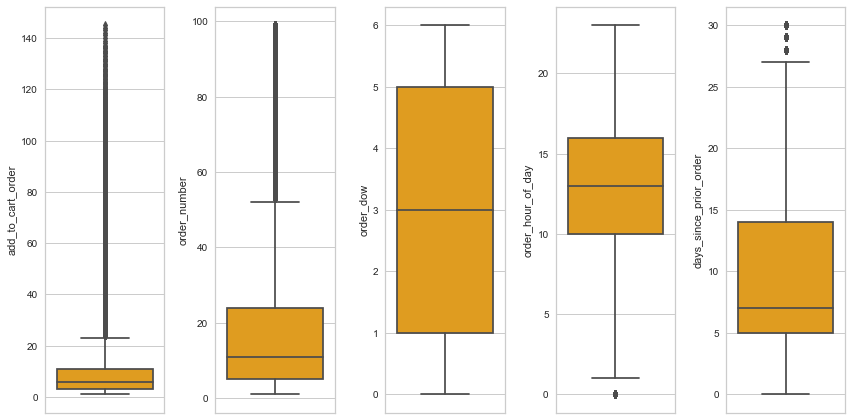

In [ ]:
# Check the outlier using Boxplot
plt.figure(figsize=(12,6))
for i in range(0, len(numeric)):
    plt.subplot(1, len(numeric), i+1)
    sns.boxplot(y=df_final[numeric[i]], color='orange')
    plt.tight_layout()

plt.show()

* There are suspected outlier on `add_to_cart_order`, `order_number`, and `order_hour_of_day`.
* If we observed further, the suspected outlier seems logical and possible. All 3 features based on the true observation/log from the User activity.
* To conclude, there is no Outlier that needs to be removed.

# Exploratory Data Analysis

In [ ]:
# Export cleaned data to csv, so we don't need to repeat the above process

#%%time
#df_final.to_csv("final_dataset.csv",index=False)

In [ ]:
df_final = pd.read_csv("final_dataset.csv")
df_final.head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
0,2,1819,8,1,202279,3,5,9,8,All Natural No Stir Creamy Almond Butter,88,13,spreads,pantry
1,2,9327,3,0,202279,3,5,9,8,Garlic Powder,104,13,spices seasonings,pantry
2,2,17794,6,1,202279,3,5,9,8,Carrots,83,4,fresh vegetables,produce
3,2,28985,2,1,202279,3,5,9,8,Michigan Organic Kale,83,4,fresh vegetables,produce
4,2,30035,5,0,202279,3,5,9,8,Natural Sweetener,17,13,baking ingredients,pantry


## Product Portfolio

In [ ]:
print("Total Products:", df_final["product_id"].nunique())

Total Products: 49677


In [ ]:
# Check product quantity for each Aisle and Department
df_final.groupby(['department','aisle']).aggregate(product_qty = ("product_name","nunique")).reset_index()

,department,aisle,product_qty
0,alcohol,beers coolers,385
1,alcohol,red wines,232
2,alcohol,specialty wines champagnes,95
3,alcohol,spirits,195
4,alcohol,white wines,147
...,...,...,...
129,snacks,ice cream toppings,85
130,snacks,mint gum,168
131,snacks,nuts seeds dried fruit,582
132,snacks,popcorn jerky,316


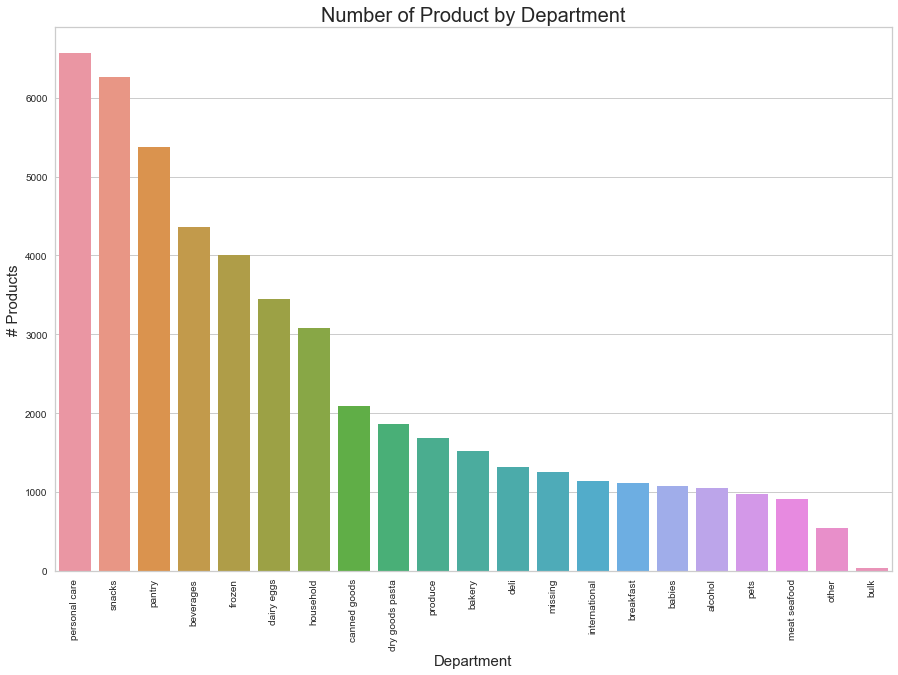

In [ ]:
# Number of Product per Category
count = df_final.groupby("department").aggregate(product_id = ("product_id","nunique")).sort_values('product_id', ascending= False).reset_index()

plt.figure(figsize=(15, 10))
p = sns.barplot(count["department"].values, count["product_id"].values)
p.set_title("Number of Product by Department", fontsize = 20)
p.set_xlabel("Department", fontsize = 15)
p.set_ylabel("# Products", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

`Personal Care` and `Snacks` category offered the most various type of products.

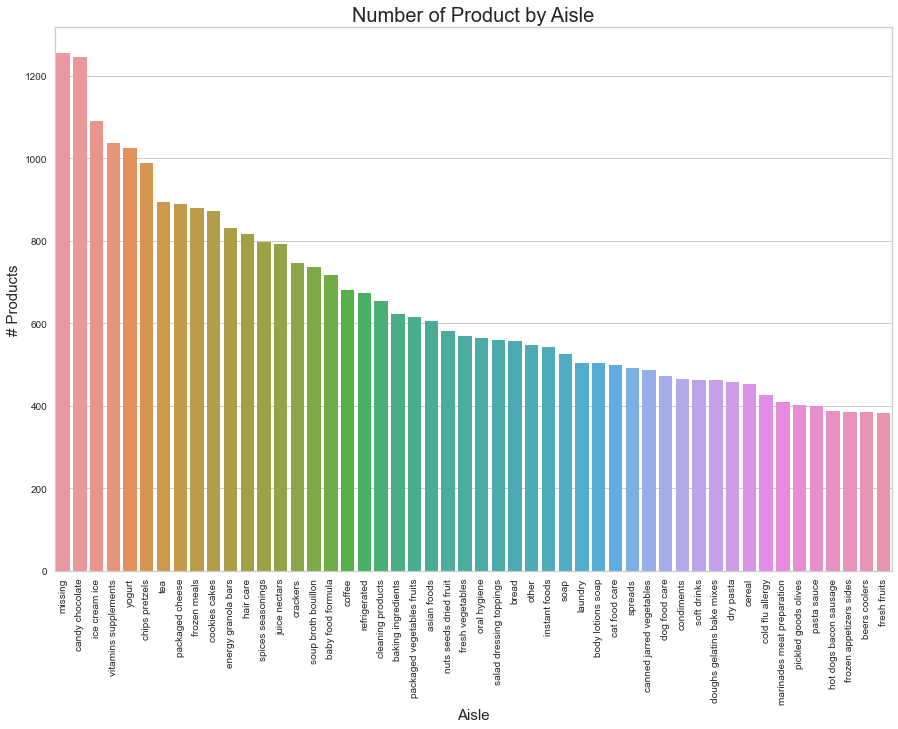

In [ ]:
# Number of Product per Aisle
count = df_final.groupby("aisle").aggregate(product_id = ("product_id","nunique")).sort_values('product_id', ascending= False).reset_index().head(50)

plt.figure(figsize=(15, 10))
p = sns.barplot(count["aisle"].values, count["product_id"].values)
p.set_title("Number of Product by Aisle", fontsize = 20)
p.set_xlabel("Aisle", fontsize = 15)
p.set_ylabel("# Products", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

`Candy Chocolate` aisle offered most variety types of products.

## Consumer Buying Behaviour

In [ ]:
print("Total Users:", df_final["user_id"].nunique())

Total Users: 206209


In [ ]:
print("Total Order:", df_final["order_id"].nunique())

Total Order: 3214874


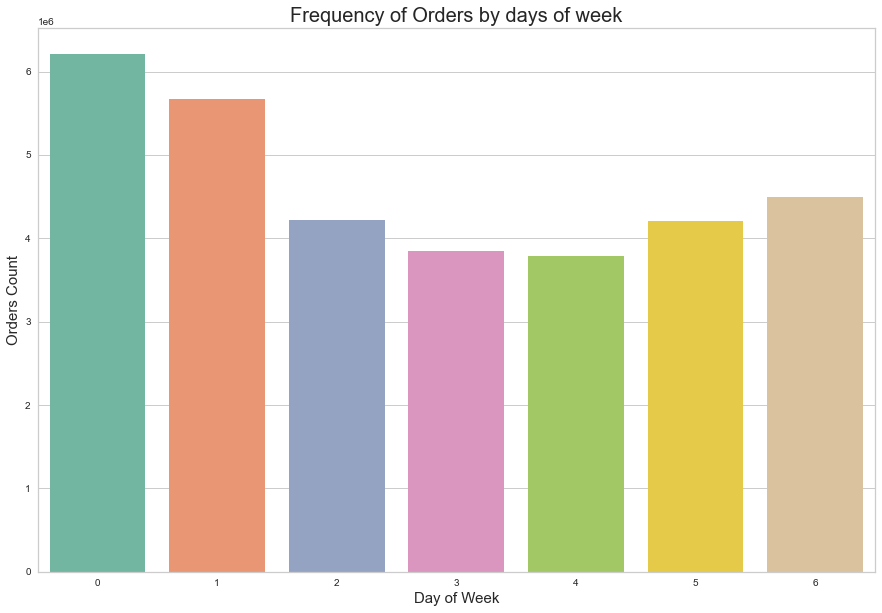

In [ ]:
# Which day of the week with the most order count?
plt.figure(figsize=(15, 10))
p = sns.countplot(x="order_dow",data = df_final)
p.set_title("Frequency of Orders by days of week", fontsize = 20)
p.set_xlabel("Day of Week", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.savefig('Frequency of Orders by Days of Week.png')
plt.show()

Most orders are placed in Day 0 & 1 (Saturday and Sunday). Most people usually shopping in the weekend. 
Tuesday and Wednesday have the least activity.

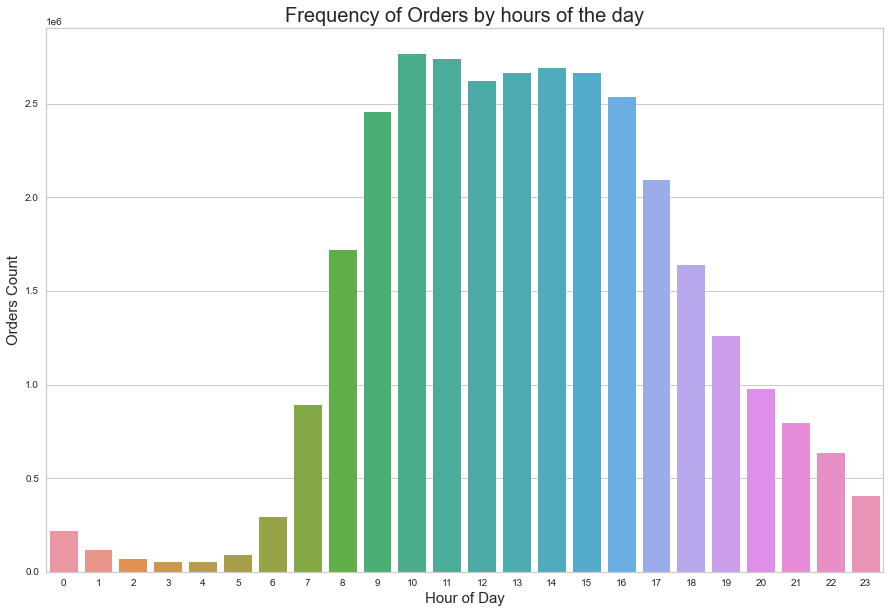

In [ ]:
# Which hour of the day with the most order count?
plt.figure(figsize=(15, 10))
p = sns.countplot(x="order_hour_of_day",data = df_final)
p.set_title("Frequency of Orders by hours of the day", fontsize = 20)
p.set_xlabel("Hour of Day", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.savefig('Frequency of Orders by Hours of the Day.png')
plt.show()

* Order starts getting busy after 8 AM. 
* The number of order almost constant between 9 AM till 4 PM. This is a range of **busy hour**.
* Order start decreasing after 4 PM.

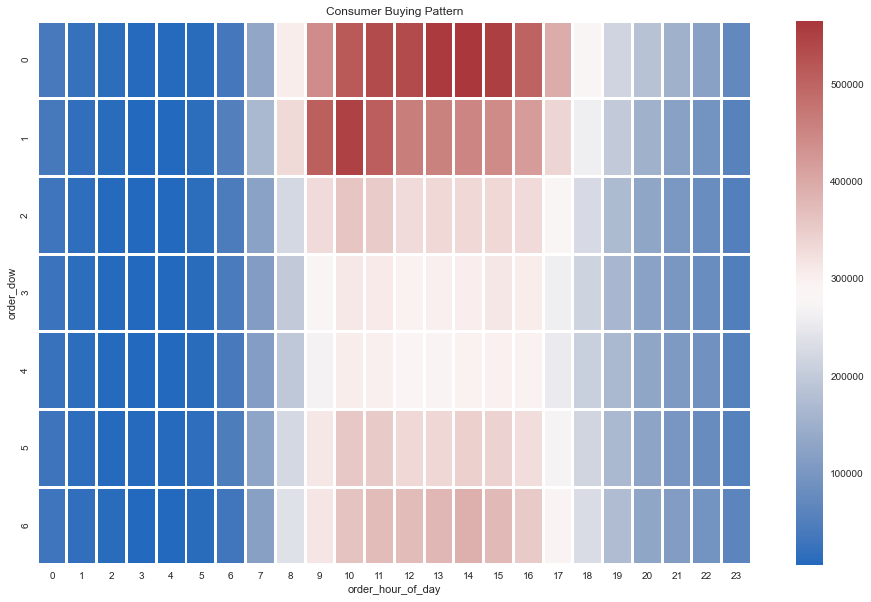

In [ ]:
# Consumer Buying Pattern
df_group = df_final.groupby(['order_dow', 'order_hour_of_day'])['order_id'].aggregate("count").reset_index()
df_group = df_group.pivot('order_dow', 'order_hour_of_day', 'order_id')

plt.figure(figsize=(16, 10))
sns.heatmap(df_group, linewidths=2, cmap="vlag")
plt.title("Consumer Buying Pattern")
plt.savefig('Correlation between Order Day of Week and Hour of Day')
plt.show()

* Most Customer shop on the weekend, from 9 AM to 4 PM.
* On the weekdays, most order are placed on Friday. Afternoon has less traffic because of working hours.
* On Tuesday & Wednesday, there is not much activity.


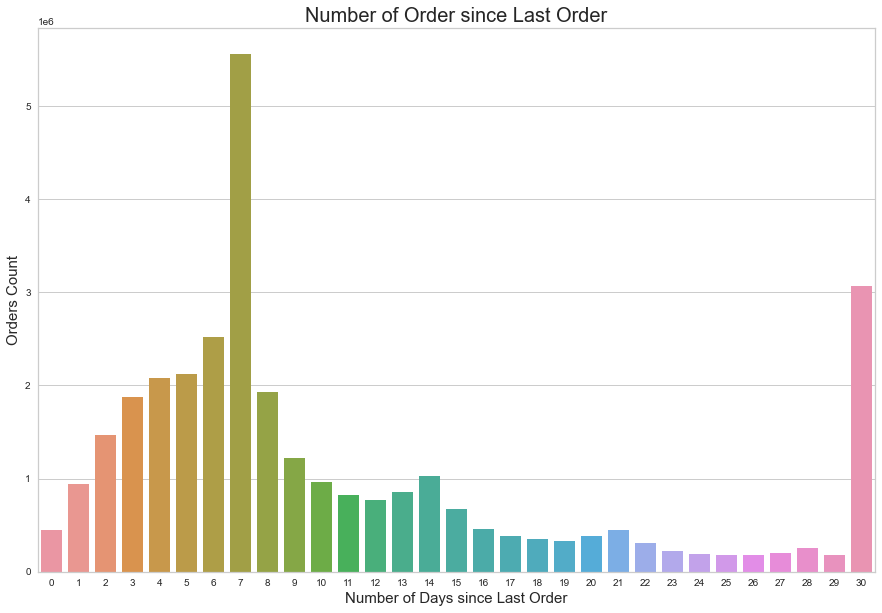

In [ ]:
# How many days the next order occur after the previous one?
plt.figure(figsize=(15, 10))
p = sns.countplot(x="days_since_prior_order",data = df_final)
p.set_title("Number of Order since Last Order", fontsize = 20)
p.set_xlabel("Number of Days since Last Order", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.savefig('Number of Order since Last Order')
plt.show()

Most people doing recurring shopping **weekly** or **monthly**.

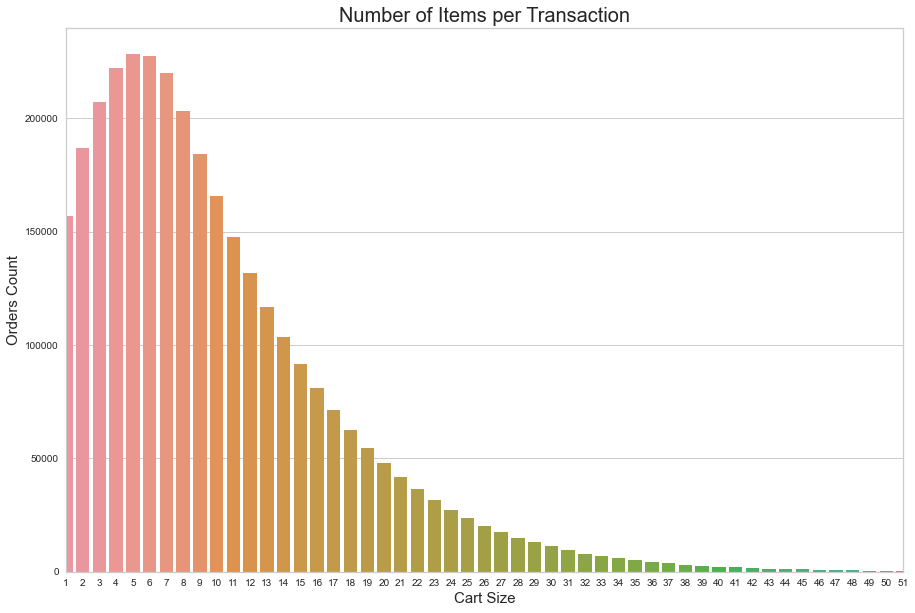

In [ ]:
# How many items which Customer purchased per transaction?

count = df_final.groupby("order_id")["add_to_cart_order"].aggregate("count").reset_index()
count = count["add_to_cart_order"].value_counts()

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Number of Items per Transaction", fontsize = 20)
p.set_xlabel("Cart Size", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
p.set(xlim=(0, 50))
plt.show()

Most people buy 1 -10 items in 1 transactions.
Most frequent transaction is 5 items per order.

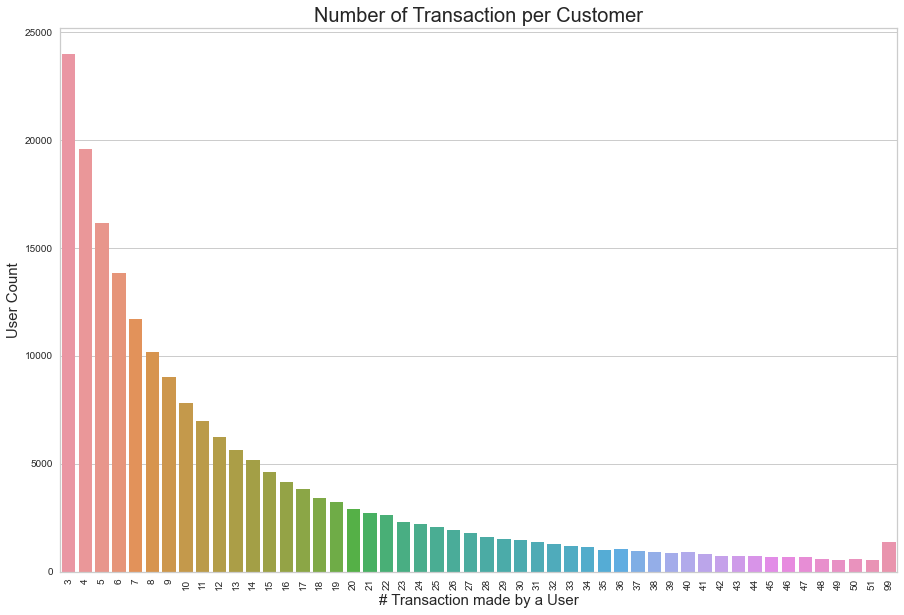

In [ ]:
# Total Transaction Made by User

count = df_final.groupby("user_id")["order_id"].aggregate("nunique").reset_index()
count = count["order_id"].value_counts().head(50)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Number of Transaction per Customer", fontsize = 20)
p.set_xlabel("# Transaction made by a User", fontsize = 15)
p.set_ylabel("User Count", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

Most user made a transaction between 3-6 transactions. It is indicated that Instacart has a problem in retaining new customer.

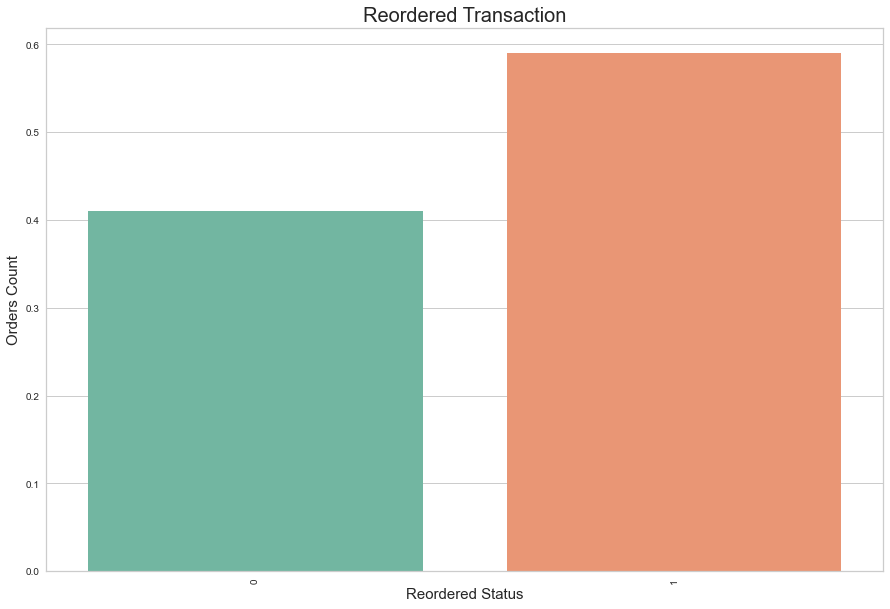

In [ ]:
# How often people order the same things again?

count = df_final["reordered"].value_counts(normalize=True)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Reordered Transaction", fontsize = 20)
p.set_xlabel("Reordered Status", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

60% of customer reordered the same things again in their next purchase.

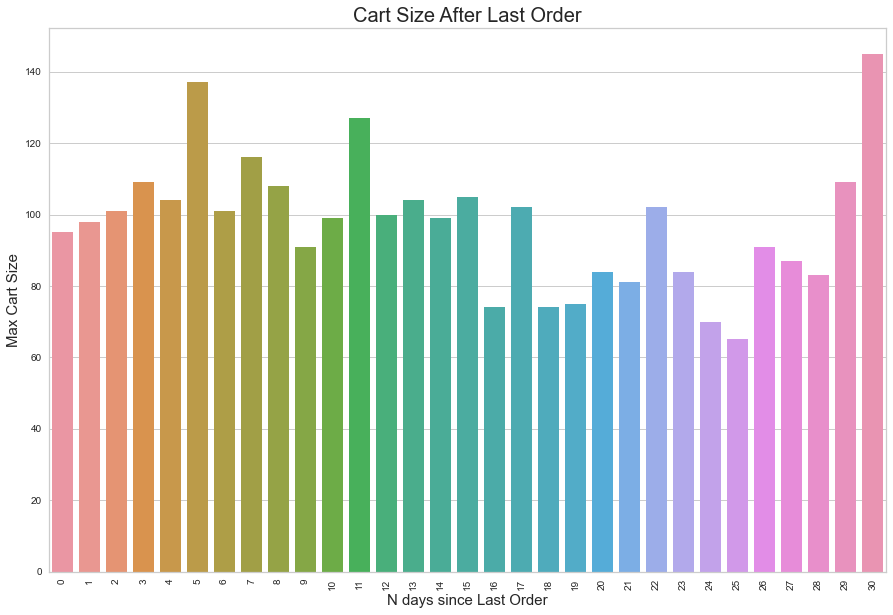

In [ ]:
# Max Cart Size after last order

count = df_final.groupby("days_since_prior_order")["add_to_cart_order"].aggregate("max").reset_index()

plt.figure(figsize=(15, 10))
p = sns.barplot(count["days_since_prior_order"].values, count["add_to_cart_order"].values)
p.set_title("Cart Size After Last Order", fontsize = 20)
p.set_xlabel("N days since Last Order", fontsize = 15)
p.set_ylabel("Max Cart Size", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

Monthly Customer tend to have most cart size compared to other customer.

## Product Statistics

In [ ]:
# List of product that never been ordered
df_products[(~df_products.product_name.isin(df_final.product_name))]

,product_id,product_name,aisle_id,department_id
3629,3630,Protein Granola Apple Crisp,57,14
3717,3718,Wasabi Cheddar Spreadable Cheese,21,16
7044,7045,Unpeeled Apricot Halves in Heavy Syrup,88,13
25382,25383,Chocolate Go Bites,61,19
27498,27499,Non-Dairy Coconut Seven Layer Bar,100,21
36232,36233,Water With Electrolytes,100,21
37702,37703,Ultra Sun Blossom Liquid 90 loads Fabric Enhan...,75,17
43724,43725,Sweetart Jelly Beans,100,21
45970,45971,12 Inch Taper Candle White,101,17
46624,46625,Single Barrel Kentucky Straight Bourbon Whiskey,31,7


There are 11 of 49677 products that never been ordered.

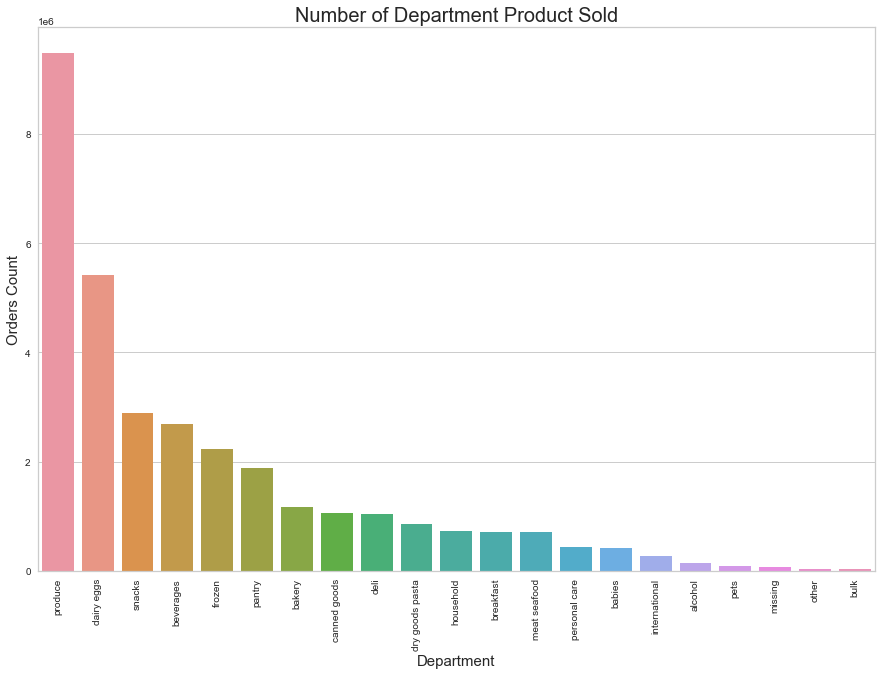

In [ ]:
# Which department's product that Customer buying the most?

count = df_final["department"].value_counts()

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Number of Department Product Sold", fontsize = 20)
p.set_xlabel("Department", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

Most people buy the product from `produce` category

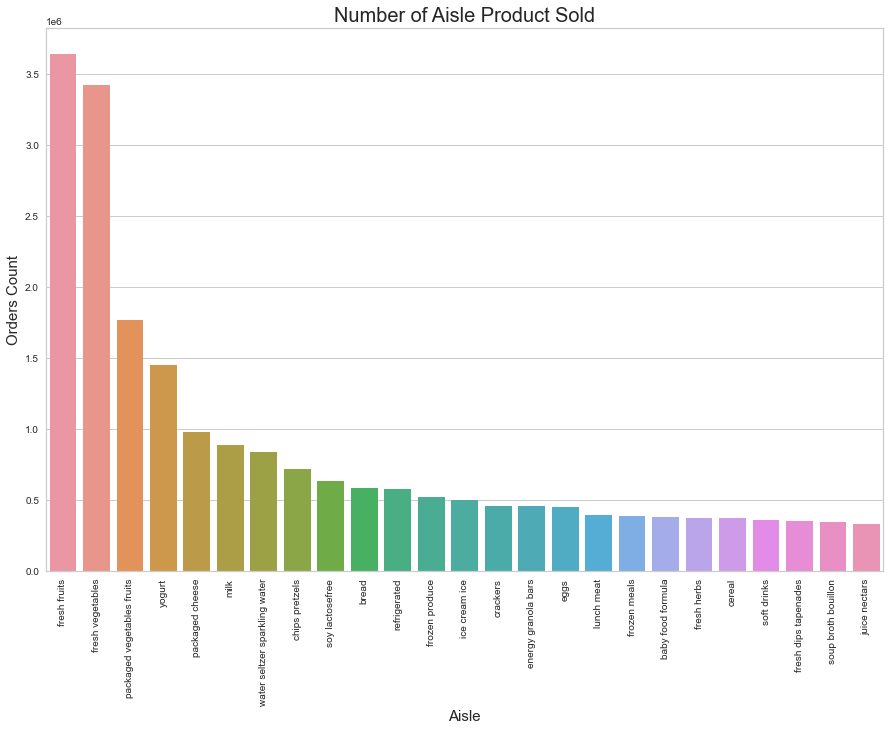

In [ ]:
# Which aisle's product that Customer buying the most?

count = df_final["aisle"].value_counts().head(25)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Number of Aisle Product Sold", fontsize = 20)
p.set_xlabel("Aisle", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

Most people buy `fresh fruits` anda `fresh vegetables` product. It seems that there are still a lot of people who care about their health condition.

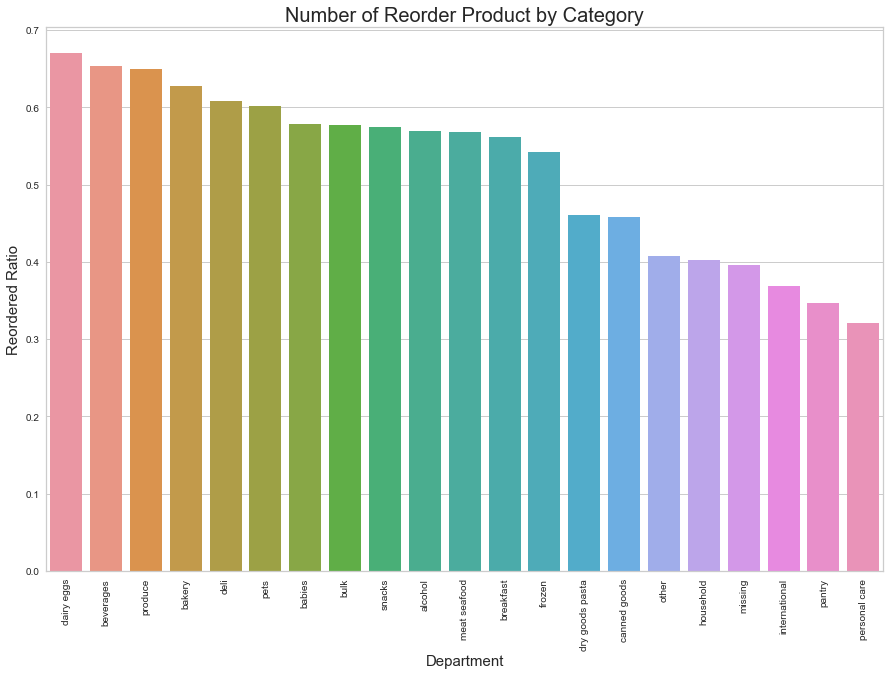

In [ ]:
# Which product category which Customer reorder most?

count = df_final.groupby("department").aggregate(reor=("reordered","mean")).sort_values('reor', ascending= False).reset_index()

plt.figure(figsize=(15, 10))
p = sns.barplot(count["department"].values, count["reor"].values)
p.set_title("Number of Reorder Product by Category", fontsize = 20)
p.set_xlabel("Department", fontsize = 15)
p.set_ylabel("Reordered Ratio", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

`Dairy eggs`, `Beverages`, and `Produce` is the Top 3 category product with highest reorder ratio.

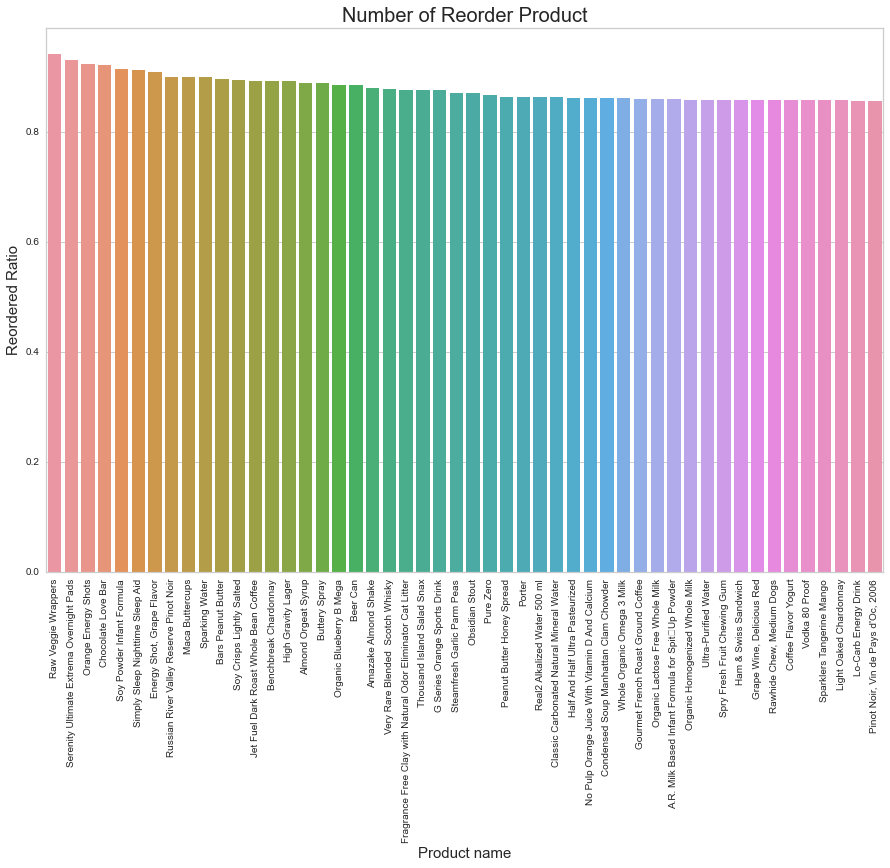

In [ ]:
# Which product that Customer reorder most?

count = df_final.groupby("product_name").aggregate(reor=("reordered","mean")).sort_values('reor', ascending= False).reset_index().head(50)

plt.figure(figsize=(15, 10))
p = sns.barplot(count["product_name"].values, count["reor"].values)
p.set_title("Number of Reorder Product", fontsize = 20)
p.set_xlabel("Product name", fontsize = 15)
p.set_ylabel("Reordered Ratio", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

Graph above shows Top 50 Most Reordered Ratio Product

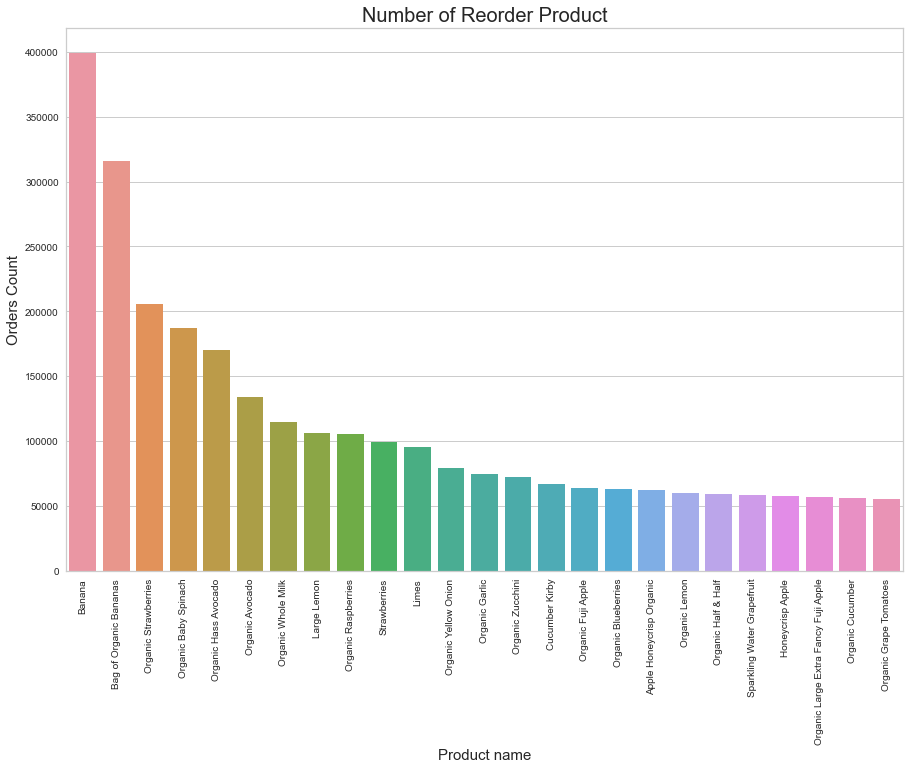

In [ ]:
# Which product do people most reordered (based on quantity)?
count = df_final[df_final["reordered"]==1]["product_name"].value_counts().head(25)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Number of Reorder Product", fontsize = 20)
p.set_xlabel("Product name", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.xticks(rotation=90)
plt.show()

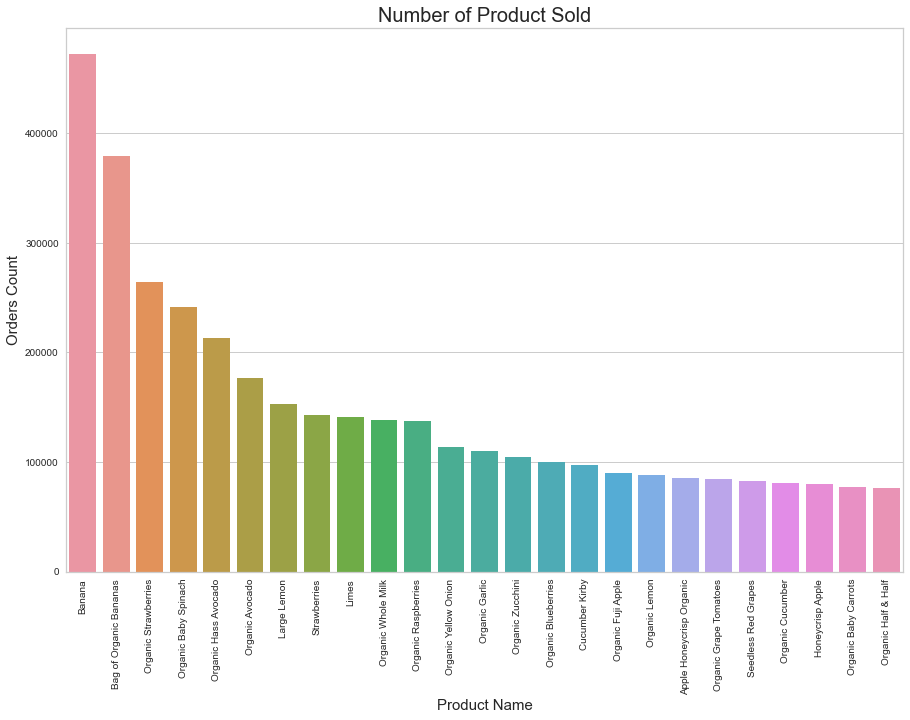

In [ ]:
# Which product that Customer buying the most?

count = df_final["product_name"].value_counts().head(25)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Number of Product Sold", fontsize = 20)
p.set_xlabel("Product Name", fontsize = 15)
p.set_ylabel("Orders Count", fontsize = 15)
plt.xticks(rotation=90)
plt.savefig('Number of Product Sold.png')
plt.show()

* `Banana` is the most ordered and most reorder product.
* The most ordered product almost the same with most reordered product

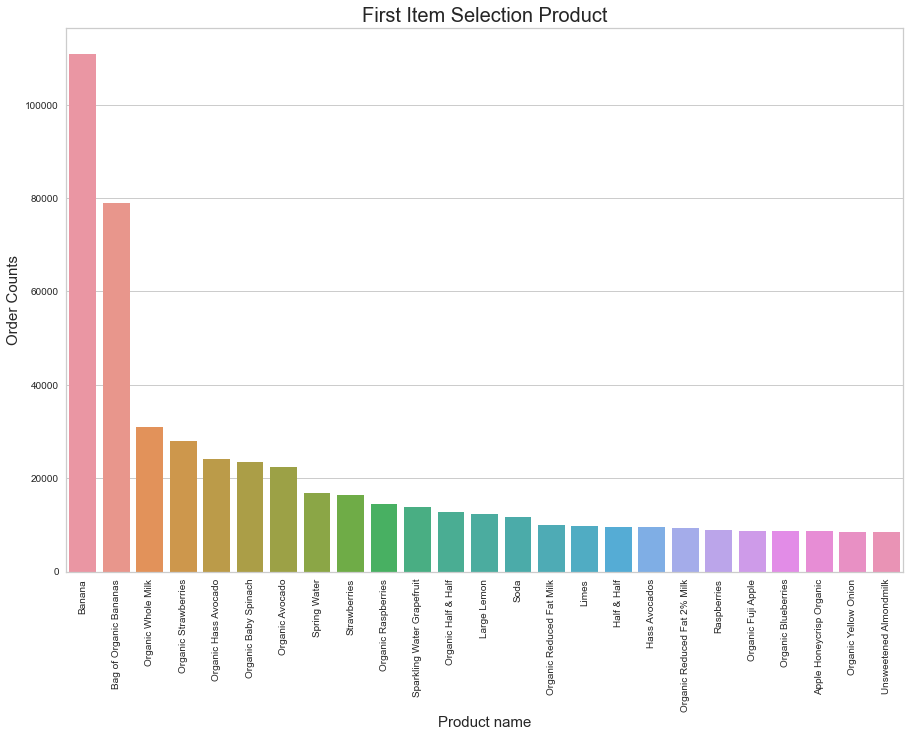

In [ ]:
# Which product do people put into cart first?

count = df_final[df_final["add_to_cart_order"]==1]["product_name"].value_counts().head(25)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("First Item Selection Product", fontsize = 20)
p.set_xlabel("Product name", fontsize = 15)
p.set_ylabel("Order Counts", fontsize = 15)
plt.xticks(rotation=90)
plt.savefig('First Item Selection.png')
plt.show()

Most product which selected first have a high chance become most reordered product.

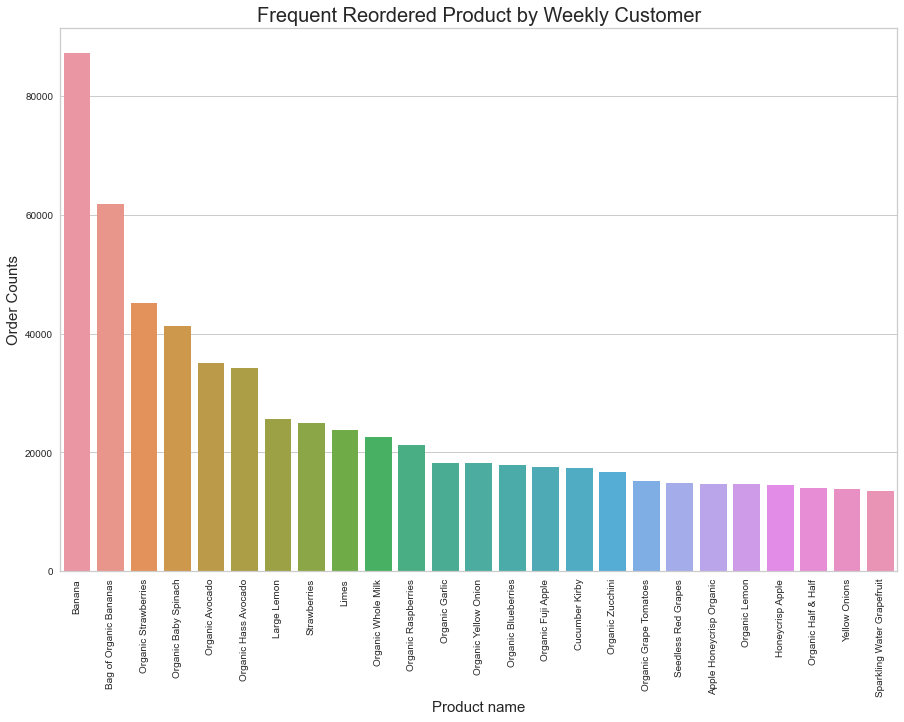

In [ ]:
# What most frequent item purchase by Weekly Customer?

count = df_final[(df_final["days_since_prior_order"]==7)]["product_name"].value_counts().head(25)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Frequent Reordered Product by Weekly Customer", fontsize = 20)
p.set_xlabel("Product name", fontsize = 15)
p.set_ylabel("Order Counts", fontsize = 15)
plt.xticks(rotation=90)
plt.savefig('Reordered Product Weekly Customer.png')
plt.show()

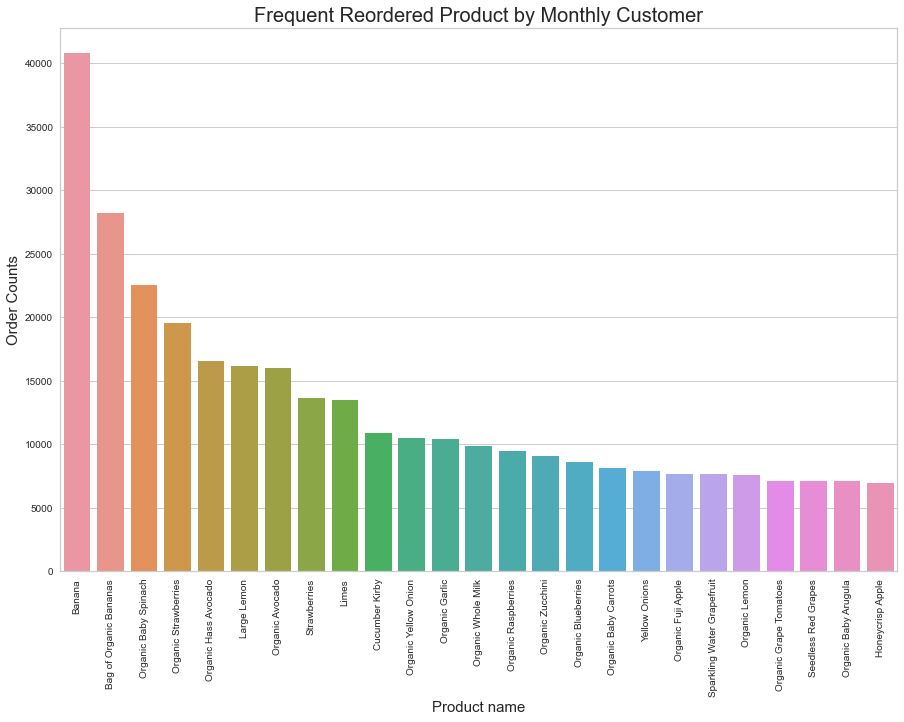

In [ ]:
# What most frequent item purchase by Monthly Customer?

count = df_final[(df_final["days_since_prior_order"]==30)]["product_name"].value_counts().head(25)

plt.figure(figsize=(15, 10))
p = sns.barplot(count.index, count.values)
p.set_title("Frequent Reordered Product by Monthly Customer", fontsize = 20)
p.set_xlabel("Product name", fontsize = 15)
p.set_ylabel("Order Counts", fontsize = 15)
plt.xticks(rotation=90)
plt.savefig('Reordered Product Monthly Customer.png')
plt.show()

Most recurring customer purchased the same item.

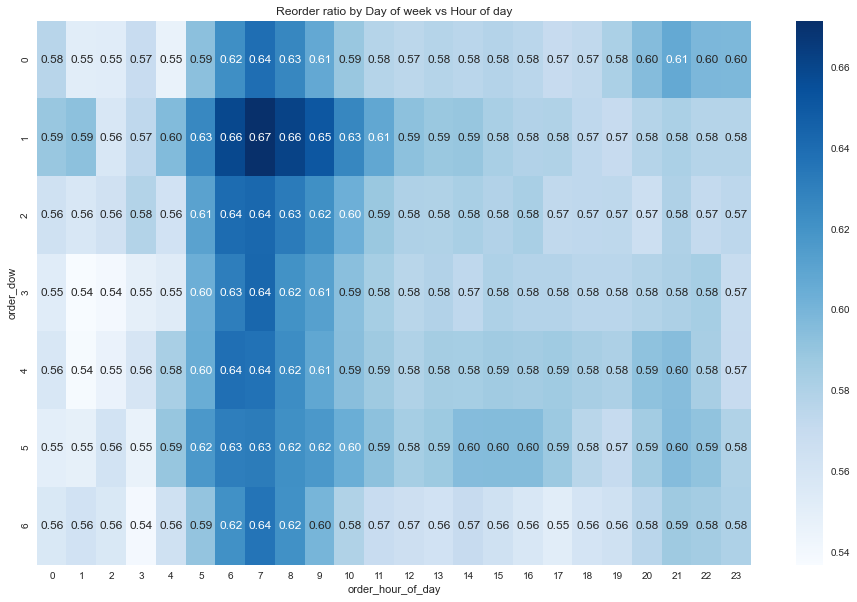

In [ ]:
# Correlation between Reordered Ratio with Day and Hour of Purchase

df_group = df_final.groupby(['order_dow', 'order_hour_of_day'])['reordered'].aggregate("mean").reset_index()
df_group = df_group.pivot('order_dow', 'order_hour_of_day', 'reordered')

plt.figure(figsize=(16, 10))
sns.heatmap(df_group, annot=True, fmt = ".2f", cmap="Blues")
plt.title("Reorder ratio by Day of week vs Hour of day")
plt.savefig('Correlation Ratio between Day of Week and Hour of Day.png')
plt.show()

Most reordered happens on Sunday 7 AM. Most likely at this time, Weekly Customer do their shopping.

# Customer Segmentation

## Based on Customer Spending Profile

### RFM metrics (Recency, Frequency, Monetary)

In order to achieve better **customer retention** and **profitability**, the company needs to **customize marketing strategies** and fulfill different customers’ needs by allocating resources effectively and efficiently (Huang et al., 2009; Chang et al., 2010)

**RFM (recency, frequency and monetary)** model is a behavior-based model used to **analyze the behavior of a customer** by measuring when people buy, how often they buy and how much they buy. (Hughes, 1996; Yeh et al., 2009).


Why using RFM?
1. RFM is **cost-effective** in acquiring important customer behavior analysis and is **easy to quantify customer behavior**.
2. It is **very effective** as the purchase behavior can be summarized by **using a small number of variables**.
3. RFM variables are gathered via an internal database regarding the transaction history and are not obtained through the aggregate level information in the demographic databases. Hence, **RFM is more meaningful for targeting particular customers** (Kaymak, 2001).


In [ ]:
# Create recency feature by averaging days_since_prior_order
recency = df_final.groupby("user_id").aggregate(recency=("days_since_prior_order","mean")).reset_index()
recency

,user_id,recency
0,1,19.135593
1,2,15.369231
2,3,10.977273
3,4,13.500000
4,5,12.270270
...,...,...
206204,206205,13.406250
206205,206206,4.084211
206206,206207,14.031390
206207,206208,7.434269


In [ ]:
recency.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,206209.0,103105.000000,59527.555167,1.000000,51553.000000,103105.000000,154657.000000,206209.000000
recency,206209.0,13.969104,5.771688,0.389091,9.266667,13.635294,18.310345,29.772277


In [ ]:
# Create frequency feature from order_number
freq = df_final.groupby("user_id").aggregate(frequency=("order_number","max")).reset_index()
freq

,user_id,frequency
0,1,10
1,2,14
2,3,12
3,4,5
4,5,4
...,...,...
206204,206205,3
206205,206206,67
206206,206207,16
206207,206208,49


In [ ]:
freq.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,206209.0,103105.000000,59527.555167,1.0,51553.0,103105.0,154657.0,206209.0
frequency,206209.0,15.590367,16.654774,3.0,5.0,9.0,19.0,99.0


In [ ]:
# Create monetary feature from the size of the order
monetary = df_final.groupby("user_id").aggregate(monetary = ('add_to_cart_order','mean')).reset_index()
monetary

,user_id,monetary
0,1,3.627119
1,2,8.553846
2,3,4.443182
3,4,2.777778
4,5,5.513514
...,...,...
206204,206205,6.781250
206205,206206,3.835088
206206,206207,8.695067
206207,206208,8.516987


In [ ]:
monetary.describe().T

,count,mean,std,min,25%,50%,75%,max
user_id,206209.0,103105.000000,59527.555167,1.0,51553.000000,103105.000000,154657.000000,206209.000000
monetary,206209.0,6.419987,3.320795,1.0,4.035714,5.892857,8.216667,39.775801


In [ ]:
# Create new df for RFM metrics
df_profile = pd.merge(recency, freq, on='user_id')
df_profile = pd.merge(df_profile, monetary, on='user_id')
df_profile

,user_id,recency,frequency,monetary
0,1,19.135593,10,3.627119
1,2,15.369231,14,8.553846
2,3,10.977273,12,4.443182
3,4,13.500000,5,2.777778
4,5,12.270270,4,5.513514
...,...,...,...,...
206204,206205,13.406250,3,6.781250
206205,206206,4.084211,67,3.835088
206206,206207,14.031390,16,8.695067
206207,206208,7.434269,49,8.516987


In [ ]:
# Give score 1 - 5 for RFM metrics
df_profile["RecencyScore"] = pd.qcut(df_profile["recency"],5,labels=[5,4,3,2,1])
df_profile["FrequencyScore"] = pd.qcut(df_profile["frequency"].rank(method="first"),5,labels=[1,2,3,4,5])
df_profile["MonetaryScore"] = pd.qcut(df_profile["monetary"],5,labels=[1,2,3,4,5])
df_profile

,user_id,recency,frequency,monetary,RecencyScore,FrequencyScore,MonetaryScore
0,1,19.135593,10,3.627119,2,3,2
1,2,15.369231,14,8.553846,3,4,4
2,3,10.977273,12,4.443182,4,3,2
3,4,13.500000,5,2.777778,3,2,1
4,5,12.270270,4,5.513514,3,1,3
...,...,...,...,...,...,...,...
206204,206205,13.406250,3,6.781250,3,1,4
206205,206206,4.084211,67,3.835088,5,5,2
206206,206207,14.031390,16,8.695067,3,4,4
206207,206208,7.434269,49,8.516987,5,5,4


### K-Means Clustering

In [ ]:
# Create customer segmentation using K-Means Clustering as a Baseline
rfm_kmeans = df_profile.loc[:,"recency":"monetary"]
rfm_kmeans

,recency,frequency,monetary
0,19.135593,10,3.627119
1,15.369231,14,8.553846
2,10.977273,12,4.443182
3,13.500000,5,2.777778
4,12.270270,4,5.513514
...,...,...,...
206204,13.406250,3,6.781250
206205,4.084211,67,3.835088
206206,14.031390,16,8.695067
206207,7.434269,49,8.516987


In [ ]:
# Create customer segmentation using K-Means Clustering (Score Metric 1-5)
rfm_kmeans1 = df_profile.loc[:,"RecencyScore":"MonetaryScore"]
rfm_kmeans1

,RecencyScore,FrequencyScore,MonetaryScore
0,2,3,2
1,3,4,4
2,4,3,2
3,3,2,1
4,3,1,3
...,...,...,...
206204,3,1,4
206205,5,5,2
206206,3,4,4
206207,5,5,4


In [ ]:
# Define function to check skewness of the data
def check_skew(df, column):
    skew = stats.skew(df[column])
    skewtest = stats.skewtest(df[column])
    plt.title('Distribution of ' + column)
    sns.distplot(df[column])
    print("{}'s: Skew: {}, : {}".format(column, skew, skewtest))
    return 

recency's: Skew: 0.222856433128165, : SkewtestResult(statistic=40.8196172593155, pvalue=0.0)
frequency's: Skew: 2.4004387890920955, : SkewtestResult(statistic=272.36879447959876, pvalue=0.0)
monetary's: Skew: 1.1206411209789362, : SkewtestResult(statistic=169.82688033953346, pvalue=0.0)


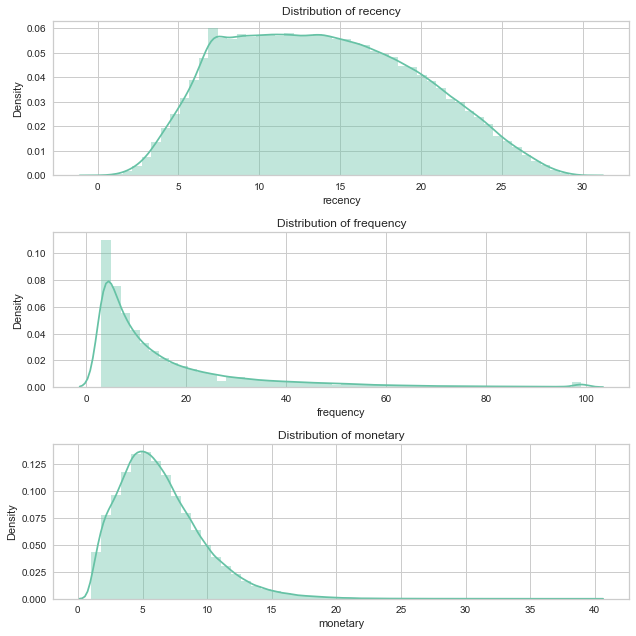

In [ ]:
# Plot all 3 graphs together for summary findings
plt.figure(figsize=(9, 9))

plt.subplot(3, 1, 1)
check_skew(rfm_kmeans,'recency')

plt.subplot(3, 1, 2)
check_skew(rfm_kmeans,'frequency')

plt.subplot(3, 1, 3)
check_skew(rfm_kmeans,'monetary')

plt.tight_layout()

It seems `Frequency` is strongly positively skewed. So, it needs to be log transformed.

In [ ]:
rfm_kmeans.describe().T

,count,mean,std,min,25%,50%,75%,max
recency,206209.0,13.969104,5.771688,0.389091,9.266667,13.635294,18.310345,29.772277
frequency,206209.0,15.590367,16.654774,3.000000,5.000000,9.000000,19.000000,99.000000
monetary,206209.0,6.419987,3.320795,1.000000,4.035714,5.892857,8.216667,39.775801


In [ ]:
# Perform log transformation for frequency
rfm_kmeans['frequency'] = np.log(rfm_kmeans['frequency'])

recency's: Skew: 0.222856433128165, : SkewtestResult(statistic=40.8196172593155, pvalue=0.0)
frequency's: Skew: 0.4372400100404667, : SkewtestResult(statistic=77.61578508325408, pvalue=0.0)
monetary's: Skew: 1.1206411209789362, : SkewtestResult(statistic=169.82688033953346, pvalue=0.0)


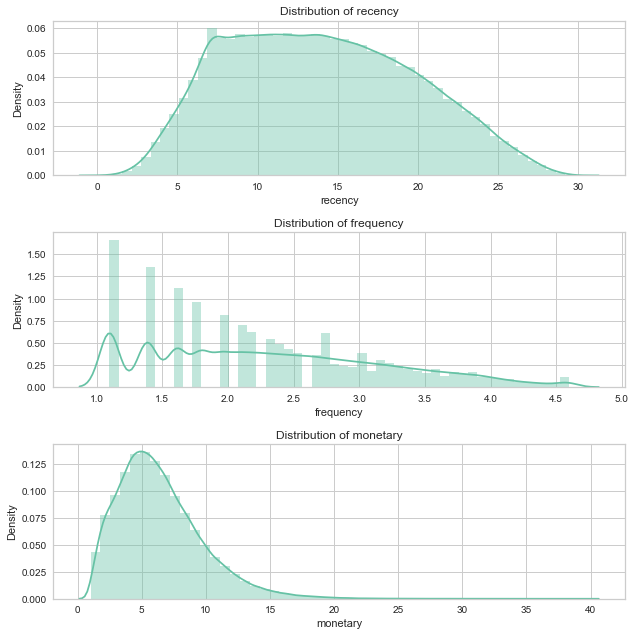

In [ ]:
# Plot all 3 graphs together for summary findings
plt.figure(figsize=(9, 9))

plt.subplot(3, 1, 1)
check_skew(rfm_kmeans,'recency')

plt.subplot(3, 1, 2)
check_skew(rfm_kmeans,'frequency')

plt.subplot(3, 1, 3)
check_skew(rfm_kmeans,'monetary')

plt.tight_layout()

In [ ]:
# Standardization of the data (Baseline)
sc = StandardScaler()
data = sc.fit_transform(rfm_kmeans)

In [ ]:
# Standardization of the data (Using Score Metric)
sc = StandardScaler()
data1 = sc.fit_transform(rfm_kmeans1)

In [ ]:
# Convert to DataFrame and check summary stats (Baseline)
data = pd.DataFrame(data)
data.describe().round(3)

,0,1,2
count,206209.000,206209.000,206209.000
mean,-0.000,0.000,0.000
std,1.000,1.000,1.000
min,-2.353,-1.400,-1.632
25%,-0.815,-0.820,-0.718
50%,-0.058,-0.152,-0.159
75%,0.752,0.697,0.541
max,2.738,2.572,10.045


In [ ]:
# Convert to DataFrame and check summary stats (Using Score Metric)
data1 = pd.DataFrame(data1)
data1.describe().round(3)

,0,1,2
count,206209.000,206209.000,206209.000
mean,-0.000,0.000,0.000
std,1.000,1.000,1.000
min,-1.414,-1.414,-1.414
25%,-0.707,-0.707,-0.707
50%,-0.000,0.000,0.000
75%,0.707,0.707,0.707
max,1.414,1.414,1.414


### *K-Value* Selection

Baseline

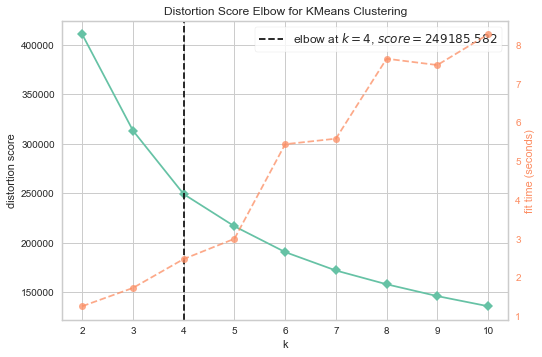

Wall time: 43.5 s


<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Hyperparameter tuning for k value using Distortion (sum of square errors) Score

%%time
kmeans = KMeans(random_state=42)
visualizer = KElbowVisualizer(kmeans, k = (2,11))
visualizer.fit(data)
visualizer.poof();

It is advisable to conduct iterations with *k, k+1, k-1* clusters after setting the hyperparameters and deciding the value of *'k'* to analyze the variation in the narrative and usefulness of the output segments. We can determine whether we have found the solution or not by analyzing the results of these three iterations statistically and from a business standpoint. So, I will compare k value 3, 4, and 5.

In [ ]:
# Define function to plot and calculate the Sillhouette Score
def sil_visualizer(data, k): 
    model = KMeans(k, random_state=42)
    visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

    visualizer.fit(data)        # Fit the data to the visualizer
    visualizer.poof()        # Finalize and render the figure

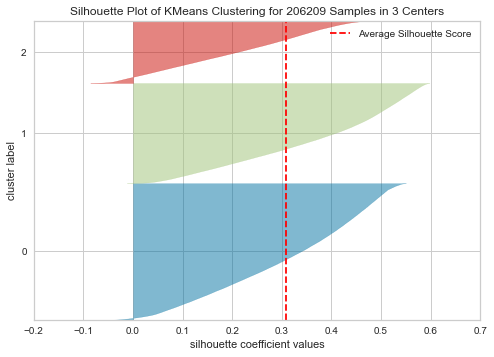

Wall time: 14min 14s


In [ ]:
# k = 3
%%time
sil_visualizer(data,3)

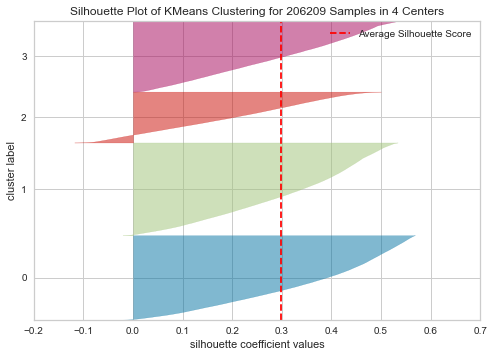

Wall time: 13min 15s


In [ ]:
# k = 4
%%time
sil_visualizer(data,4)

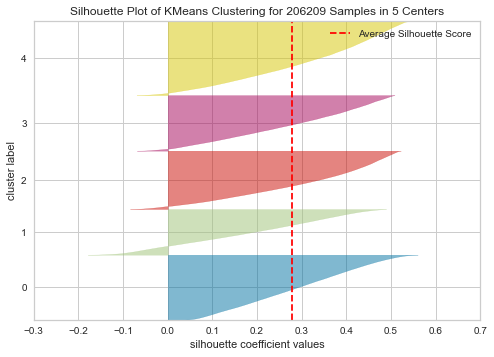

Wall time: 13min 11s


In [ ]:
# k = 5
%%time
sil_visualizer(data,5)

Using Score Metric

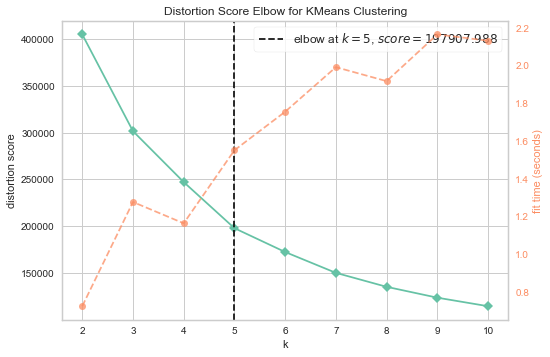

Wall time: 15.1 s


<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Hyperparameter tuning for k value using Distortion (sum of square errors) Score (Score Metric 1-5)

%%time
kmeans = KMeans(random_state=42)
visualizer = KElbowVisualizer(kmeans, k = (2,11))
visualizer.fit(data1)
visualizer.poof();

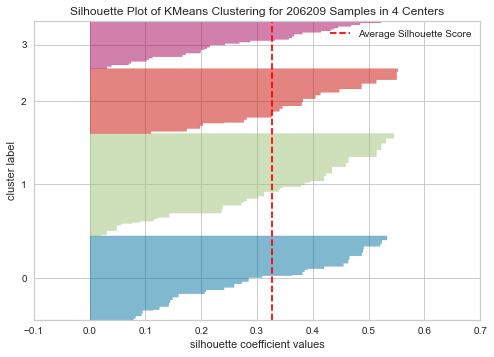

Wall time: 13min 8s


In [ ]:
# k = 4
%%time
sil_visualizer(data1,4)

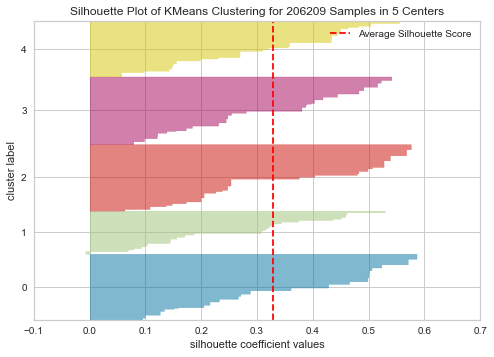

Wall time: 12min 47s


In [ ]:
# k = 5
%%time
sil_visualizer(data1,5)

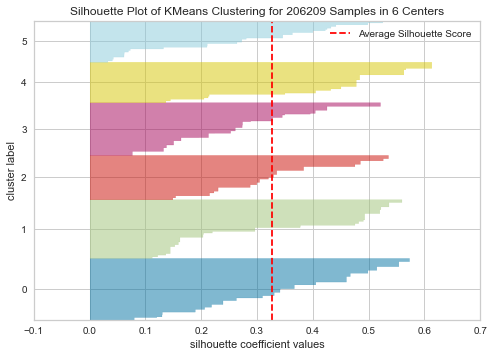

Wall time: 12min 45s


In [ ]:
# k = 6
%%time
sil_visualizer(data1,6)

In [ ]:
# Define a function to calculate specified # of clusters
def kmeans(df, clusters_number):
    
    kmeans = KMeans(n_clusters = clusters_number, random_state = 42)
    kmeans.fit(df)

    # Extract cluster labels
    cluster_labels = kmeans.labels_
        
    # Create a cluster label column in original dataset
    df_new = df.assign(Cluster = cluster_labels)
    df_new = df_new.rename({0: 'recency', 1: 'frequency',2:'monetary'}, axis=1)

    return df_new

Baseline

In [ ]:
# Calculate the Clusters
k3 = kmeans(data,3)
k4 = kmeans(data,4)
k5 = kmeans(data,5)

In [ ]:
k3

,recency,frequency,monetary,Cluster
0,0.895146,-0.032635,-0.841026,0
1,0.242586,0.349632,0.642576,2
2,-0.518365,0.174501,-0.595282,1
3,-0.081277,-0.820120,-1.096791,0
4,-0.294340,-1.073633,-0.272969,0
...,...,...,...,...
206204,-0.097520,-1.400469,0.108788,0
206205,-1.712656,2.128351,-0.778400,1
206206,0.010792,0.501337,0.685103,2
206207,-1.132225,1.772897,0.631477,1


In [ ]:
# Define function to calculate average RFM value and size for each cluster
def rfm_values(df):
    df_new = df.groupby(['Cluster']).agg({
        'recency': 'mean',
        'frequency': 'mean',
        'monetary': ['mean', 'count']
    }).round(0)
    
    return df_new

In [ ]:
# k = 3
rfm_values(k3)

recency frequency monetary       
           mean      mean     mean  count
Cluster                                  
0           1.0      -1.0     -1.0  94235
1          -1.0       1.0     -0.0  69096
2           0.0      -0.0      1.0  42878

In [ ]:
# k = 4
rfm_values(k4)

recency frequency monetary       
           mean      mean     mean  count
Cluster                                  
0          -1.0       1.0     -0.0  58335
1           1.0      -1.0     -0.0  63975
2           0.0      -0.0      2.0  35084
3          -1.0      -1.0     -0.0  48815

In [ ]:
# k = 5
rfm_values(k5)

recency frequency monetary       
           mean      mean     mean  count
Cluster                                  
0           0.0       0.0     -0.0  44898
1           0.0      -0.0      2.0  31506
2          -1.0       1.0      0.0  40249
3          -1.0      -1.0     -0.0  38323
4           1.0      -1.0     -0.0  51233

Using Score Metric

In [ ]:
# Calculate the Clusters
k4_i = kmeans(data1,4)
k5_i = kmeans(data1,5)
k6_i = kmeans(data1,6)

In [ ]:
# Define function to plot the resulting cluster

def tsne_plot(df_new):
   
    # Initialise TSNE
    model = TSNE(random_state=1)
    transformed = model.fit_transform(df_new)
    
    # Plot t-SNE
    plt.title('Flattened Graph of Clusters')
    sns.scatterplot(x=transformed[:,0], y=transformed[:,1], hue=df_new["Cluster"], style=df_new["Cluster"], palette="Set1")

Wall time: 24min 40s


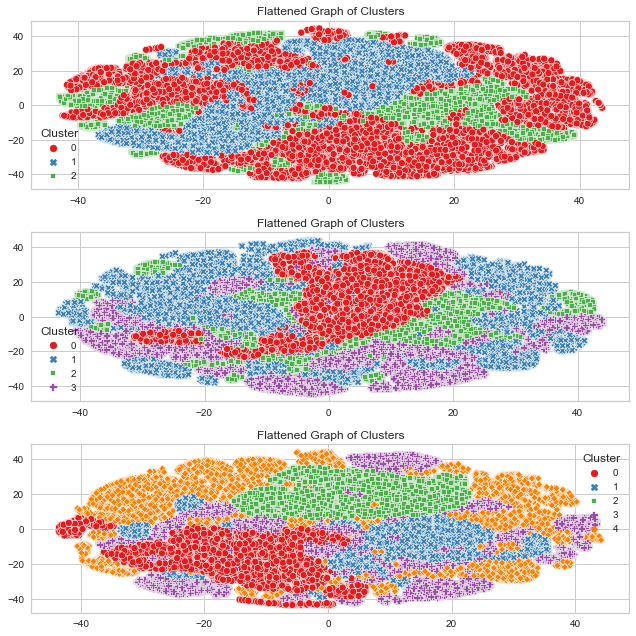

In [ ]:
# Plot the resulting cluster
%%time
plt.figure(figsize=(9, 9))

plt.subplot(3, 1, 1)
tsne_plot(k3)

plt.subplot(3, 1, 2)
tsne_plot(k4)

plt.subplot(3, 1, 3)
tsne_plot(k5)

plt.tight_layout()

It seems the flattened graph can not truly show the resulting cluster because of a lot overlapped point. So, we need other methods to check the resulting clusters.

### Snake Plot

In [ ]:
# Define function to create snake plot of the resulting cluster

def snake_plot(k):

    # Convert clusters to DataFrame with appropriate index and column names
    cluster_df = pd.DataFrame(k)
    cluster_df.index = rfm_kmeans.index
    cluster_df.columns = ['recency', 'frequency', 
                          'monetary', 'Cluster']
    cluster_df = cluster_df.reset_index()
    cluster_df = cluster_df.rename(columns = {'index':'user_id'})
    cluster_df

    # Reshape data for snake plot
    cluster_melt = pd.melt(cluster_df.reset_index(),
                       id_vars=['user_id', 'Cluster'],
                       value_vars=['recency', 
                                   'frequency', 
                                   'monetary'],
                       var_name='Metric',
                       value_name='Value')
    
    # Create snake plot
    plt.figure(figsize=(10,5))
    palette = sns.color_palette("tab10")
    sns.pointplot(x='Metric', y='Value', data=cluster_melt, hue='Cluster', 
                  palette=palette)
    plt.xlabel('')
    plt.ylabel('Value')
    plt.yticks([])
    plt.title('Customer Segments')
    sns.despine()
    plt.tight_layout()
    plt.savefig('snake_plot.png')
    plt.show();

Baseline

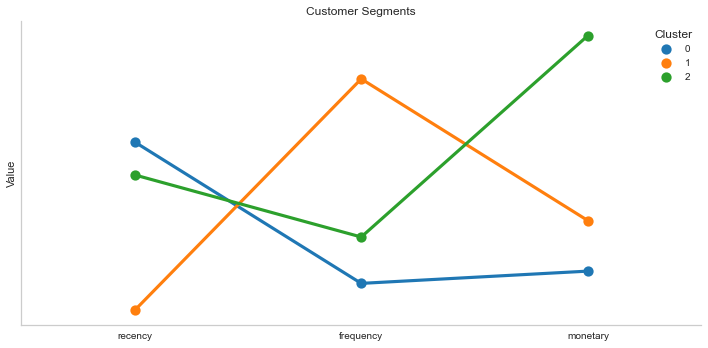

<Figure size 576x396 with 0 Axes>

In [ ]:
# k = 3
snake_plot(k3)
plt.savefig('snake_plot_3.png')

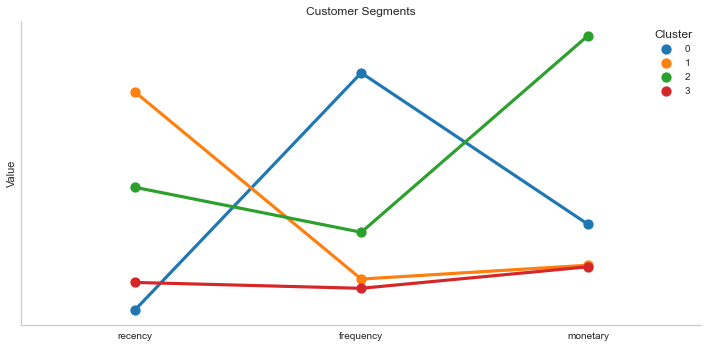

In [ ]:
# k = 4
snake_plot(k4)

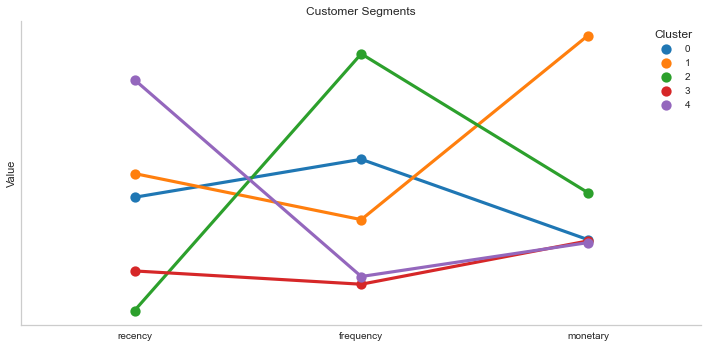

In [ ]:
k = 5
snake_plot(k5)

Using Score Metric

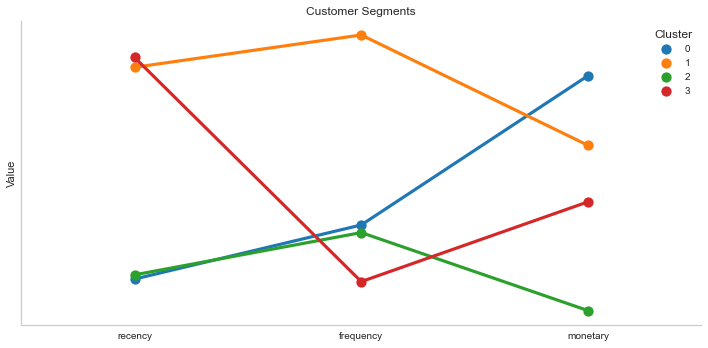

In [ ]:
# k = 4
snake_plot(k4_i)

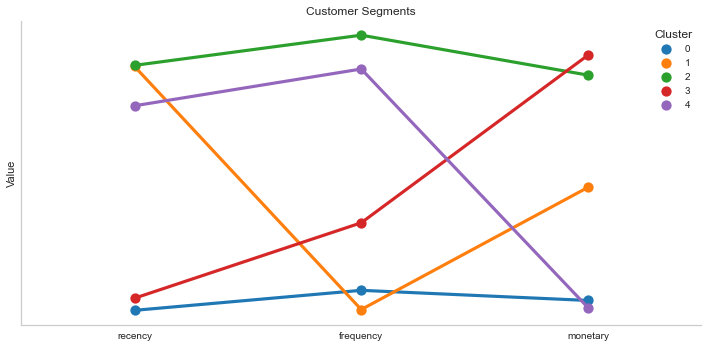

In [ ]:
# k = 5
snake_plot(k5_i)

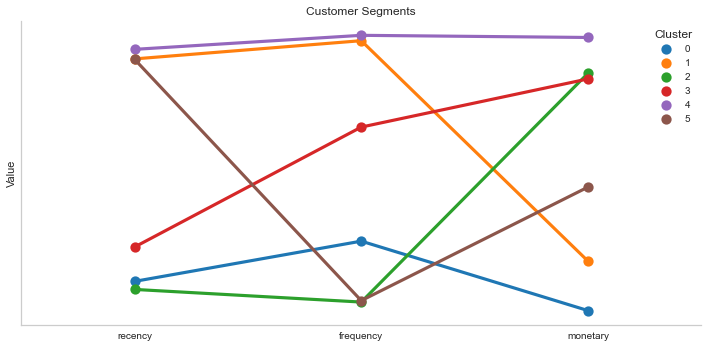

In [ ]:
# k = 6
snake_plot(k6_i)

### 3D Plot

In [ ]:
# Create function to plot resulting cluster in 3D axis

def plot_3d(n):
  kmeans = KMeans(n_clusters = n, random_state=99).fit(data)
  cluster = kmeans.labels_
  df_cluster = df_profile.copy()
  df_cluster["cluster_profile"] = cluster
  df_cluster["cluster_profile"] = df_cluster["cluster_profile"] + 1

  fig = plt.figure(figsize=(15,10))
  ax = fig.add_subplot(111, projection='3d')
  ax.scatter(df_cluster.frequency[df_cluster.cluster_profile == 1], df_cluster.monetary[df_cluster.cluster_profile == 1], df_cluster.recency[df_cluster.cluster_profile == 1], c='blue', s=100, edgecolor='black',linestyle='--')
  ax.scatter(df_cluster.frequency[df_cluster.cluster_profile == 2], df_cluster.monetary[df_cluster.cluster_profile == 2], df_cluster.recency[df_cluster.cluster_profile == 2], c='red', s=100, edgecolor='black',linestyle='--')
  ax.scatter(df_cluster.frequency[df_cluster.cluster_profile == 3], df_cluster.monetary[df_cluster.cluster_profile == 3], df_cluster.recency[df_cluster.cluster_profile == 3], c='green', s=100, edgecolor='black',linestyle='--')
  if df_cluster["cluster_profile"].max() > 3:
    ax.scatter(df_cluster.frequency[df_cluster.cluster_profile == 4], df_cluster.monetary[df_cluster.cluster_profile == 4], df_cluster.recency[df_cluster.cluster_profile == 4], c='black', s=100, edgecolor='black',linestyle='--')
  if df_cluster["cluster_profile"].max() > 4:
    ax.scatter(df_cluster.frequency[df_cluster.cluster_profile == 5], df_cluster.monetary[df_cluster.cluster_profile == 5], df_cluster.recency[df_cluster.cluster_profile == 5], c='yellow', s=100, edgecolor='black',linestyle='--')
  
  plt.xlabel("Frequency")
  plt.ylabel("Monetary")
  ax.set_zlabel('Recency')
  plt.show()

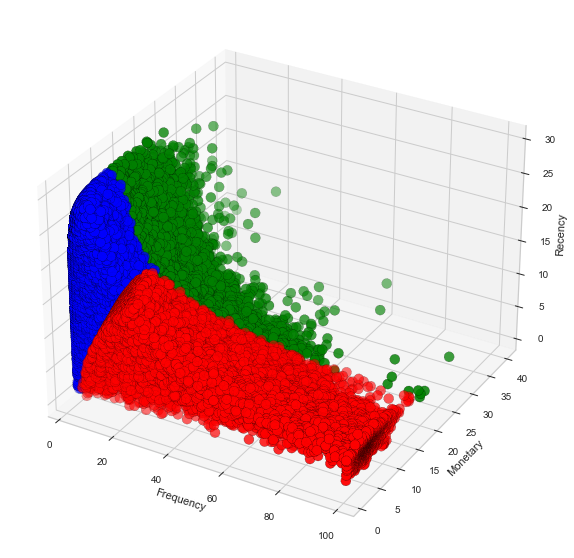

In [ ]:
# k = 3
plot_3d(3)

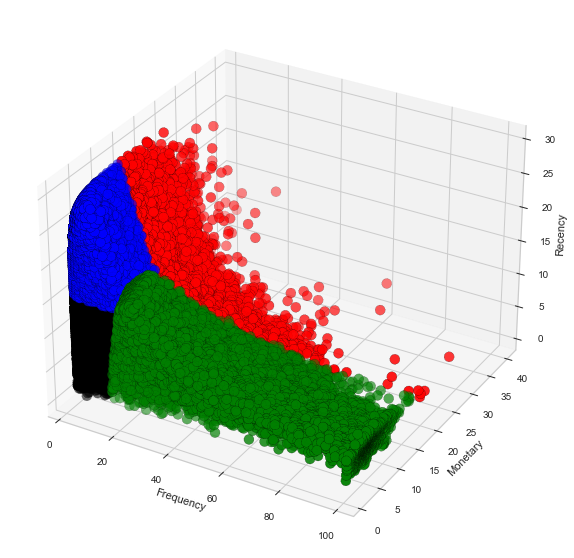

In [ ]:
# k = 4
plot_3d(4)

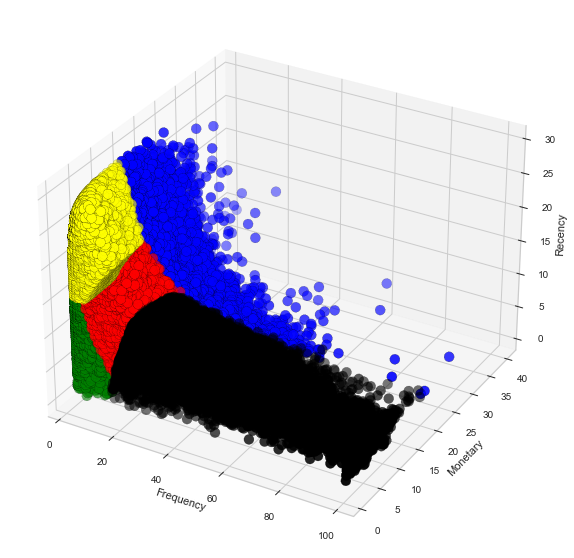

In [ ]:
# k = 5
plot_3d(5)

### Heatmap

In [ ]:
# Define function to create heatmap to show relative importance among RFM metrics for each cluster

def relative_importance(df):
    '''
    Calculate relative importance of segment attributes and plot heatmap
    '''
    # Calculate average RFM values for each cluster
    cluster_avg = df.groupby(['Cluster']).mean() 

    sns.heatmap(data=cluster_avg, annot=True, fmt='.2f', cmap="crest")
    
    return

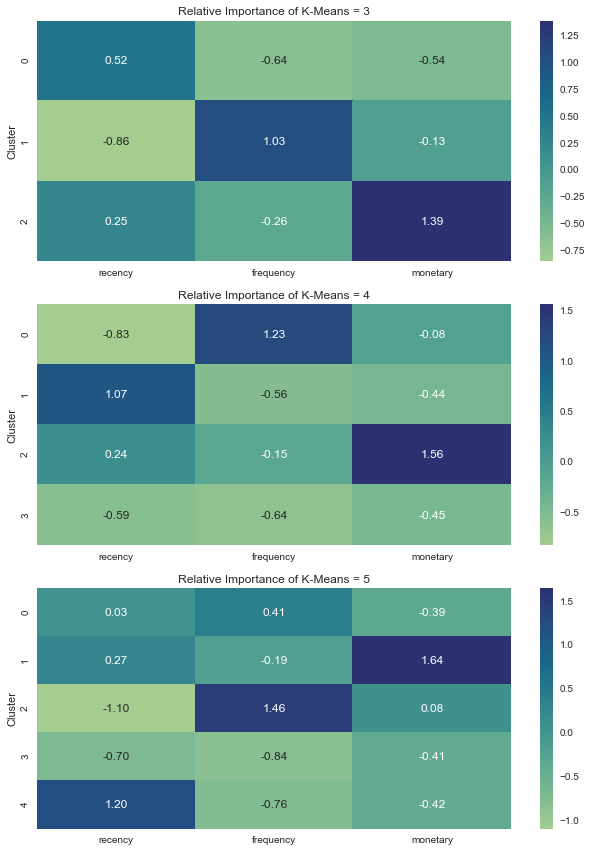

In [ ]:
# Plot the resulting cluster
plt.figure(figsize=(9, 12))

plt.subplot(3, 1, 1)
plt.title('Relative Importance of K-Means = 3')
relative_importance(k3)

plt.subplot(3, 1, 2)
plt.title('Relative Importance of K-Means = 4')
relative_importance(k4)

plt.subplot(3, 1, 3)
plt.title('Relative Importance of K-Means = 5')
relative_importance(k5)

plt.tight_layout()

### Final Cluster

The selected number of cluster is 4. 

In [ ]:
# Pass the resulting cluster to all user_id
kmeans = KMeans(n_clusters = 4, random_state=99).fit(data)
cluster = kmeans.labels_
df_profile["cluster_profile"] = cluster
df_profile["cluster_profile"] = df_profile["cluster_profile"] + 1
df_profile

,user_id,recency,frequency,monetary,RecencyScore,FrequencyScore,MonetaryScore,cluster_profile
0,1,19.135593,10,3.627119,2,3,2,1
1,2,15.369231,14,8.553846,3,4,4,2
2,3,10.977273,12,4.443182,4,3,2,4
3,4,13.500000,5,2.777778,3,2,1,4
4,5,12.270270,4,5.513514,3,1,3,4
...,...,...,...,...,...,...,...,...
206204,206205,13.406250,3,6.781250,3,1,4,4
206205,206206,4.084211,67,3.835088,5,5,2,3
206206,206207,14.031390,16,8.695067,3,4,4,2
206207,206208,7.434269,49,8.516987,5,5,4,3


In [ ]:
# Calculate the percentage of each cluster
np.round(df_profile["cluster_profile"].value_counts(normalize = True).sort_index()*100,2)

1    30.90
2    17.05
3    28.24
4    23.82
Name: cluster_profile, dtype: float64

The resulting Clusters:
* Cluster 0: High Recency, High Frequency, Medium Monetary (**Loyal Customer**) 30.90%
* Cluster 1: Low Recency, Low Frequency, Low Monetary (**Hibernating**) 17.05%
* Cluster 2: Medium Recency, Medium Frequency, High Monetary (**Big Spender**) 28.24%
* Cluster 3: High Recency, Low Frequency, Low Monetary (**Promising**) 23.82%

## Based on Customer Buying Pattern

Because the dataset contain too many products (49677) and too little category (21), we used aisle (134) in the analysis for customer buying pattern.

In [ ]:
# Create transaction data for each user based on aisle
df_buying = pd.crosstab(df_final['user_id'], df_final['aisle'])
df_buying.columns = [str(j) for j in df_buying.columns.get_level_values(0)]
df_buying

,air fresheners candles,asian foods,baby accessories,baby bath body care,baby food formula,bakery desserts,baking ingredients,baking supplies decor,beauty,beers coolers,...,spreads,tea,tofu meat alternatives,tortillas flat bread,trail mix snack mix,trash bags liners,vitamins supplements,water seltzer sparkling water,white wines,yogurt
user_id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
2,0,3,0,0,0,0,2,0,0,0,...,3,1,1,0,0,0,0,2,0,42
3,0,0,0,0,0,0,0,0,0,0,...,4,1,0,0,0,0,0,2,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
5,0,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206205,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
206206,0,4,0,0,0,0,4,1,0,0,...,1,0,0,0,0,1,0,1,0,0
206207,0,0,0,0,1,0,0,0,0,0,...,3,4,0,2,1,0,0,11,0,15


### T-SNE

In [ ]:
# Using T-SNE as dimensionality reduction technique, to reduce 134 feature to 2 dimension
%%time
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(df_buying)

Wall time: 25min 2s


<AxesSubplot:>

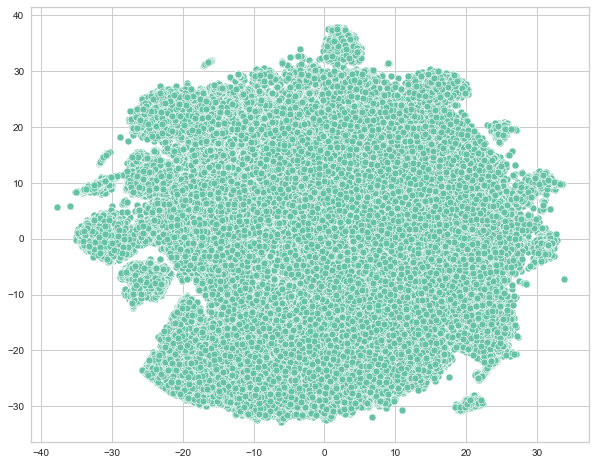

In [ ]:
# Original data that want to be clustered
plt.figure(figsize = (10,8))
sns.scatterplot(tsne_data[:,0], tsne_data[:,1])

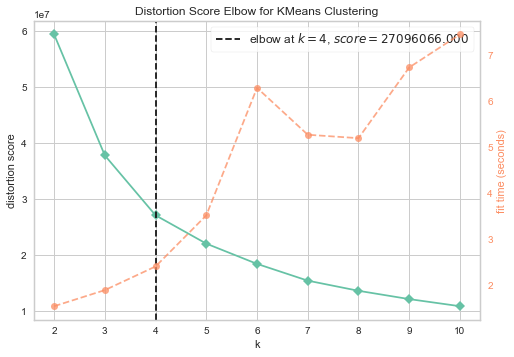

Wall time: 40.7 s


<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Hyperparameter tuning for k value using Distortion (sum of square errors) Score
%%time
kmeans = KMeans(random_state=1)
visualizer = KElbowVisualizer(kmeans, k = (2,11))
visualizer.fit(tsne_data[:,[0,1]])
visualizer.poof();

In [ ]:
# Define function to plot the resulting cluster
def kmeans_t(n):
  kmeans_tsne = KMeans(n_clusters = n, random_state = 1)
  kmeans_tsne.fit(tsne_data[:,[0,1]])

  clusters_tsne = kmeans_tsne.predict(tsne_data[:,[0,1]])

  plt.figure(figsize = (10,8))
  sns.scatterplot(x = tsne_data[:,0],
                y = tsne_data[:,1], alpha = 0.8, hue = clusters_tsne, palette = 'Dark2')

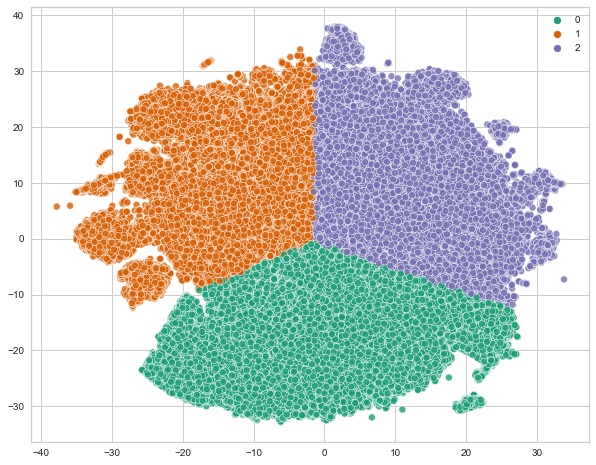

In [ ]:
kmeans_t(3)

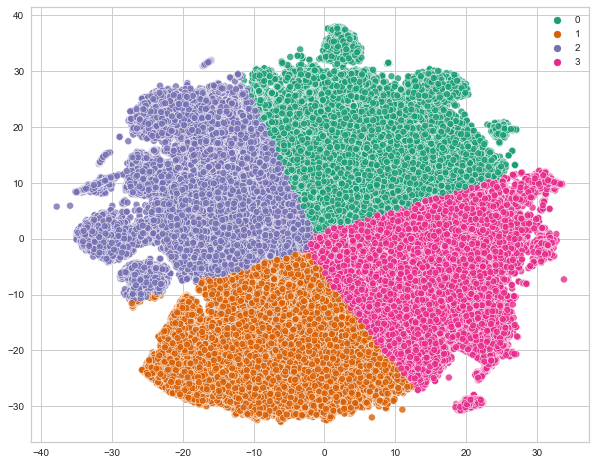

In [ ]:
kmeans_t(4)

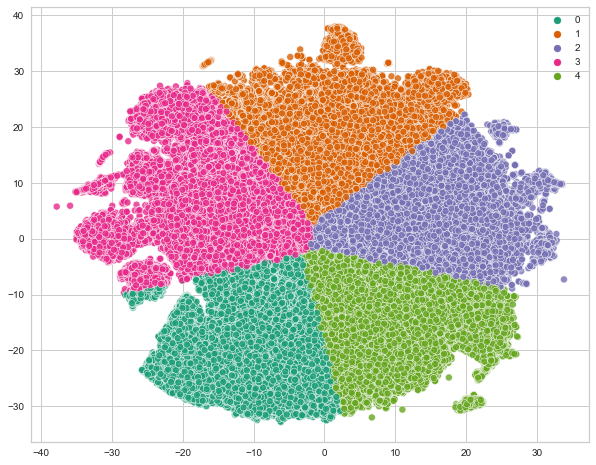

In [ ]:
kmeans_t(5)

It seems the k = 4, is the best to represent the customer cluster

In [ ]:
  # Pass the resulting cluster to each user id
  kmeans_tsne = KMeans(n_clusters = 4, random_state = 1)
  kmeans_tsne.fit(tsne_data[:,[0,1]])

  clusters_tsne = kmeans_tsne.predict(tsne_data[:,[0,1]])

  df_buying['Cluster_tsne'] = clusters_tsne

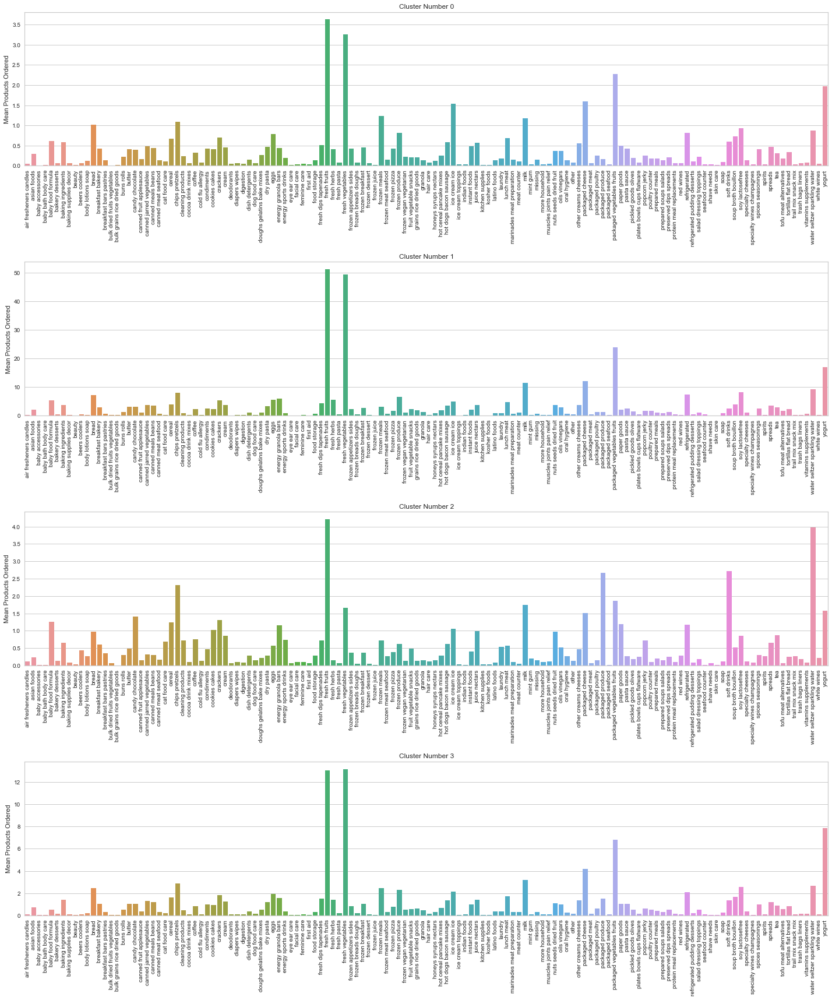

In [ ]:
# Compare the transactions data for each cluster

fig, ax = plt.subplots(4,1, figsize = (20,24))

cluster_no = 0
for i in range(4):
    sns.barplot(x = df_buying[df_buying.Cluster_tsne == cluster_no].iloc[:,:-1].mean().index,
        y = df_buying[df_buying.Cluster_tsne == cluster_no].iloc[:,:-1].mean(), ax = ax[i])
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, horizontalalignment='center')
    ax[i].set_ylabel('Mean Products Ordered')
    ax[i].set_title('Cluster Number {}'.format(i))
    cluster_no = cluster_no + 1
    plt.tight_layout()

In [ ]:
# Create new df for each cluster
clus0_tsne = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_tsne == 0].index.tolist()]
clus1_tsne = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_tsne == 1].index.tolist()]
clus2_tsne = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_tsne == 2].index.tolist()]
clus3_tsne = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_tsne == 3].index.tolist()]

In [ ]:
# Cluster 0
round(clus0_tsne.aisle.value_counts()[:20]/len(np.unique(clus0_tsne.index.values)),2)

fresh fruits                     3.63
fresh vegetables                 3.25
packaged vegetables fruits       2.27
yogurt                           1.97
packaged cheese                  1.60
ice cream ice                    1.54
frozen meals                     1.24
milk                             1.17
chips pretzels                   1.08
bread                            1.01
soy lactosefree                  0.94
water seltzer sparkling water    0.87
frozen produce                   0.82
refrigerated                     0.81
eggs                             0.79
soup broth bouillon              0.73
crackers                         0.70
lunch meat                       0.69
cereal                           0.67
baby food formula                0.61
Name: aisle, dtype: float64

In [ ]:
# Cluster 1
round(clus1_tsne.aisle.value_counts()[:20]/len(np.unique(clus1_tsne.index.values)),2)

fresh fruits                     51.20
fresh vegetables                 49.40
packaged vegetables fruits       23.91
yogurt                           16.99
packaged cheese                  11.98
milk                             11.53
water seltzer sparkling water     9.26
soy lactosefree                   8.20
chips pretzels                    8.00
refrigerated                      7.31
bread                             7.07
frozen produce                    6.52
energy granola bars               5.91
eggs                              5.57
fresh herbs                       5.50
baby food formula                 5.30
crackers                          5.25
ice cream ice                     5.01
lunch meat                        4.81
fresh dips tapenades              4.28
Name: aisle, dtype: float64

In [ ]:
# Cluster 2
round(clus2_tsne.aisle.value_counts()[:20]/len(np.unique(clus2_tsne.index.values)),2)

fresh fruits                     4.21
water seltzer sparkling water    3.98
soft drinks                      2.71
packaged produce                 2.67
chips pretzels                   2.31
packaged vegetables fruits       1.86
milk                             1.74
fresh vegetables                 1.66
yogurt                           1.58
packaged cheese                  1.51
candy chocolate                  1.40
crackers                         1.31
baby food formula                1.26
cereal                           1.23
paper goods                      1.19
refrigerated                     1.17
energy granola bars              1.15
ice cream ice                    1.06
cookies cakes                    1.03
juice nectars                    0.99
Name: aisle, dtype: float64

In [ ]:
# Cluster 3
round(clus3_tsne.aisle.value_counts()[:20]/len(np.unique(clus3_tsne.index.values)),2)

fresh vegetables                 13.19
fresh fruits                     13.05
yogurt                            7.84
packaged vegetables fruits        6.80
packaged cheese                   4.18
milk                              3.19
chips pretzels                    2.88
water seltzer sparkling water     2.67
soy lactosefree                   2.58
bread                             2.45
frozen meals                      2.43
frozen produce                    2.31
ice cream ice                     2.15
refrigerated                      2.10
eggs                              1.95
crackers                          1.80
lunch meat                        1.69
soup broth bouillon               1.65
cereal                            1.61
energy granola bars               1.56
Name: aisle, dtype: float64

In [ ]:
# List common aisle in the top 20 for each cluster
common_index_tsne = (clus0_tsne.aisle.value_counts()[:20].index) & \
(clus1_tsne.aisle.value_counts()[:20].index) & \
(clus2_tsne.aisle.value_counts()[:20].index) & \
(clus3_tsne.aisle.value_counts()[:20].index)

In [ ]:
# List a total aisle in the top 20 from all cluster
all_index_tsne = ((clus0_tsne.aisle.value_counts()[:20].index) | \
(clus1_tsne.aisle.value_counts()[:20].index) | \
(clus2_tsne.aisle.value_counts()[:20].index) | \
(clus3_tsne.aisle.value_counts()[:20].index))

In [ ]:
# List different aisle in the top 20 for each cluster
different_index_tsne = [x for x in all_index_tsne if x not in common_index_tsne]

In [ ]:
# Check the proportion of common aisle for each cluster
tsne_df = pd.DataFrame(columns = common_index_tsne, index = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3'])

tsne_df.loc['Cluster 0'] = clus0_tsne.aisle.value_counts()[common_index_tsne].values
tsne_df.loc['Cluster 1'] = clus1_tsne.aisle.value_counts()[common_index_tsne].values
tsne_df.loc['Cluster 2'] = clus2_tsne.aisle.value_counts()[common_index_tsne].values
tsne_df.loc['Cluster 3'] = clus3_tsne.aisle.value_counts()[common_index_tsne].values
tsne_df['Total'] = tsne_df.sum(axis = 1)

for column in tsne_df.columns:
    column_temp = tsne_df[column]/(tsne_df[column].sum())*100
    tsne_df[column] = round(column_temp.astype('float64'),2)
print(tsne_df.shape)
tsne_df

(4, 12)


,fresh fruits,fresh vegetables,packaged vegetables fruits,yogurt,packaged cheese,ice cream ice,milk,chips pretzels,water seltzer sparkling water,refrigerated,crackers,Total
Cluster 0,5.36,5.11,6.92,7.31,8.76,16.56,7.08,8.06,5.56,7.59,8.23,6.67
Cluster 1,69.31,71.25,66.77,57.67,60.28,49.51,63.79,54.62,54.24,62.59,56.43,64.62
Cluster 2,5.55,2.33,5.04,5.21,7.39,10.16,9.37,15.35,22.68,9.71,13.65,7.04
Cluster 3,19.78,21.30,21.27,29.81,23.57,23.77,19.75,21.98,17.52,20.12,21.68,21.67


In [ ]:
# Check the proportion of different aisle for each cluster
tsne1_df = pd.DataFrame(columns = different_index_tsne, index = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3'])

tsne1_df.loc['Cluster 0'] = clus0_tsne.aisle.value_counts()[different_index_tsne].values
tsne1_df.loc['Cluster 1'] = clus1_tsne.aisle.value_counts()[different_index_tsne].values
tsne1_df.loc['Cluster 2'] = clus2_tsne.aisle.value_counts()[different_index_tsne].values
tsne1_df.loc['Cluster 3'] = clus3_tsne.aisle.value_counts()[different_index_tsne].values
tsne1_df['Total'] = tsne1_df.sum(axis = 1)

for column in tsne1_df.columns:
    column_temp = tsne1_df[column]/(tsne1_df[column].sum())*100
    tsne1_df[column] = round(column_temp.astype('float64'),2)
print(tsne1_df.shape)
tsne1_df

(4, 19)


,baby food formula,bread,candy chocolate,cereal,cookies cakes,eggs,energy granola bars,fresh dips tapenades,fresh herbs,frozen meals,frozen produce,juice nectars,lunch meat,packaged produce,paper goods,soft drinks,soup broth bouillon,soy lactosefree,Total
Cluster 0,8.52,9.30,7.00,9.54,9.49,9.35,5.20,7.66,5.78,17.09,8.44,9.09,9.41,3.30,11.03,9.10,11.29,7.88,8.79
Cluster 1,68.30,59.62,51.54,51.28,47.89,60.76,63.79,59.26,71.72,39.73,61.52,53.78,60.01,20.76,41.90,33.97,55.26,63.35,55.34
Cluster 2,15.85,7.93,22.39,15.68,21.11,6.12,12.08,9.79,1.84,8.88,5.65,14.16,6.96,46.32,23.53,36.38,7.08,6.48,13.20
Cluster 3,7.33,23.14,19.07,23.49,21.51,23.77,18.93,23.30,20.66,34.31,24.39,22.97,23.62,29.62,23.54,20.55,26.36,22.29,22.66


<Figure size 720x576 with 0 Axes>

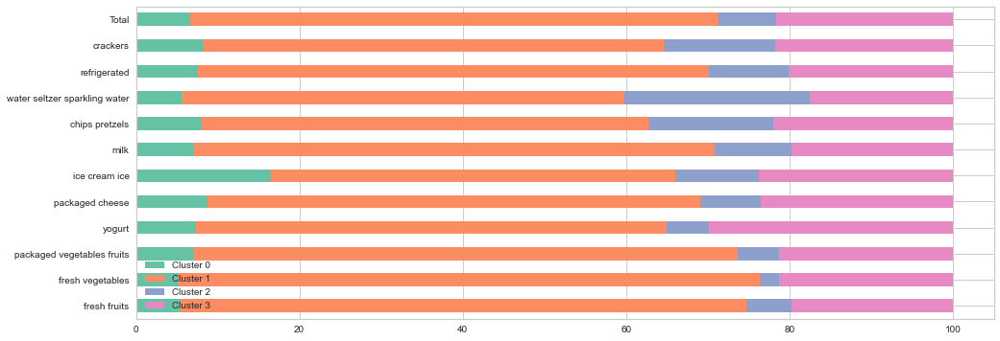

In [ ]:
# Plot the common aisle proportion for all cluster
plt.figure(figsize = (10,8))
tsne_df.T.plot(kind='barh', stacked=True,figsize = (16,6))
plt.legend(loc = 3, fontsize = 'small')

In [ ]:
# Calculate the percentage of each cluster
np.round(df_buying['Cluster_tsne'].value_counts(normalize = True).sort_index()*100,2)

0    26.07
1    23.91
2    23.25
3    26.77
Name: Cluster_tsne, dtype: float64

* **Cluster 0**: families that eat more refrigerated goods to save time; families who are quite busy, maybe the majority of family member is working. The number of unique products purchased by this cluster is quite large, which is indicated by the factor value.
* **Cluster 1**: dominated by young people or those are single, indicated by the top products, which are soft drinks, chips, ice cream, and chocolate. The number of unique products is quite varied, indicated by small factor values.
* **Cluster 2**: The main difference is packaged produce and frozen meals product. The most dominant cluster with the most product variations. This is the main target customer, because the value proposition of the Instacart is to provide easy grocery shopping services for those who are busy and don't have much time.
* **Cluster 3**: different from other Cluster, the top product is vegetables. This indicates that this cluster is filled by families who have children or babies. Normally, fruits are the top product, because vegetables are mostly used for cooking, dominated by married people. Meanwhile for fruit, cooking or not, the people usually buy it. The differentiating item here is baby food formula and other items that are usually purchased by families with children.

### PCA

In [ ]:
# Using PCA as dimensionality reduction technique, to reduce 134 features to 2 dimensions
pca = PCA(n_components = 10)
pca_data = pca.fit_transform(df_buying)

In [ ]:
print('Explained variance:', pca.explained_variance_)
print('Explained variance ratio:', pca.explained_variance_ratio_)

Explained variance: [1963.90655148  390.26726369  211.13469835  146.16622678  119.47955376
   97.42965322   77.33377138   74.58968664   60.5732492    54.73999883]
Explained variance ratio: [0.4822261  0.09582791 0.05184293 0.03589029 0.02933753 0.0239233
 0.01898887 0.01831507 0.01487342 0.0134411 ]


In [ ]:
exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

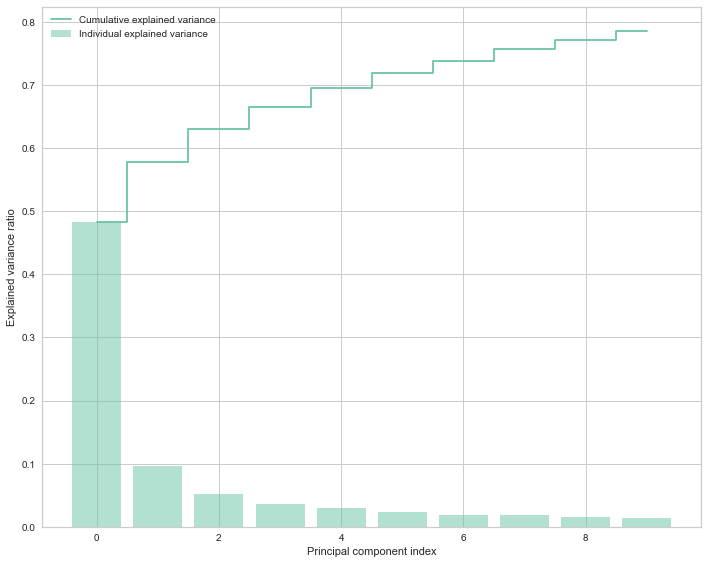

In [ ]:
# Plot the explained variance ratio
plt.figure(figsize = (10,8))
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

By using 2 principal components, we still have data variance for around 58%.

In [ ]:
pca = PCA(n_components = 6)
pca_data = pca.fit_transform(df_buying)

Text(0.5, 1.0, 'Pair Plot | PCA Components')

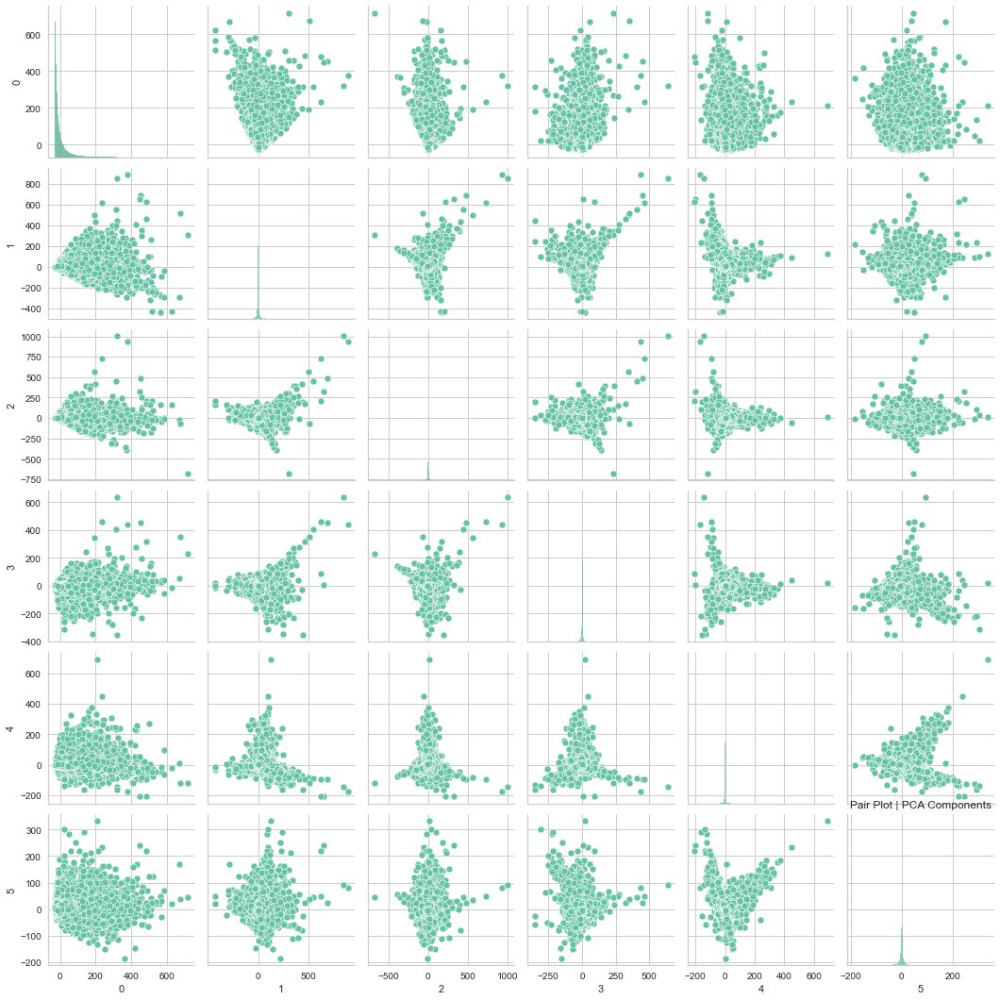

In [ ]:
sns.pairplot(pd.DataFrame(pca_data))
plt.title('Pair Plot | PCA Components')

<AxesSubplot:>

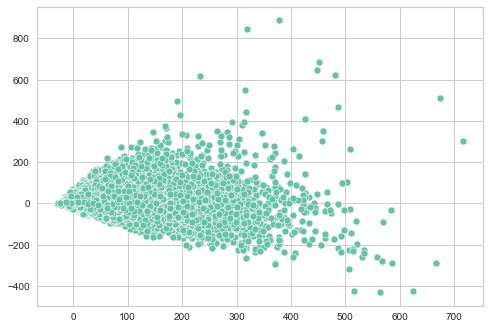

In [ ]:
# Original data that want to be clustered
sns.scatterplot(pca_data[:,0], pca_data[:,1])

In [ ]:
pca = PCA(n_components = 2)
pca_data = pca.fit_transform(df_buying)

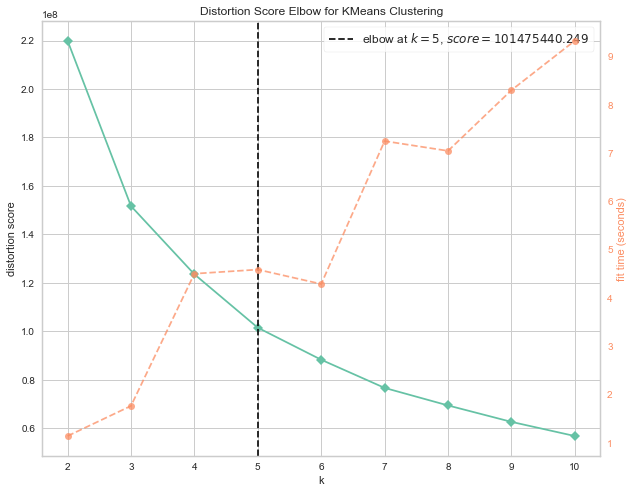

Wall time: 48.7 s


<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
# Hyperparameter tuning for k value using Distortion (sum of square errors) Score
%%time
plt.figure(figsize = (10,8))
kmeans = KMeans(random_state=1)
visualizer = KElbowVisualizer(kmeans, k = (2,11))
visualizer.fit(pca_data)
visualizer.poof();

In [ ]:
# The chosen value is k = 5
kmeans_pca = KMeans(n_clusters = 5, random_state = 10)

kmeans_pca.fit(pca_data)

clusters_pca = kmeans_pca.predict(pca_data)

df_buying['Cluster_PCA'] = clusters_pca

<AxesSubplot:>

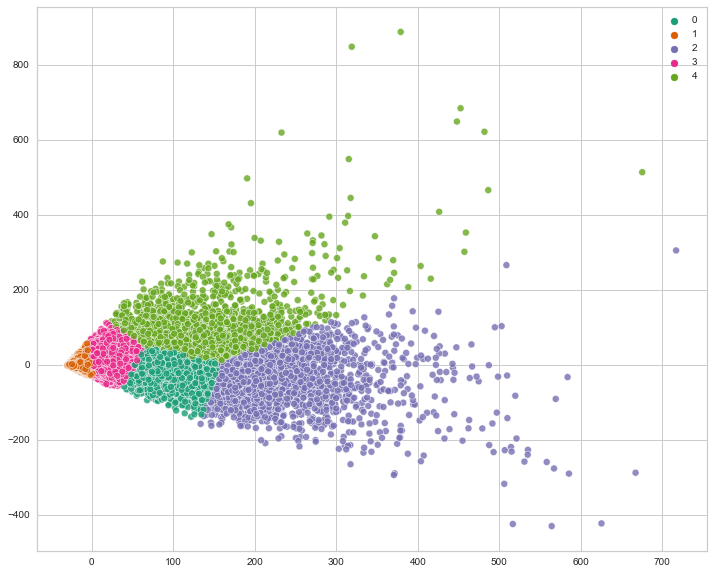

In [ ]:
# Plot the resulting cluster
plt.figure(figsize = (12,10))
sns.scatterplot(x = pca_data[:,0],
               y = pca_data[:,1], alpha = 0.8, hue = clusters_pca,
                palette = sns.color_palette("Dark2", 5))

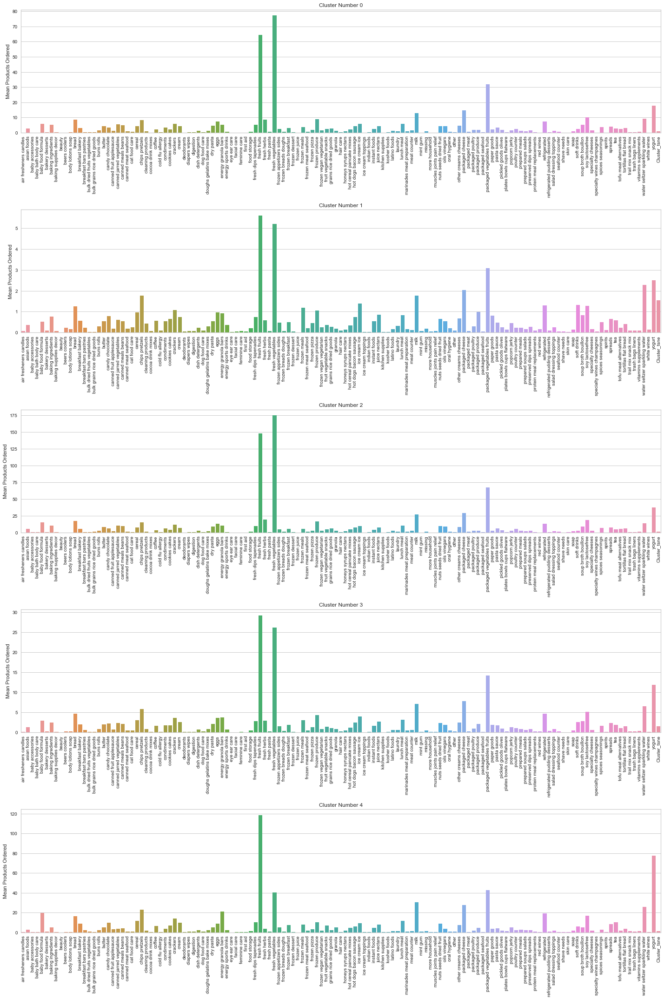

In [ ]:
# Compare the transactions data for each cluster
fig, ax = plt.subplots(5,1, figsize = (20,30))

cluster_no = 0
for i in range(5):
    sns.barplot(x = df_buying[df_buying.Cluster_PCA == cluster_no].iloc[:,:-1].mean().index,
        y = df_buying[df_buying.Cluster_PCA == cluster_no].iloc[:,:-1].mean(), ax = ax[i])
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=90, horizontalalignment='center')
    ax[i].set_ylabel('Mean Products Ordered')
    ax[i].set_title('Cluster Number {}'.format(i))
    plt.tight_layout()
    cluster_no = cluster_no + 1

In [ ]:
clus0_pca = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_PCA == 0].index.tolist()]
clus1_pca = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_PCA == 1].index.tolist()]
clus2_pca = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_PCA == 2].index.tolist()]
clus3_pca = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_PCA == 3].index.tolist()]
clus4_pca = df_final.set_index('user_id').loc[df_buying[df_buying.Cluster_PCA == 4].index.tolist()]

In [ ]:
round(clus0_pca.aisle.value_counts()[:20]/len(np.unique(clus0_pca.index.values)),2)

fresh vegetables                 77.17
fresh fruits                     64.28
packaged vegetables fruits       31.99
yogurt                           17.82
packaged cheese                  14.86
milk                             12.87
soy lactosefree                  10.23
water seltzer sparkling water     9.07
frozen produce                    8.76
fresh herbs                       8.73
bread                             8.71
chips pretzels                    8.36
eggs                              7.51
refrigerated                      7.45
ice cream ice                     5.98
baby food formula                 5.97
lunch meat                        5.82
crackers                          5.79
canned jarred vegetables          5.58
soup broth bouillon               5.35
Name: aisle, dtype: float64

In [ ]:
round(clus1_pca.aisle.value_counts()[:20]/len(np.unique(clus1_pca.index.values)),2)

fresh fruits                     5.60
fresh vegetables                 5.18
packaged vegetables fruits       3.07
yogurt                           2.50
water seltzer sparkling water    2.27
packaged cheese                  2.02
milk                             1.78
chips pretzels                   1.77
ice cream ice                    1.38
soft drinks                      1.32
refrigerated                     1.30
soy lactosefree                  1.28
bread                            1.25
frozen meals                     1.20
crackers                         1.07
frozen produce                   1.07
packaged produce                 0.98
eggs                             0.97
cereal                           0.97
energy granola bars              0.92
Name: aisle, dtype: float64

In [ ]:
round(clus2_pca.aisle.value_counts()[:20]/len(np.unique(clus2_pca.index.values)),2)

fresh vegetables                 175.06
fresh fruits                     148.02
packaged vegetables fruits        67.20
yogurt                            37.63
packaged cheese                   29.14
milk                              27.08
fresh herbs                       19.09
soy lactosefree                   18.91
bread                             17.13
frozen produce                    16.75
baby food formula                 14.88
chips pretzels                    14.86
water seltzer sparkling water     13.56
refrigerated                      12.94
eggs                              12.92
crackers                          11.61
canned jarred vegetables          10.50
lunch meat                        10.49
baking ingredients                10.20
energy granola bars               10.04
Name: aisle, dtype: float64

In [ ]:
round(clus3_pca.aisle.value_counts()[:20]/len(np.unique(clus3_pca.index.values)),2)

fresh fruits                     29.26
fresh vegetables                 26.23
packaged vegetables fruits       14.23
yogurt                           11.93
packaged cheese                   7.86
milk                              7.08
water seltzer sparkling water     6.59
chips pretzels                    5.83
soy lactosefree                   5.20
refrigerated                      4.68
bread                             4.65
frozen produce                    4.29
ice cream ice                     4.00
energy granola bars               3.77
eggs                              3.69
crackers                          3.66
lunch meat                        3.20
frozen meals                      3.11
cereal                            3.01
baby food formula                 2.97
Name: aisle, dtype: float64

In [ ]:
round(clus4_pca.aisle.value_counts()[:20]/len(np.unique(clus4_pca.index.values)),2)

fresh fruits                     118.43
yogurt                            77.56
packaged vegetables fruits        42.78
fresh vegetables                  40.23
milk                              30.29
packaged cheese                   27.70
water seltzer sparkling water     25.78
chips pretzels                    22.68
energy granola bars               21.22
baby food formula                 19.62
refrigerated                      18.96
soy lactosefree                   16.82
bread                             16.08
crackers                          13.86
cereal                            11.79
lunch meat                        11.58
fresh dips tapenades              10.41
frozen produce                    10.29
tea                               10.15
candy chocolate                    9.87
Name: aisle, dtype: float64

In [ ]:
common_index_pca = (clus0_pca.aisle.value_counts()[:20].index) & \
(clus1_pca.aisle.value_counts()[:20].index) & \
(clus2_pca.aisle.value_counts()[:20].index) & \
(clus3_pca.aisle.value_counts()[:20].index) & \
(clus4_pca.aisle.value_counts()[:20].index)

In [ ]:
all_index_pca = ((clus0_pca.aisle.value_counts()[:20].index) | \
(clus1_pca.aisle.value_counts()[:20].index) | \
(clus2_pca.aisle.value_counts()[:20].index) | \
(clus3_pca.aisle.value_counts()[:20].index) | \
(clus4_pca.aisle.value_counts()[:20].index))

In [ ]:
different_index_pca = [x for x in all_index_pca if x not in common_index_pca]

In [ ]:
pca_df = pd.DataFrame(columns = common_index_pca, index = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3'])

pca_df.loc['Cluster 0'] = clus0_pca.aisle.value_counts()[common_index_pca].values
pca_df.loc['Cluster 1'] = clus1_pca.aisle.value_counts()[common_index_pca].values
pca_df.loc['Cluster 2'] = clus2_pca.aisle.value_counts()[common_index_pca].values
pca_df.loc['Cluster 3'] = clus3_pca.aisle.value_counts()[common_index_pca].values
pca_df.loc['Cluster 4'] = clus4_pca.aisle.value_counts()[common_index_pca].values
pca_df['Total'] = pca_df.sum(axis = 1)

for column in pca_df.columns:
    column_temp = pca_df[column]/(pca_df[column].sum())*100
    pca_df[column] = round(column_temp.astype('float64'),2)
print(pca_df.shape)
pca_df

(5, 14)


,fresh vegetables,fresh fruits,packaged vegetables fruits,yogurt,packaged cheese,milk,soy lactosefree,water seltzer sparkling water,frozen produce,bread,chips pretzels,refrigerated,crackers,Total
Cluster 0,27.52,21.51,22.08,14.95,18.48,17.60,19.54,13.13,20.43,18.15,14.10,15.77,15.38,20.50
Cluster 1,22.31,22.62,25.61,25.36,30.38,29.33,29.52,39.67,30.02,31.43,36.13,33.18,34.30,26.91
Cluster 2,14.98,11.88,11.13,7.58,8.70,8.89,8.67,4.71,9.37,8.56,6.01,6.57,7.40,10.46
Cluster 3,31.03,32.49,32.60,33.22,32.43,32.16,32.95,31.65,33.22,32.13,32.64,32.83,32.24,32.24
Cluster 4,4.16,11.50,8.57,18.89,10.00,12.03,9.32,10.84,6.97,9.72,11.10,11.64,10.68,9.90


In [ ]:
pca1_df = pd.DataFrame(columns = different_index_pca, index = ['Cluster 0','Cluster 1','Cluster 2','Cluster 3'])

pca1_df.loc['Cluster 0'] = clus0_pca.aisle.value_counts()[different_index_pca].values
pca1_df.loc['Cluster 1'] = clus1_pca.aisle.value_counts()[different_index_pca].values
pca1_df.loc['Cluster 2'] = clus2_pca.aisle.value_counts()[different_index_pca].values
pca1_df.loc['Cluster 3'] = clus3_pca.aisle.value_counts()[different_index_pca].values
pca1_df.loc['Cluster 4'] = clus4_pca.aisle.value_counts()[different_index_pca].values
pca1_df['Total'] = pca1_df.sum(axis = 1)

for column in pca1_df.columns:
    column_temp = pca1_df[column]/(pca1_df[column].sum())*100
    pca1_df[column] = round(column_temp.astype('float64'),2)
print(pca1_df.shape)
pca1_df

(5, 17)


,baby food formula,baking ingredients,candy chocolate,canned jarred vegetables,cereal,eggs,energy granola bars,fresh dips tapenades,fresh herbs,frozen meals,ice cream ice,lunch meat,packaged produce,soft drinks,soup broth bouillon,tea,Total
Cluster 0,19.01,19.67,13.46,22.91,13.48,20.25,14.17,17.88,28.18,11.40,14.62,17.95,8.14,8.05,18.82,13.23,16.45
Cluster 1,20.02,34.68,38.69,30.20,37.64,31.45,29.58,31.22,22.60,45.16,40.82,31.22,52.40,54.52,35.61,35.36,35.38
Cluster 2,11.37,9.13,5.89,10.34,5.62,8.35,6.43,7.88,14.78,4.08,5.46,7.76,2.67,2.29,7.80,5.63,7.27
Cluster 3,31.46,30.83,30.35,32.19,32.21,33.02,33.37,32.67,30.93,32.20,32.43,32.71,31.19,29.24,32.44,31.39,31.89
Cluster 4,18.14,5.69,11.61,4.35,11.04,6.93,16.45,10.35,3.51,7.17,6.67,10.37,5.60,5.90,5.32,14.39,9.02


<Figure size 720x576 with 0 Axes>

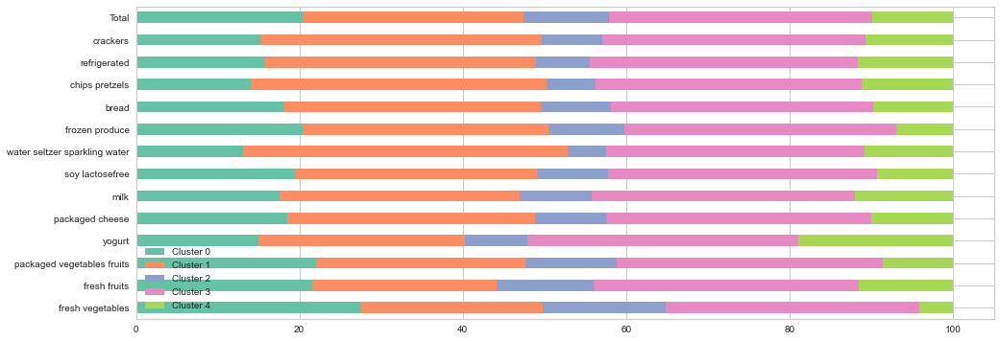

In [ ]:
plt.figure(figsize = (10,8))
pca_df.T.plot(kind='barh', stacked=True,figsize = (16,6))
plt.legend(loc = 3, fontsize = 'small')

In [ ]:
np.round(df_buying['Cluster_PCA'].value_counts(normalize = True).sort_index()*100,2)

0     5.91
1    71.34
2     1.42
3    19.61
4     1.72
Name: Cluster_PCA, dtype: float64

As a general observation, t-SNE clusters are more uniform as they end up capturing most of the variance of the data. PCA fails to do that, but instead provides us with some very specialised clusters. Also, the resulting cluster from T-SNE is distributed proportionally, but the resulting cluster form PCA doesn't.
We will use the resulting cluster from T-SNE, because it is better represented the customer buying pattern.

# Association Rule

In [ ]:
df_final.head()

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
0,2,1819,8,1,202279,3,5,9,8,All Natural No Stir Creamy Almond Butter,88,13,spreads,pantry
1,2,9327,3,0,202279,3,5,9,8,Garlic Powder,104,13,spices seasonings,pantry
2,2,17794,6,1,202279,3,5,9,8,Carrots,83,4,fresh vegetables,produce
3,2,28985,2,1,202279,3,5,9,8,Michigan Organic Kale,83,4,fresh vegetables,produce
4,2,30035,5,0,202279,3,5,9,8,Natural Sweetener,17,13,baking ingredients,pantry


## Apriori

### Transaction Dataset

Create the transaction data with format that ready to use in apriori & fpgrowth algorithm

In [ ]:
temp = pd.DataFrame(columns=['Cluster'])
temp["Cluster"] = df_buying['Cluster_tsne']
temp.reset_index()

,user_id,Cluster
0,1,2
1,2,3
2,3,3
3,4,0
4,5,0
...,...,...
206204,206205,0
206205,206206,0
206206,206207,1
206207,206208,1


In [ ]:
feature = ['user_id','order_id','product_id','product_name']
temp1 = pd.DataFrame(columns=feature)

for col in feature:
  temp1[col] = df_final[col]

In [ ]:
df_apriori = pd.merge(temp1,temp, on=['user_id'])
df_apriori = df_apriori[df_apriori['order_id']<100000] #to reduce memory consumption

In [ ]:
# Export clustered data to csv, so we don't need to repeat the above process

#%%time
#df_apriori.to_csv("association_rule.csv",index=False)

In [ ]:
df_apriori = pd.read_csv("association_rule.csv")
df_apriori.head()

,user_id,order_id,product_id,product_name,Cluster
0,202279,2,1819,All Natural No Stir Creamy Almond Butter,0
1,202279,2,9327,Garlic Powder,0
2,202279,2,17794,Carrots,0
3,202279,2,28985,Michigan Organic Kale,0
4,202279,2,30035,Natural Sweetener,0


In [ ]:
# Split and create new df for each cluster
df_cluster0 = df_apriori[df_apriori["Cluster"]==0]
df_cluster1 = df_apriori[df_apriori["Cluster"]==1]
df_cluster2 = df_apriori[df_apriori["Cluster"]==2]
df_cluster3 = df_apriori[df_apriori["Cluster"]==3]

In [ ]:
df_item0 = df_cluster0[['order_id','product_id']]
df_item1 = df_cluster1[['order_id','product_id']]
df_item2 = df_cluster2[['order_id','product_id']]
df_item3 = df_cluster3[['order_id','product_id']]

In [ ]:
# Define function to encode the transaction data to apriori specified format
def transaction(df):
    df.product_id = df.product_id.transform(lambda x: [x])
    basket = df.groupby(['order_id']).sum()['product_id'].reset_index(drop=True)

    encoder = TransactionEncoder()
    transactions = pd.DataFrame(encoder.fit(basket).transform(basket), columns=encoder.columns_)
    
    return transactions

In [ ]:
trans_data0 = transaction(df_item0)
trans_data1 = transaction(df_item1)
trans_data2 = transaction(df_item2)
trans_data3 = transaction(df_item3)

In [ ]:
trans_data0

,1,3,4,8,10,12,23,25,27,28,...,49667,49668,49670,49675,49676,49678,49680,49681,49683,49685
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16585,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
16586,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
16587,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
16588,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


### Frequent Itemset & Rules

In [ ]:
# Define function to generate the association rules
def rules(transaction):
    frequentItems = apriori(transaction, min_support= 0.002, use_colnames=True, max_len = 2)
    rules = association_rules(frequentItems, metric="lift",  min_threshold = 1.5)
    display(rules.head())
    print("Identified Rules: ", len(rules))
    return rules

In [ ]:
# Cluster 0
%%time
rules0 = rules(trans_data0)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(3020),(34134),0.006329,0.008559,0.002291,0.361905,42.281690,0.002236,1.553750
1,(34134),(3020),0.008559,0.006329,0.002291,0.267606,42.281690,0.002236,1.356743
2,(24852),(4605),0.142375,0.022905,0.005847,0.041067,1.792894,0.002586,1.018939
3,(4605),(24852),0.022905,0.142375,0.005847,0.255263,1.792894,0.002586,1.151581
4,(47626),(4605),0.044063,0.022905,0.003496,0.079343,3.463964,0.002487,1.061302


Identified Rules:  442
Wall time: 1min 45s


In [ ]:
# Filter the rules with confidence & lift values above average
rules0 = rules0[(rules0['confidence'] > rules0['confidence'].mean()) & (rules0['lift'] > rules0['lift'].mean())] 

In [ ]:
rules0 = rules0.sort_values('lift',ascending=False, ignore_index=True)
rules0

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(49044),(5491),0.005546,0.006631,0.002110,0.380435,57.376482,0.002073,1.603333
1,(5491),(49044),0.006631,0.005546,0.002110,0.318182,57.376482,0.002073,1.458533
2,(3020),(34134),0.006329,0.008559,0.002291,0.361905,42.281690,0.002236,1.553750
3,(34134),(3020),0.008559,0.006329,0.002291,0.267606,42.281690,0.002236,1.356743
4,(43875),(14211),0.009102,0.006148,0.002110,0.231788,37.699649,0.002054,1.293721
5,(14211),(43875),0.006148,0.009102,0.002110,0.343137,37.699649,0.002054,1.508531
6,(8048),(30827),0.008800,0.008258,0.002471,0.280822,34.006099,0.002399,1.378994
7,(30827),(8048),0.008258,0.008800,0.002471,0.299270,34.006099,0.002399,1.414524
8,(43875),(34134),0.009102,0.008559,0.002471,0.271523,31.722321,0.002393,1.360978
9,(34134),(43875),0.008559,0.009102,0.002471,0.288732,31.722321,0.002393,1.393144


In [ ]:
rules0.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,0.013046,0.022336,0.002710,0.231935,16.000987,0.002408,1.284927
std,0.005829,0.013244,0.000792,0.073803,13.920944,0.000650,0.129945
min,0.005546,0.005546,0.002049,0.124277,4.089506,0.001697,1.110252
25%,0.008620,0.009976,0.002125,0.162393,6.163017,0.002003,1.169666
50%,0.010609,0.020856,0.002441,0.230600,10.245940,0.002236,1.269829
75%,0.015732,0.027728,0.003014,0.288492,16.420540,0.002591,1.376446
max,0.027728,0.048764,0.005485,0.380435,57.376482,0.004389,1.603333


In [ ]:
# Cluster 1
%%time
rules1 = rules(trans_data1)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(196),(37710),0.037606,0.005728,0.002573,0.068433,11.946956,0.002358,1.067311
1,(37710),(196),0.005728,0.037606,0.002573,0.449275,11.946956,0.002358,1.747505
2,(38928),(196),0.005064,0.037606,0.002158,0.426230,11.334129,0.001968,1.677316
3,(196),(38928),0.037606,0.005064,0.002158,0.057395,11.334129,0.001968,1.055518
4,(196),(46061),0.037606,0.004566,0.002158,0.057395,12.570580,0.001987,1.056046


Identified Rules:  140
Wall time: 24.5 s


In [ ]:
rules1 = rules1[(rules1['confidence'] > rules1['confidence'].mean()) & (rules1['lift'] > rules1['lift'].mean())] 

In [ ]:
rules1 = rules1.sort_values('lift',ascending=False, ignore_index=True)
rules1

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(36316),(47977),0.005977,0.009547,0.002490,0.416667,43.644928,0.002433,1.697920
1,(47977),(36316),0.009547,0.005977,0.002490,0.260870,43.644928,0.002433,1.344855
2,(21709),(20119),0.010294,0.006309,0.002656,0.258065,40.903226,0.002592,1.339322
3,(20119),(21709),0.006309,0.010294,0.002656,0.421053,40.903226,0.002592,1.709492
4,(46088),(41131),0.008800,0.008302,0.002324,0.264151,31.819623,0.002251,1.347693
5,(41131),(46088),0.008302,0.008800,0.002324,0.280000,31.819623,0.002251,1.376667
6,(20119),(35221),0.006309,0.012120,0.002075,0.328947,27.140411,0.001999,1.472135
7,(35221),(20119),0.012120,0.006309,0.002075,0.171233,27.140411,0.001999,1.198999
8,(21709),(35221),0.010294,0.012120,0.003155,0.306452,25.284357,0.003030,1.424385
9,(35221),(21709),0.012120,0.010294,0.003155,0.260274,25.284357,0.003030,1.337936


In [ ]:
rules1.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.009875,0.016797,0.002964,0.326422,24.022256,0.002814,1.492203
std,0.004101,0.010703,0.000947,0.101762,10.319440,0.000883,0.227081
min,0.004566,0.005977,0.002075,0.171233,11.334129,0.001911,1.190284
25%,0.006309,0.009360,0.002324,0.259722,17.137322,0.002251,1.338976
50%,0.009920,0.012120,0.002656,0.315131,23.341660,0.002592,1.441930
75%,0.012120,0.020339,0.003155,0.417763,28.310214,0.003030,1.682467
max,0.020339,0.037606,0.005728,0.530769,43.644928,0.005322,2.051004


In [ ]:
# Cluster 2
%%time
rules2 = rules(trans_data2)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(13176),(260),0.137109,0.008945,0.002567,0.018724,2.093186,0.001341,1.009966
1,(260),(13176),0.008945,0.137109,0.002567,0.286996,2.093186,0.001341,1.210218
2,(21137),(260),0.101929,0.008945,0.002567,0.025187,2.815628,0.001655,1.016661
3,(260),(21137),0.008945,0.101929,0.002567,0.286996,2.815628,0.001655,1.259558
4,(24852),(260),0.129688,0.008945,0.002286,0.017631,1.970921,0.001126,1.008841


Identified Rules:  1684
Wall time: 2min 14s


In [ ]:
rules2 = rules2[(rules2['confidence'] > rules2['confidence'].mean()) & (rules2['lift'] > rules2['lift'].mean())] 

In [ ]:
rules2 = rules2.sort_values('lift',ascending=False, ignore_index=True)
rules2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(36865),(8309),0.008063,0.004292,0.002246,0.278607,64.910215,0.002212,1.380257
1,(8309),(36865),0.004292,0.008063,0.002246,0.523364,64.910215,0.002212,2.081123
2,(13263),(28465),0.004132,0.009226,0.002447,0.592233,64.190333,0.002409,2.429755
3,(28465),(13263),0.009226,0.004132,0.002447,0.265217,64.190333,0.002409,1.355324
4,(28465),(8309),0.009226,0.004292,0.002407,0.260870,60.777733,0.002367,1.347134
...,...,...,...,...,...,...,...,...,...
152,(21938),(24964),0.016326,0.034578,0.002246,0.137592,3.979158,0.001682,1.119449
153,(43352),(39275),0.028361,0.036263,0.004092,0.144272,3.978480,0.003063,1.126218
154,(21938),(22935),0.016326,0.037266,0.002407,0.147420,3.955906,0.001798,1.129201
155,(47766),(26209),0.047054,0.040395,0.007461,0.158568,3.925458,0.005560,1.140443


In [ ]:
rules2.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000
mean,0.017530,0.026979,0.003629,0.242194,15.405706,0.003108,1.322513
std,0.009589,0.014790,0.001605,0.113235,16.495421,0.001332,0.265416
min,0.004132,0.004132,0.002006,0.133411,3.925458,0.001589,1.119449
25%,0.010751,0.012435,0.002407,0.152941,4.727167,0.002119,1.146012
50%,0.015324,0.027638,0.003249,0.201342,6.194909,0.002736,1.205295
75%,0.021822,0.036263,0.004092,0.286765,22.100177,0.003633,1.373589
max,0.047455,0.101929,0.009387,0.592233,64.910215,0.007268,2.429755


In [ ]:
# Cluster 3
%%time
rules3 = rules(trans_data3)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(432),(24852),0.011267,0.178768,0.003145,0.279121,1.561360,0.001131,1.139209
1,(24852),(432),0.178768,0.011267,0.003145,0.017592,1.561360,0.001131,1.006438
2,(24852),(1158),0.178768,0.006686,0.002105,0.011774,1.761027,0.000910,1.005149
3,(1158),(24852),0.006686,0.178768,0.002105,0.314815,1.761027,0.000910,1.198555
4,(13176),(1463),0.134664,0.009806,0.002402,0.017837,1.818968,0.001081,1.008177


Identified Rules:  1024
Wall time: 9min 26s


In [ ]:
rules3 = rules3[(rules3['confidence'] > rules3['confidence'].mean()) & (rules3['lift'] > rules3['lift'].mean())] 

In [ ]:
rules3 = rules3.sort_values('lift',ascending=False, ignore_index=True)
rules3

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(33787),(33754),0.005795,0.009113,0.002179,0.376068,41.267373,0.002126,1.588134
1,(33754),(33787),0.009113,0.005795,0.002179,0.239130,41.267373,0.002126,1.306670
2,(4957),(33754),0.006042,0.009113,0.002253,0.372951,40.925272,0.002198,1.580238
3,(33754),(4957),0.009113,0.006042,0.002253,0.247283,40.925272,0.002198,1.320493
4,(2295),(15290),0.010054,0.015031,0.002798,0.278325,18.516186,0.002647,1.364837
...,...,...,...,...,...,...,...,...,...
94,(44142),(47766),0.016542,0.069561,0.002897,0.175150,2.517941,0.001747,1.128010
95,(8174),(13176),0.015725,0.134664,0.005324,0.338583,2.514278,0.003207,1.308306
96,(4920),(16797),0.029642,0.046283,0.003442,0.116124,2.508991,0.002070,1.079016
97,(39275),(21137),0.031499,0.092219,0.007157,0.227201,2.463706,0.004252,1.174666


In [ ]:
rules3.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000
mean,0.021929,0.047168,0.003653,0.177461,5.807227,0.002608,1.164379
std,0.011674,0.023166,0.002033,0.059159,7.900968,0.001391,0.090479
min,0.005795,0.005795,0.002006,0.112113,2.462832,0.001326,1.077741
25%,0.015031,0.032378,0.002476,0.130900,2.796141,0.001710,1.107191
50%,0.019216,0.043089,0.002996,0.155689,3.293277,0.002178,1.130838
75%,0.025952,0.058764,0.003999,0.206005,4.799837,0.002721,1.190460
max,0.069561,0.134664,0.011020,0.376068,41.267373,0.007756,1.588134


In [ ]:
# Combined All Cluster
combined = [rules0, rules1, rules2, rules3]
  
combined_rules = pd.concat(combined)
combined_rules = combined_rules.sort_values('lift',ascending=False, ignore_index=True)
combined_rules.drop_duplicates(['antecedents','consequents'], keep='first',inplace=True,ignore_index=True)
combined_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(36865),(8309),0.008063,0.004292,0.002246,0.278607,64.910215,0.002212,1.380257
1,(8309),(36865),0.004292,0.008063,0.002246,0.523364,64.910215,0.002212,2.081123
2,(13263),(28465),0.004132,0.009226,0.002447,0.592233,64.190333,0.002409,2.429755
3,(28465),(13263),0.009226,0.004132,0.002447,0.265217,64.190333,0.002409,1.355324
4,(28465),(8309),0.009226,0.004292,0.002407,0.260870,60.777733,0.002367,1.347134
...,...,...,...,...,...,...,...,...,...
246,(44142),(47766),0.016542,0.069561,0.002897,0.175150,2.517941,0.001747,1.128010
247,(8174),(13176),0.015725,0.134664,0.005324,0.338583,2.514278,0.003207,1.308306
248,(4920),(16797),0.029642,0.046283,0.003442,0.116124,2.508991,0.002070,1.079016
249,(39275),(21137),0.031499,0.092219,0.007157,0.227201,2.463706,0.004252,1.174666


In [ ]:
combined_rules.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000
mean,0.015933,0.029694,0.003195,0.234801,15.027893,0.002678,1.297013
std,0.008769,0.021169,0.001336,0.101569,15.680076,0.001054,0.225980
min,0.004132,0.004132,0.002006,0.115061,2.462832,0.001350,1.079016
25%,0.009170,0.011716,0.002326,0.151126,4.440272,0.002004,1.140980
50%,0.014313,0.025914,0.002774,0.206522,6.510077,0.002358,1.205295
75%,0.020856,0.040395,0.003490,0.282595,20.932092,0.003036,1.362823
max,0.047455,0.134664,0.009387,0.592233,64.910215,0.007268,2.429755


There are 251 association rules generated.

### Rules Visualization

In [ ]:
# Define function to plot the association rules metric
def visual_3d(rules):
  sns.set(style = "whitegrid")
  fig = plt.figure(figsize=(12, 12))
  ax = fig.add_subplot(projection = '3d')

  x = rules['support']
  y = rules['confidence']
  z = rules['lift']

  ax.set_xlabel("Support", fontsize=15)
  ax.set_ylabel("Confidence", fontsize=15)
  ax.set_zlabel("Lift", fontsize=15)

  ax.scatter(x, y, z)
  ax.set_title("Association Rules Distribution", fontsize=20)
  ax.xaxis.set_label_coords(.9, -.1)
  plt.show()

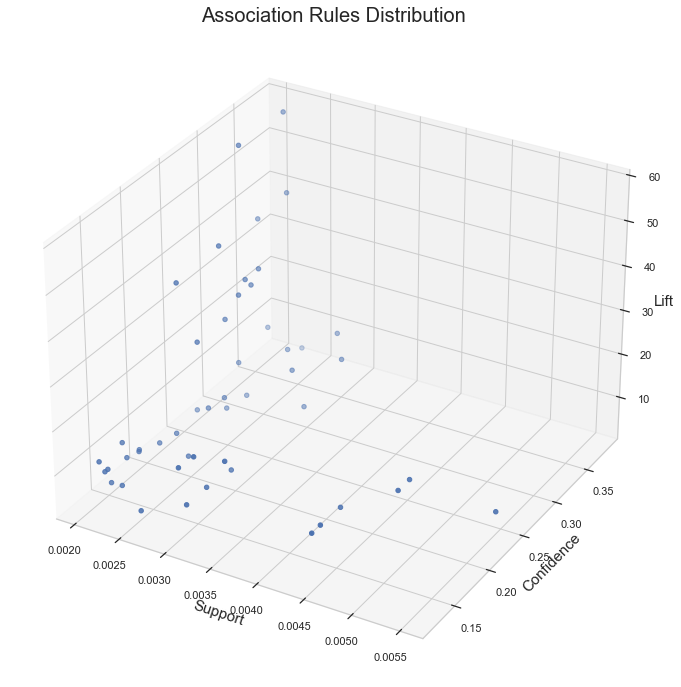

In [ ]:
#Cluster 0
visual_3d(rules0)

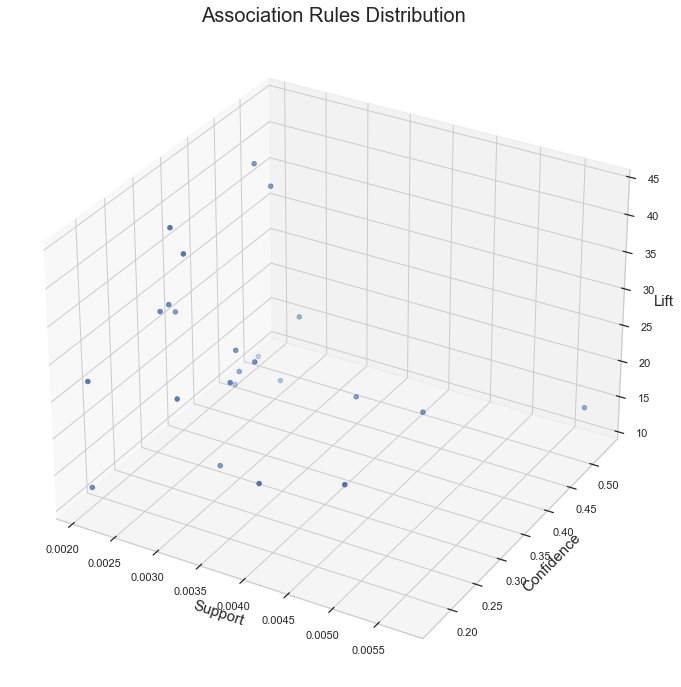

In [ ]:
#Cluster 1
visual_3d(rules1)

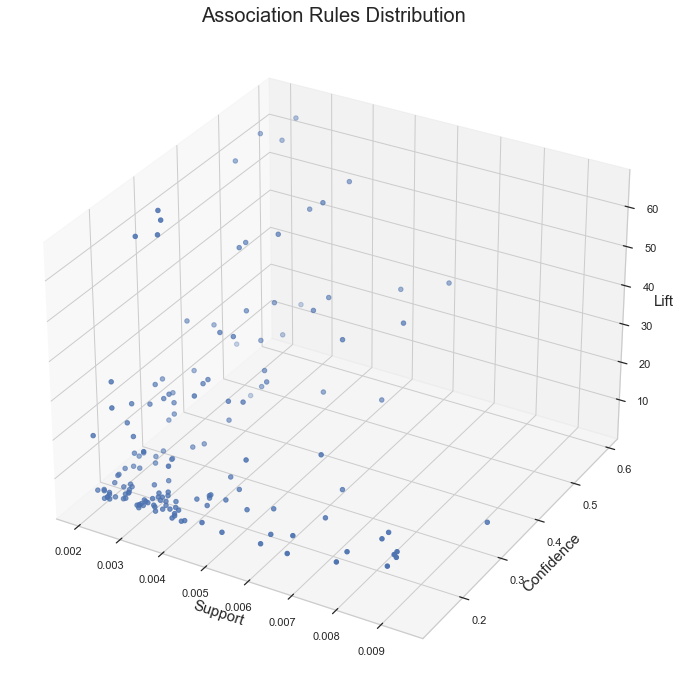

In [ ]:
#Cluster 2
visual_3d(rules2)

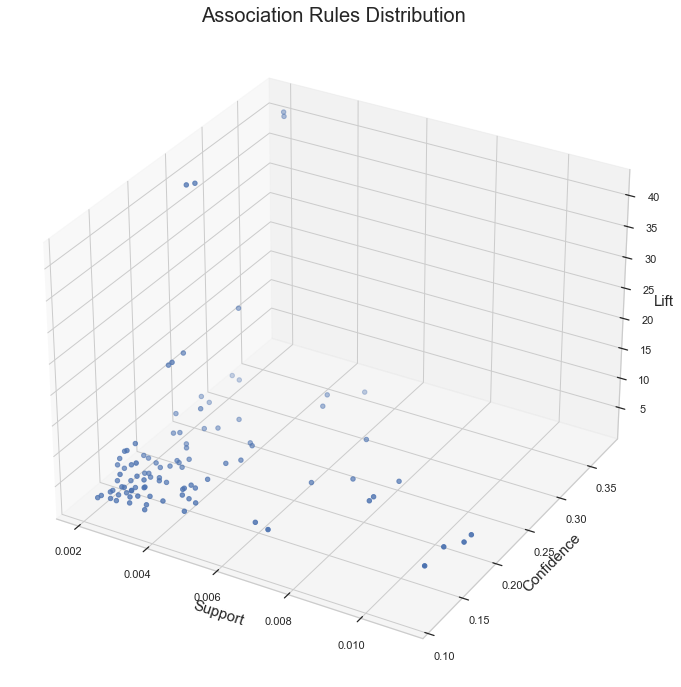

In [ ]:
#Cluster 3
visual_3d(rules3)

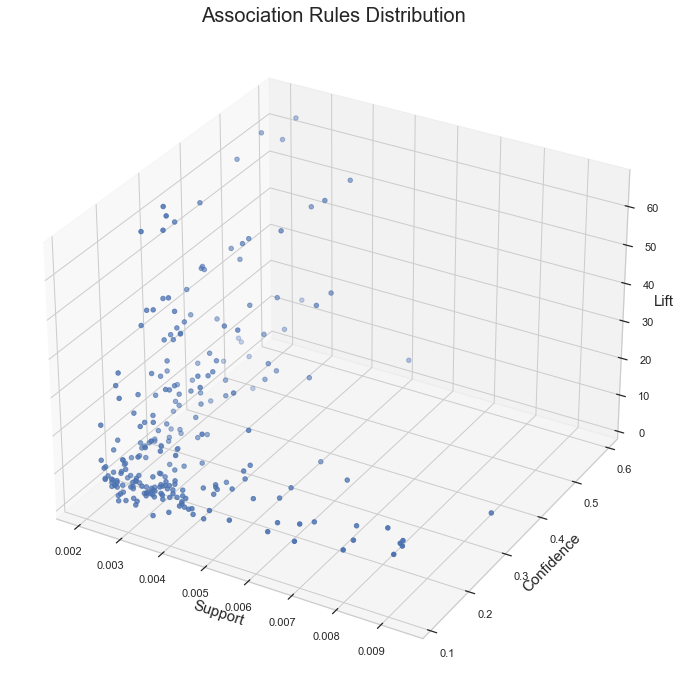

In [ ]:
# Combined Cluster
visual_3d(combined_rules)

In [ ]:
# Define function to create association rules network diagram

def draw_network(rules, rules_to_show):
  plt.figure(figsize=(12, 12))
  # Directional Graph from NetworkX
  network = nx.DiGraph()
  
  # Loop through number of rules to show
  for i in range(rules_to_show):
    
    # Add a Rule Node
    network.add_nodes_from(["R"+str(i)])
    for antecedents in rules.iloc[i]['antecedents']: 
        # Add antecedent node and link to rule
        network.add_nodes_from([antecedents])
        network.add_edge(antecedents, "R"+str(i),  weight = 2)
      
    for consequents in rules.iloc[i]['consequents']:
        # Add consequent node and link to rule
        network.add_nodes_from([consequents])
        network.add_edge("R"+str(i), consequents,  weight = 2)

  color_map=[]  
  
  # For every node, if it's a rule, colour as Black, otherwise Orange
  for node in network:
       if re.compile(str("^[R]\d+$")).fullmatch(str(node)) != None:
            color_map.append('black')
       else:
            color_map.append('red')
  
  # Position nodes using spring layout
  pos = nx.spring_layout(network, k=16, scale=1)
  # Draw the network graph
  nx.draw(network, pos, node_color = color_map, font_size=8)            
  
  # Shift the text position upwards
  for p in pos:  
      pos[p][1] += 0.12

  nx.draw_networkx_labels(network, pos)
  plt.title("Network Graph for Association Rules",fontsize=20)
  plt.show()

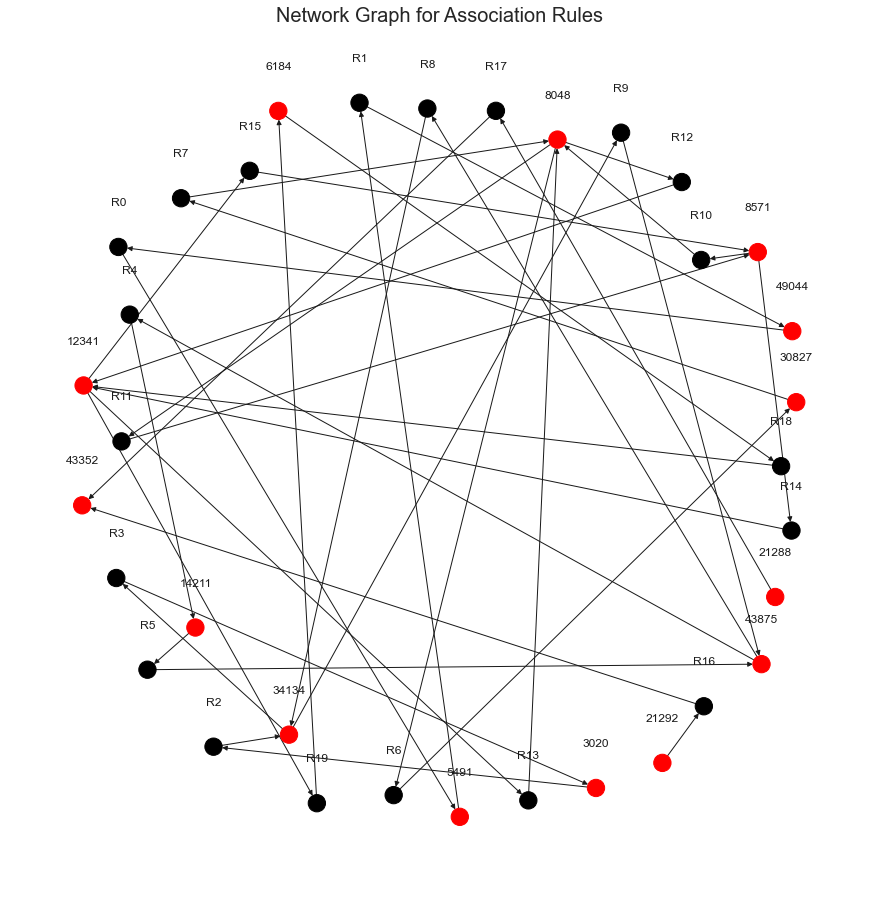

In [ ]:
#Cluster 0
draw_network(rules0, 20)

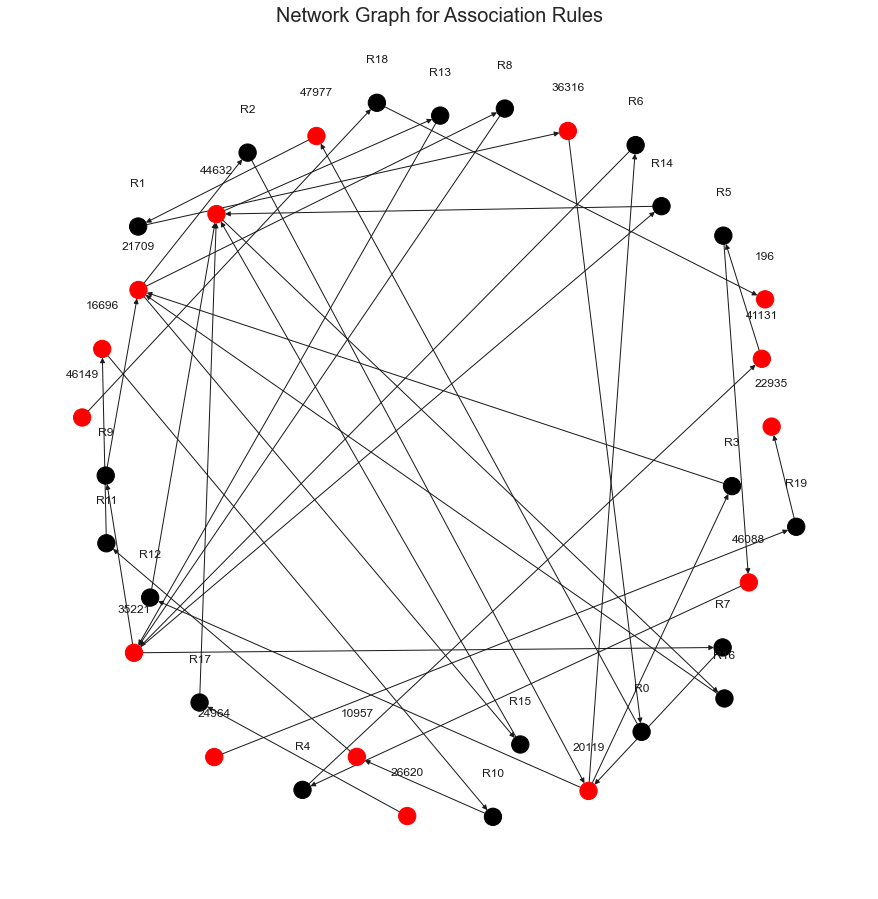

In [ ]:
#Cluster 1
draw_network(rules1, 20)

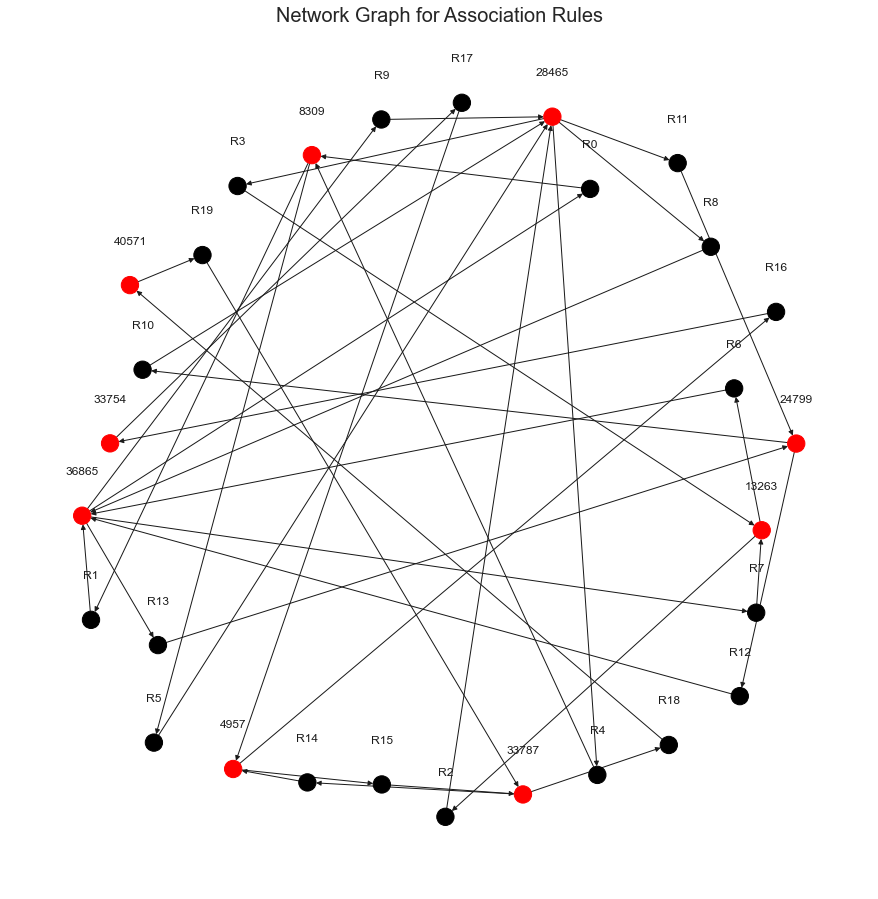

In [ ]:
#Cluster 2
draw_network(rules2, 20)

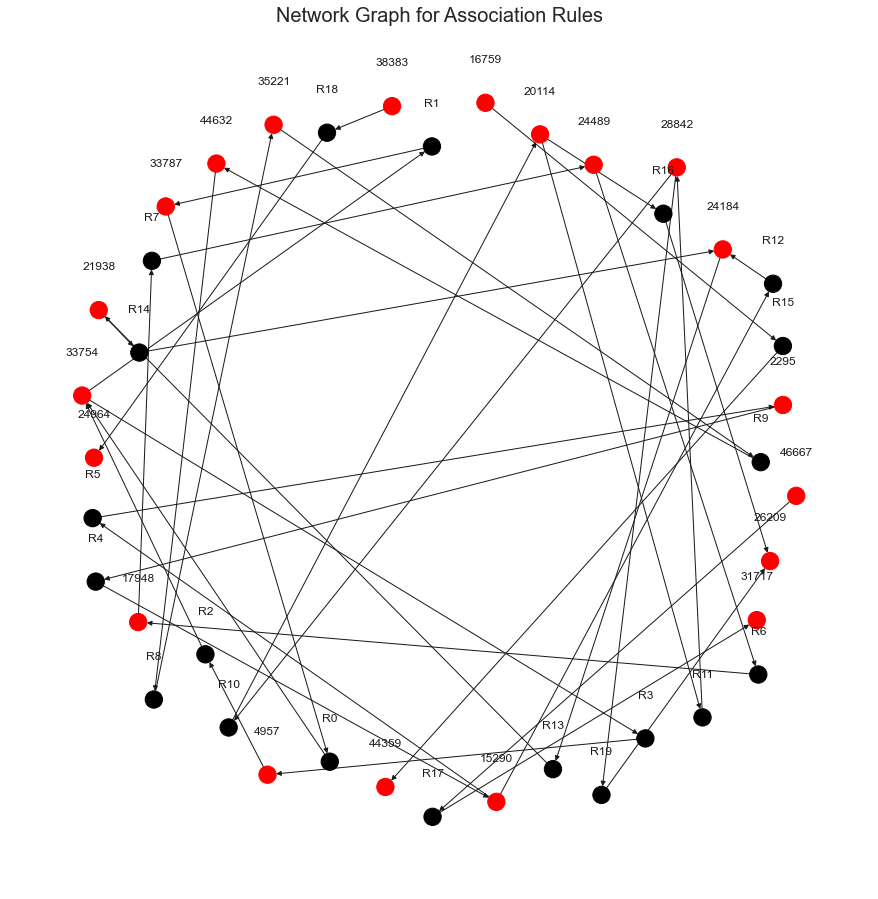

In [ ]:
#Cluster 3
draw_network(rules3, 20)

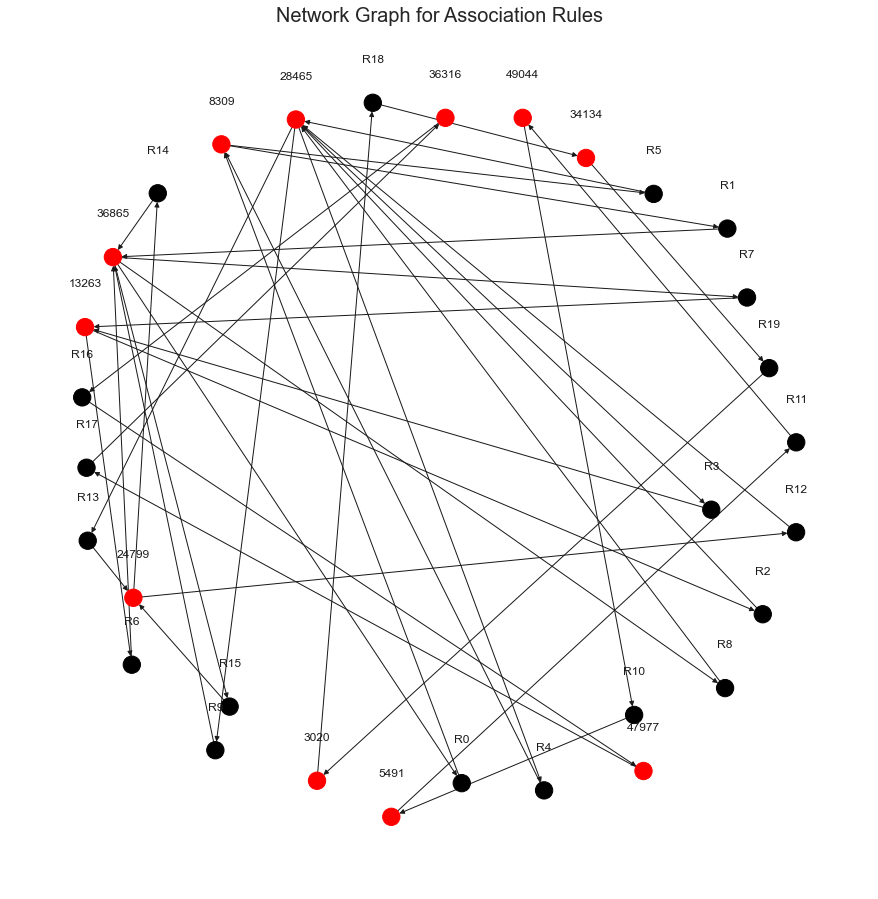

In [ ]:
# Combined Cluster
draw_network(combined_rules, 20)

In [ ]:
def rules_heat(rules):
    plt.figure(figsize=(12, 12))
    temp = rules.copy()
    temp.antecedents = temp.antecedents.apply(lambda x: next(iter(x)))
    temp.consequents = temp.consequents.apply(lambda x: next(iter(x)))
    temp['rec_item'] = temp['antecedents']
    
    temp['antecedents_'] = temp['antecedents'].apply(lambda a: ''.join(list(str(a))))
    temp['consequents_'] = temp['consequents'].apply(lambda a: ''.join(list(str(a))))
    pivot = temp[temp['rec_item']>0].pivot(index = 'antecedents_', columns = 'consequents_', values= 'lift')

    sns.heatmap(pivot, annot = True, cmap='viridis')
    plt.yticks(rotation=0)
    plt.xticks(rotation=90)
    plt.show()

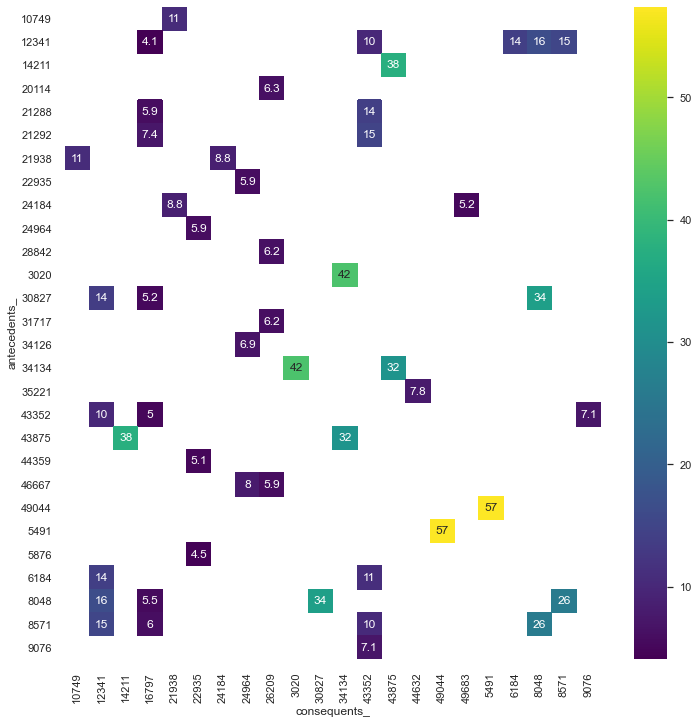

In [ ]:
# Cluster 0
rules_heat(rules0)

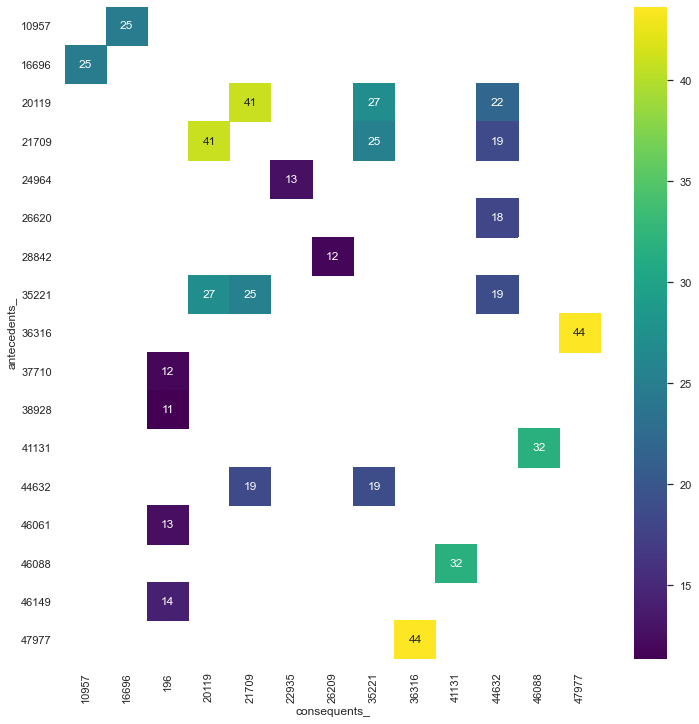

In [ ]:
# Cluster 1
rules_heat(rules1)

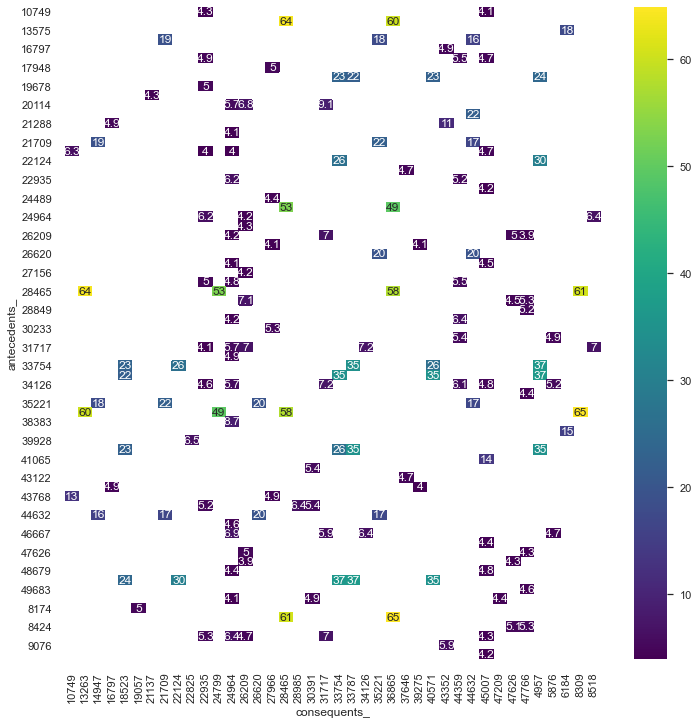

In [ ]:
# Cluster 2
rules_heat(rules2)

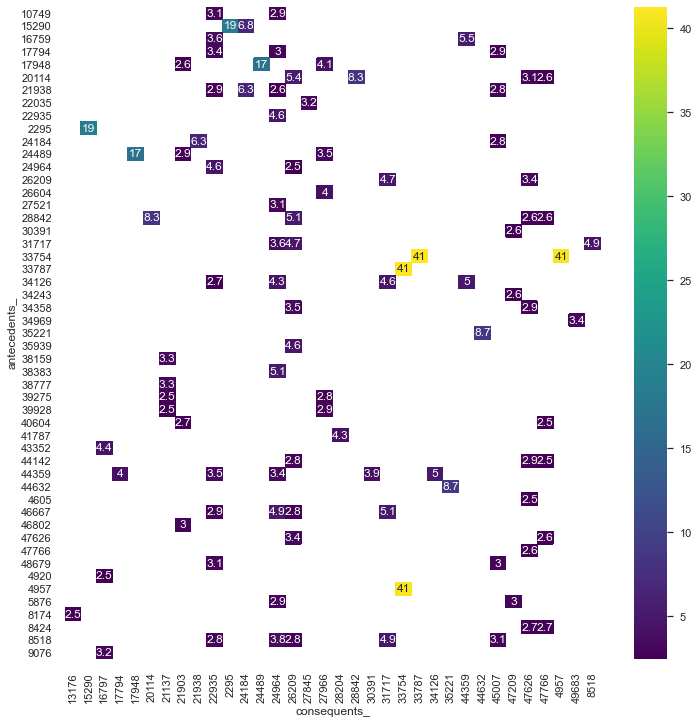

In [ ]:
# Cluster 3
rules_heat(rules3)

### Use Case

In [ ]:
combined_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(36865),(8309),0.008063,0.004292,0.002246,0.278607,64.910215,0.002212,1.380257
1,(8309),(36865),0.004292,0.008063,0.002246,0.523364,64.910215,0.002212,2.081123
2,(13263),(28465),0.004132,0.009226,0.002447,0.592233,64.190333,0.002409,2.429755
3,(28465),(13263),0.009226,0.004132,0.002447,0.265217,64.190333,0.002409,1.355324
4,(28465),(8309),0.009226,0.004292,0.002407,0.260870,60.777733,0.002367,1.347134
...,...,...,...,...,...,...,...,...,...
246,(44142),(47766),0.016542,0.069561,0.002897,0.175150,2.517941,0.001747,1.128010
247,(8174),(13176),0.015725,0.134664,0.005324,0.338583,2.514278,0.003207,1.308306
248,(4920),(16797),0.029642,0.046283,0.003442,0.116124,2.508991,0.002070,1.079016
249,(39275),(21137),0.031499,0.092219,0.007157,0.227201,2.463706,0.004252,1.174666


In [ ]:
# Define function to call Product Name from Product ID
def get_item_name(dataframe, stock_code):
    product_name = dataframe[dataframe["product_id"] == stock_code][["product_name"]].values[0].tolist()
    return product_name

In [ ]:
get_item_name(df_apriori, 36865)

['Non Fat Raspberry Yogurt']

In [ ]:
# Define function to show recommended product id from the product id provided

def recommend_products(rules_df, product_id, rec_count=5):
    sorted_rules = rules_df.sort_values('lift', ascending=False) 
    recommended_products = []  #
    recommended_products_name = []

    for i, product in sorted_rules["antecedents"].items(): 
        for j in list(product):  # assign to a list for each product
            if j == product_id:  # if the list you return is equal to product_id, which means the product id in the cart
                # consequences column's first product id add to recommended products list 
                recommended_products.append(
                    list(sorted_rules.iloc[i]["consequents"]))
    recommended_products = [item for sublist in recommended_products for item in sublist]                       
 
    return recommended_products[:rec_count] # return the recommended_products list by using rec_count limiter

In [ ]:
recommend_products(combined_rules, 36865)

[8309, 13263, 28465, 24799]

In [ ]:
# Define function to bring out list of product recommendation from the product id provided

def recommendation(target_id,dataframe,rules):
    target_product = get_item_name(dataframe,target_id)[0]
    recommended_product_ids = recommend_products(rules, target_id)

    recommended_product_names = []
    for i in range(len(recommended_product_ids)):
        recommended_product_names.append(
            get_item_name(df_apriori, recommended_product_ids[i] )) 

    print(f'Product in the cart: ({target_id}) {target_product}')
    print(f'Recommended Products ID: ',", ".join(map(str,recommended_product_ids)))
    print('Recommended Products Name: ',", ".join([', '.join([str(c) for c in lst]) for lst in recommended_product_names]))

In [ ]:
recommendation(28465, df_apriori, combined_rules)

Product in the cart: (28465) Icelandic Style Skyr Blueberry Non-fat Yogurt
Recommended Products ID:  13263, 8309, 36865, 24799
Recommended Products Name:  Non Fat Acai & Mixed Berries Yogurt, Nonfat Icelandic Style Strawberry Yogurt, Non Fat Raspberry Yogurt, Vanilla Skyr Nonfat Yogurt


The association rules can be used for providing product recommendation.

## FP-Growth

### Frequent Itemset & Rules

In [ ]:
# Define function to generate the association rules
def rules_fp(transaction):
    frequentItems = fpgrowth(transaction, min_support= 0.002, use_colnames=True, max_len = 2)
    rules = association_rules(frequentItems, metric="lift",  min_threshold = 1.5)
    display(rules.head())
    print("Identified Rules: ", len(rules))
    return rules

In [ ]:
# Cluster 0
%%time
fp_rules0 = rules_fp(trans_data0)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(17794),(21903),0.016938,0.063351,0.002652,0.156584,2.471667,0.001579,1.110541
1,(21903),(17794),0.063351,0.016938,0.002652,0.041865,2.471667,0.001579,1.026016
2,(28985),(24852),0.015612,0.142375,0.003797,0.243243,1.708470,0.001575,1.133290
3,(24852),(28985),0.142375,0.015612,0.003797,0.026672,1.708470,0.001575,1.011364
4,(28985),(47626),0.015612,0.044063,0.002592,0.166023,3.767886,0.001904,1.146240


Identified Rules:  442
Wall time: 11.4 s


In [ ]:
# Filter the rules with confidence & lift values above average
fp_rules0 = fp_rules0[(fp_rules0['confidence'] > fp_rules0['confidence'].mean()) & (fp_rules0['lift'] > fp_rules0['lift'].mean())] 

In [ ]:
fp_rules0 = fp_rules0.sort_values('lift',ascending=False, ignore_index=True)
fp_rules0

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(49044),(5491),0.005546,0.006631,0.002110,0.380435,57.376482,0.002073,1.603333
1,(5491),(49044),0.006631,0.005546,0.002110,0.318182,57.376482,0.002073,1.458533
2,(3020),(34134),0.006329,0.008559,0.002291,0.361905,42.281690,0.002236,1.553750
3,(34134),(3020),0.008559,0.006329,0.002291,0.267606,42.281690,0.002236,1.356743
4,(14211),(43875),0.006148,0.009102,0.002110,0.343137,37.699649,0.002054,1.508531
5,(43875),(14211),0.009102,0.006148,0.002110,0.231788,37.699649,0.002054,1.293721
6,(30827),(8048),0.008258,0.008800,0.002471,0.299270,34.006099,0.002399,1.414524
7,(8048),(30827),0.008800,0.008258,0.002471,0.280822,34.006099,0.002399,1.378994
8,(43875),(34134),0.009102,0.008559,0.002471,0.271523,31.722321,0.002393,1.360978
9,(34134),(43875),0.008559,0.009102,0.002471,0.288732,31.722321,0.002393,1.393144


In [ ]:
fp_rules0.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
mean,0.013046,0.022336,0.002710,0.231935,16.000987,0.002408,1.284927
std,0.005829,0.013244,0.000792,0.073803,13.920944,0.000650,0.129945
min,0.005546,0.005546,0.002049,0.124277,4.089506,0.001697,1.110252
25%,0.008620,0.009976,0.002125,0.162393,6.163017,0.002003,1.169666
50%,0.010609,0.020856,0.002441,0.230600,10.245940,0.002236,1.269829
75%,0.015732,0.027728,0.003014,0.288492,16.420540,0.002591,1.376446
max,0.027728,0.048764,0.005485,0.380435,57.376482,0.004389,1.603333


In [ ]:
# Cluster 1
%%time
fp_rules1 = rules_fp(trans_data1)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(31506),(24852),0.010875,0.093890,0.002407,0.221374,2.357800,0.001386,1.163729
1,(24852),(31506),0.093890,0.010875,0.002407,0.025641,2.357800,0.001386,1.015155
2,(49683),(21903),0.014611,0.035863,0.002075,0.142045,3.960832,0.001551,1.123763
3,(21903),(49683),0.035863,0.014611,0.002075,0.057870,3.960832,0.001551,1.045917
4,(49683),(24852),0.014611,0.093890,0.003985,0.272727,2.904750,0.002613,1.245901


Identified Rules:  140
Wall time: 1.36 s


In [ ]:
# Filter the rules with confidence & lift values above average
fp_rules1 = fp_rules1[(fp_rules1['confidence'] > fp_rules1['confidence'].mean()) & (fp_rules1['lift'] > fp_rules1['lift'].mean())] 

In [ ]:
fp_rules1 = fp_rules1.sort_values('lift',ascending=False, ignore_index=True)
fp_rules1

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(47977),(36316),0.009547,0.005977,0.002490,0.260870,43.644928,0.002433,1.344855
1,(36316),(47977),0.005977,0.009547,0.002490,0.416667,43.644928,0.002433,1.697920
2,(21709),(20119),0.010294,0.006309,0.002656,0.258065,40.903226,0.002592,1.339322
3,(20119),(21709),0.006309,0.010294,0.002656,0.421053,40.903226,0.002592,1.709492
4,(46088),(41131),0.008800,0.008302,0.002324,0.264151,31.819623,0.002251,1.347693
5,(41131),(46088),0.008302,0.008800,0.002324,0.280000,31.819623,0.002251,1.376667
6,(35221),(20119),0.012120,0.006309,0.002075,0.171233,27.140411,0.001999,1.198999
7,(20119),(35221),0.006309,0.012120,0.002075,0.328947,27.140411,0.001999,1.472135
8,(21709),(35221),0.010294,0.012120,0.003155,0.306452,25.284357,0.003030,1.424385
9,(35221),(21709),0.012120,0.010294,0.003155,0.260274,25.284357,0.003030,1.337936


In [ ]:
fp_rules1.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.009875,0.016797,0.002964,0.326422,24.022256,0.002814,1.492203
std,0.004101,0.010703,0.000947,0.101762,10.319440,0.000883,0.227081
min,0.004566,0.005977,0.002075,0.171233,11.334129,0.001911,1.190284
25%,0.006309,0.009360,0.002324,0.259722,17.137322,0.002251,1.338976
50%,0.009920,0.012120,0.002656,0.315131,23.341660,0.002592,1.441930
75%,0.012120,0.020339,0.003155,0.417763,28.310214,0.003030,1.682467
max,0.020339,0.037606,0.005728,0.530769,43.644928,0.005322,2.051004


In [ ]:
# Cluster 2
%%time
fp_rules2 = rules_fp(trans_data2)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(13176),(27966),0.137109,0.048899,0.016286,0.118783,2.429154,0.009582,1.079304
1,(27966),(13176),0.048899,0.137109,0.016286,0.333060,2.429154,0.009582,1.293805
2,(21137),(27966),0.101929,0.048899,0.015444,0.151515,3.098541,0.010460,1.120941
3,(27966),(21137),0.048899,0.101929,0.015444,0.315833,3.098541,0.010460,1.312647
4,(47209),(27966),0.073449,0.048899,0.010951,0.149099,3.049127,0.007360,1.117757


Identified Rules:  1684
Wall time: 3.76 s


In [ ]:
# Filter the rules with confidence & lift values above average
fp_rules2 = fp_rules2[(fp_rules2['confidence'] > fp_rules2['confidence'].mean()) & (fp_rules2['lift'] > fp_rules2['lift'].mean())] 

In [ ]:
fp_rules2 = fp_rules2.sort_values('lift',ascending=False, ignore_index=True)
fp_rules2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(8309),(36865),0.004292,0.008063,0.002246,0.523364,64.910215,0.002212,2.081123
1,(36865),(8309),0.008063,0.004292,0.002246,0.278607,64.910215,0.002212,1.380257
2,(28465),(13263),0.009226,0.004132,0.002447,0.265217,64.190333,0.002409,1.355324
3,(13263),(28465),0.004132,0.009226,0.002447,0.592233,64.190333,0.002409,2.429755
4,(28465),(8309),0.009226,0.004292,0.002407,0.260870,60.777733,0.002367,1.347134
...,...,...,...,...,...,...,...,...,...
152,(21938),(24964),0.016326,0.034578,0.002246,0.137592,3.979158,0.001682,1.119449
153,(43352),(39275),0.028361,0.036263,0.004092,0.144272,3.978480,0.003063,1.126218
154,(21938),(22935),0.016326,0.037266,0.002407,0.147420,3.955906,0.001798,1.129201
155,(26209),(47766),0.040395,0.047054,0.007461,0.184707,3.925458,0.005560,1.168839


In [ ]:
fp_rules2.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000
mean,0.017530,0.026979,0.003629,0.242194,15.405706,0.003108,1.322513
std,0.009589,0.014790,0.001605,0.113235,16.495421,0.001332,0.265416
min,0.004132,0.004132,0.002006,0.133411,3.925458,0.001589,1.119449
25%,0.010751,0.012435,0.002407,0.152941,4.727167,0.002119,1.146012
50%,0.015324,0.027638,0.003249,0.201342,6.194909,0.002736,1.205295
75%,0.021822,0.036263,0.004092,0.286765,22.100177,0.003633,1.373589
max,0.047455,0.101929,0.009387,0.592233,64.910215,0.007268,2.429755


In [ ]:
# Cluster 3
%%time
fp_rules3 = rules_fp(trans_data3)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(21137),(21903),0.092219,0.089000,0.013273,0.143931,1.617204,0.005066,1.064167
1,(21903),(21137),0.089000,0.092219,0.013273,0.149137,1.617204,0.005066,1.066895
2,(13176),(21903),0.134664,0.089000,0.018201,0.135160,1.518651,0.006216,1.053374
3,(21903),(13176),0.089000,0.134664,0.018201,0.204508,1.518651,0.006216,1.087799
4,(46667),(21903),0.021321,0.089000,0.004160,0.195122,2.192380,0.002263,1.131848


Identified Rules:  1024
Wall time: 7.05 s


In [ ]:
# Filter the rules with confidence & lift values above average
fp_rules3 = fp_rules3[(fp_rules3['confidence'] > fp_rules3['confidence'].mean()) & (fp_rules3['lift'] > fp_rules3['lift'].mean())] 

In [ ]:
fp_rules3 = fp_rules3.sort_values('lift',ascending=False, ignore_index=True)
fp_rules3

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(33754),(33787),0.009113,0.005795,0.002179,0.239130,41.267373,0.002126,1.306670
1,(33787),(33754),0.005795,0.009113,0.002179,0.376068,41.267373,0.002126,1.588134
2,(4957),(33754),0.006042,0.009113,0.002253,0.372951,40.925272,0.002198,1.580238
3,(33754),(4957),0.009113,0.006042,0.002253,0.247283,40.925272,0.002198,1.320493
4,(2295),(15290),0.010054,0.015031,0.002798,0.278325,18.516186,0.002647,1.364837
...,...,...,...,...,...,...,...,...,...
94,(44142),(47766),0.016542,0.069561,0.002897,0.175150,2.517941,0.001747,1.128010
95,(8174),(13176),0.015725,0.134664,0.005324,0.338583,2.514278,0.003207,1.308306
96,(4920),(16797),0.029642,0.046283,0.003442,0.116124,2.508991,0.002070,1.079016
97,(39275),(21137),0.031499,0.092219,0.007157,0.227201,2.463706,0.004252,1.174666


In [ ]:
fp_rules3.describe()

,antecedent support,consequent support,support,confidence,lift,leverage,conviction
count,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000
mean,0.021929,0.047168,0.003653,0.177461,5.807227,0.002608,1.164379
std,0.011674,0.023166,0.002033,0.059159,7.900968,0.001391,0.090479
min,0.005795,0.005795,0.002006,0.112113,2.462832,0.001326,1.077741
25%,0.015031,0.032378,0.002476,0.130900,2.796141,0.001710,1.107191
50%,0.019216,0.043089,0.002996,0.155689,3.293277,0.002178,1.130838
75%,0.025952,0.058764,0.003999,0.206005,4.799837,0.002721,1.190460
max,0.069561,0.134664,0.011020,0.376068,41.267373,0.007756,1.588134


The resulting association rules from FP-Growth algorithm is the same as Apriori, but with much faster time.

## ECLAT 

Equivalence Class Clustering and Bottom-Up Lattice Traversal

In [ ]:
#pip install apyori

In [ ]:
from apyori import apriori

In [ ]:
eclat_0 = df_cluster0.groupby('order_id')['product_id'].apply(list).reset_index(drop=True)
eclat_1 = df_cluster1.groupby('order_id')['product_id'].apply(list).reset_index(drop=True)
eclat_2 = df_cluster2.groupby('order_id')['product_id'].apply(list).reset_index(drop=True)
eclat_3 = df_cluster3.groupby('order_id')['product_id'].apply(list).reset_index(drop=True)

In [ ]:
eclat_0

0        [1819, 9327, 17794, 28985, 30035, 33120, 40141...
1                                    [15873, 40462, 41897]
2                                    [24838, 41540, 42265]
3                        [4149, 5009, 25718, 31478, 33106]
4                                     [1158, 42944, 48559]
                               ...                        
16585            [3957, 22475, 30391, 44987, 47107, 48556]
16586    [5479, 8174, 8297, 16351, 21614, 24964, 29662,...
16587    [2102, 2481, 9493, 9558, 16797, 29078, 29675, ...
16588    [3861, 18625, 22959, 34940, 41290, 42964, 4386...
16589    [3290, 3464, 13176, 18670, 19706, 20600, 21137...
Name: product_id, Length: 16590, dtype: object

In [ ]:
def generate_metric(output):
    lhs         = [tuple(result[2][0][0])[0] for result in output]
    rhs         = [tuple(result[2][0][1])[0] for result in output]
    support    = [result[1] for result in output]
    confidence = [result[2][0][2] for result in output]
    lift       = [result[2][0][3] for result in output]
    return list(zip(lhs, rhs, support, confidence, lift))

In [ ]:
def eclat_apriori(df):
    rules = apriori(transactions = df, min_support = 0.002, min_lift = 1.5, min_length = 2, max_length = 2)
    result = list(rules)
    output = pd.DataFrame(generate_metric(result), columns = ['antecedents', 'consequents', 'support', 'confidence', 'lift'])
    output = output.sort_values('lift', ascending=False, ignore_index=True)
    print("Identified Rules: ", len(output))
    return output

### Frequent Itemset & Rules

In [ ]:
# Cluster 0
%%time
e_rules0 = eclat_apriori(eclat_0)
e_rules0

Identified Rules:  221
Wall time: 895 ms


,antecedents,consequents,support,confidence,lift
0,5491,49044,0.002110,0.318182,57.376482
1,3020,34134,0.002291,0.361905,42.281690
2,14211,43875,0.002110,0.343137,37.699649
3,8048,30827,0.002471,0.280822,34.006099
4,34134,43875,0.002471,0.288732,31.722321
...,...,...,...,...,...
216,16797,47626,0.003315,0.067985,1.542919
217,24852,41950,0.002954,0.020745,1.536436
218,13176,28199,0.002110,0.020492,1.524480
219,13176,26604,0.002712,0.026347,1.512423


In [ ]:
e_rules0.describe()

,antecedents,consequents,support,confidence,lift
count,221.000000,221.000000,221.000000,221.000000,221.000000
mean,19205.809955,34444.963801,0.003473,0.112590,4.058537
std,9569.643625,11759.183221,0.001994,0.086780,6.475853
min,3020.000000,8571.000000,0.002049,0.014395,1.503015
25%,13176.000000,24852.000000,0.002351,0.041569,1.836507
50%,21137.000000,35951.000000,0.002773,0.082935,2.307660
75%,24852.000000,47144.000000,0.003858,0.157895,3.028162
max,47766.000000,49683.000000,0.014949,0.361905,57.376482


In [ ]:
# Cluster 1
%%time
e_rules1 = eclat_apriori(eclat_1)
e_rules1

Identified Rules:  70
Wall time: 349 ms


,antecedents,consequents,support,confidence,lift
0,36316,47977,0.002490,0.416667,43.644928
1,20119,21709,0.002656,0.421053,40.903226
2,41131,46088,0.002324,0.280000,31.819623
3,20119,35221,0.002075,0.328947,27.140411
4,21709,35221,0.003155,0.306452,25.284357
...,...,...,...,...,...
65,24852,26209,0.003819,0.040672,1.731218
66,13176,16797,0.002490,0.045181,1.722301
67,24852,39275,0.003072,0.032714,1.713382
68,21137,24852,0.005230,0.159898,1.703039


In [ ]:
e_rules1.describe()

,antecedents,consequents,support,confidence,lift
count,70.000000,70.000000,70.000000,70.000000,70.000000
mean,19689.314286,34989.714286,0.003244,0.137093,7.439942
std,9283.111353,10603.626448,0.001338,0.116920,9.176268
min,196.000000,13176.000000,0.002075,0.022104,1.670706
25%,13176.000000,25195.500000,0.002324,0.046043,2.570070
50%,21806.000000,33363.500000,0.002823,0.093251,3.272941
75%,24852.000000,46133.750000,0.003819,0.212318,6.758102
max,47626.000000,49683.000000,0.008385,0.447368,43.644928


In [ ]:
# Cluster 2
%%time
e_rules2 = eclat_apriori(eclat_2)
e_rules2

Identified Rules:  842
Wall time: 2.98 s


,antecedents,consequents,support,confidence,lift
0,8309,36865,0.002246,0.523364,64.910215
1,13263,28465,0.002447,0.592233,64.190333
2,8309,28465,0.002407,0.560748,60.777733
3,13263,36865,0.002006,0.485437,60.206250
4,28465,36865,0.004292,0.465217,57.698529
...,...,...,...,...,...
837,8518,24852,0.004092,0.196532,1.515416
838,13176,17794,0.004854,0.035401,1.508559
839,13176,27344,0.002728,0.019895,1.507460
840,26209,39275,0.002206,0.054618,1.506155


In [ ]:
e_rules2.describe()

,antecedents,consequents,support,confidence,lift
count,842.000000,842.000000,842.000000,842.000000,842.000000
mean,20712.869359,35201.724466,0.003745,0.123843,3.925408
std,10086.164091,10599.795205,0.002558,0.097098,6.340346
min,260.000000,8277.000000,0.002006,0.014921,1.501592
25%,13176.000000,26209.000000,0.002327,0.050791,2.095598
50%,21616.000000,36695.000000,0.002848,0.096964,2.587682
75%,26209.000000,45066.000000,0.004172,0.176771,3.475215
max,47766.000000,49683.000000,0.026395,0.592233,64.910215


In [ ]:
# Cluster 3
%%time
e_rules3 = eclat_apriori(eclat_3)
e_rules3

Identified Rules:  512
Wall time: 1.91 s


,antecedents,consequents,support,confidence,lift
0,33754,33787,0.002179,0.239130,41.267373
1,4957,33754,0.002253,0.372951,40.925272
2,2295,15290,0.002798,0.278325,18.516186
3,17948,24489,0.002501,0.214894,16.720297
4,35221,44632,0.003046,0.211704,8.652864
...,...,...,...,...,...
507,21903,22825,0.002328,0.026155,1.502389
508,16797,47626,0.004086,0.088283,1.502328
509,37646,47626,0.002402,0.088262,1.501980
510,11520,21137,0.002105,0.138436,1.501166


In [ ]:
e_rules3.describe()

,antecedents,consequents,support,confidence,lift
count,512.000000,512.000000,512.000000,512.000000,512.000000
mean,21571.111328,36637.119141,0.003797,0.105233,2.442221
std,10674.982036,10812.453328,0.002573,0.070553,2.738233
min,432.000000,8277.000000,0.002006,0.011220,1.500703
25%,13176.000000,26209.000000,0.002371,0.049638,1.741946
50%,21903.000000,40574.500000,0.002996,0.092528,1.990224
75%,26209.000000,47209.000000,0.004136,0.144994,2.394789
max,47766.000000,49683.000000,0.022163,0.372951,41.267373


The resulting association rules from ECLAT algorithm also the same as Apriori and FP-Growth with faster time than FP-Growth. But, with the trade-off less information provided.

## Generated Rules

### Final Rules

In [ ]:
# Define function to format the resulting association rules
def formatting_rules(rules):
    final_rules = rules[['antecedents','consequents','lift','confidence']]
    final_rules.antecedents = final_rules.antecedents.apply(lambda x: next(iter(x)))
    final_rules.consequents = final_rules.consequents.apply(lambda x: next(iter(x)))

    final_rules = final_rules.rename(columns={"antecedents": "product_id"})
    final_rules = pd.merge(final_rules, df_products[['product_id','product_name']], on='product_id' )
    final_rules = pd.merge(final_rules, df2[['product_id','aisle_id','aisle','department_id','department']], on='product_id' )

    final_rules = final_rules.rename(columns={"product_id": "antecedents_id","product_name":"antecedents_name","aisle_id":"ant_aisle_id","aisle":"ant_aisle","department_id":"ant_dept_id","department":"ant_dept","consequents":"product_id"})
    final_rules = pd.merge(final_rules, df_products[['product_id','product_name']], on='product_id' )
    final_rules = pd.merge(final_rules, df2[['product_id','aisle_id','aisle','department_id','department']], on='product_id' )

    final_rules = final_rules.rename(columns={"product_id": "consequents_id","product_name":"consequents_name","aisle_id":"con_aisle_id","aisle":"con_aisle","department_id":"con_dept_id","department":"con_dept"})

    new_cols = ["antecedents_id","antecedents_name","ant_aisle_id","ant_aisle","ant_dept_id","ant_dept","consequents_id","consequents_name","con_aisle_id","con_aisle","con_dept_id","con_dept","confidence", "lift"]
    final_rules=final_rules[new_cols]
    return final_rules

In [ ]:
# Cluster 0
final_rules0 = formatting_rules(rules0)
final_rules0

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,49044,"Organic Pears, Peas and Broccoli Puree Stage 1",92,baby food formula,18,babies,5491,Stage 1 Apples Sweet Potatoes Pumpkin & Bluebe...,92,baby food formula,18,babies,0.380435,57.376482
1,5491,Stage 1 Apples Sweet Potatoes Pumpkin & Bluebe...,92,baby food formula,18,babies,49044,"Organic Pears, Peas and Broccoli Puree Stage 1",92,baby food formula,18,babies,0.318182,57.376482
2,3020,Broccoli & Apple Stage 2 Baby Food,92,baby food formula,18,babies,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,0.361905,42.281690
3,43875,Baby Food Stage 2 Blueberry Pear & Purple Carrot,92,baby food formula,18,babies,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,0.271523,31.722321
4,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,3020,Broccoli & Apple Stage 2 Baby Food,92,baby food formula,18,babies,0.267606,42.281690
5,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,43875,Baby Food Stage 2 Blueberry Pear & Purple Carrot,92,baby food formula,18,babies,0.288732,31.722321
6,14211,Baby Food Stage 2 Pumpkin Banana,92,baby food formula,18,babies,43875,Baby Food Stage 2 Blueberry Pear & Purple Carrot,92,baby food formula,18,babies,0.343137,37.699649
7,43875,Baby Food Stage 2 Blueberry Pear & Purple Carrot,92,baby food formula,18,babies,14211,Baby Food Stage 2 Pumpkin Banana,92,baby food formula,18,babies,0.231788,37.699649
8,8048,Packaged Grape Tomatoes,32,packaged produce,4,produce,30827,Seedless Cucumbers,32,packaged produce,4,produce,0.280822,34.006099
9,8048,Packaged Grape Tomatoes,32,packaged produce,4,produce,8571,Baby Cucumbers,32,packaged produce,4,produce,0.267123,26.068090


In [ ]:
# Check rules with different aisle
different_ailes0 = final_rules0[final_rules0['ant_aisle']!=final_rules0['con_aisle']]

In [ ]:
# Cluster 1
final_rules1 = formatting_rules(rules1)
final_rules1

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,36316,Lemon Sparkling Water,115,water seltzer sparkling water,7,beverages,47977,Grapefruit Sparkling Water,115,water seltzer sparkling water,7,beverages,0.416667,43.644928
1,47977,Grapefruit Sparkling Water,115,water seltzer sparkling water,7,beverages,36316,Lemon Sparkling Water,115,water seltzer sparkling water,7,beverages,0.260870,43.644928
2,21709,Sparkling Lemon Water,115,water seltzer sparkling water,7,beverages,20119,Sparkling Water Berry,115,water seltzer sparkling water,7,beverages,0.258065,40.903226
3,35221,Lime Sparkling Water,115,water seltzer sparkling water,7,beverages,20119,Sparkling Water Berry,115,water seltzer sparkling water,7,beverages,0.171233,27.140411
4,21709,Sparkling Lemon Water,115,water seltzer sparkling water,7,beverages,35221,Lime Sparkling Water,115,water seltzer sparkling water,7,beverages,0.306452,25.284357
5,20119,Sparkling Water Berry,115,water seltzer sparkling water,7,beverages,35221,Lime Sparkling Water,115,water seltzer sparkling water,7,beverages,0.328947,27.140411
6,44632,Sparkling Water Grapefruit,115,water seltzer sparkling water,7,beverages,35221,Lime Sparkling Water,115,water seltzer sparkling water,7,beverages,0.228571,18.858708
7,21709,Sparkling Lemon Water,115,water seltzer sparkling water,7,beverages,44632,Sparkling Water Grapefruit,115,water seltzer sparkling water,7,beverages,0.379032,18.636011
8,20119,Sparkling Water Berry,115,water seltzer sparkling water,7,beverages,44632,Sparkling Water Grapefruit,115,water seltzer sparkling water,7,beverages,0.447368,21.995918
9,35221,Lime Sparkling Water,115,water seltzer sparkling water,7,beverages,44632,Sparkling Water Grapefruit,115,water seltzer sparkling water,7,beverages,0.383562,18.858708


In [ ]:
# Check rules with different aisle
different_ailes1 = final_rules1[final_rules1['ant_aisle']!=final_rules1['con_aisle']]

In [ ]:
# Cluster 2
final_rules2 = formatting_rules(rules2)
final_rules2

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,36865,Non Fat Raspberry Yogurt,120,yogurt,16,dairy eggs,8309,Nonfat Icelandic Style Strawberry Yogurt,120,yogurt,16,dairy eggs,0.278607,64.910215
1,28465,Icelandic Style Skyr Blueberry Non-fat Yogurt,120,yogurt,16,dairy eggs,8309,Nonfat Icelandic Style Strawberry Yogurt,120,yogurt,16,dairy eggs,0.260870,60.777733
2,36865,Non Fat Raspberry Yogurt,120,yogurt,16,dairy eggs,13263,Non Fat Acai & Mixed Berries Yogurt,120,yogurt,16,dairy eggs,0.248756,60.206250
3,28465,Icelandic Style Skyr Blueberry Non-fat Yogurt,120,yogurt,16,dairy eggs,13263,Non Fat Acai & Mixed Berries Yogurt,120,yogurt,16,dairy eggs,0.265217,64.190333
4,36865,Non Fat Raspberry Yogurt,120,yogurt,16,dairy eggs,28465,Icelandic Style Skyr Blueberry Non-fat Yogurt,120,yogurt,16,dairy eggs,0.532338,57.698529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,43352,Raspberries,32,packaged produce,4,produce,39275,Organic Blueberries,123,packaged vegetables fruits,4,produce,0.144272,3.978480
153,26604,Organic Blackberries,24,fresh fruits,4,produce,39275,Organic Blueberries,123,packaged vegetables fruits,4,produce,0.149105,4.111778
154,43122,Organic Bartlett Pear,24,fresh fruits,4,produce,37646,Organic Gala Apples,24,fresh fruits,4,produce,0.143167,4.727167
155,22825,Organic D'Anjou Pears,24,fresh fruits,4,produce,37646,Organic Gala Apples,24,fresh fruits,4,produce,0.141264,4.664330


In [ ]:
# Check rules with different aisle
different_ailes2 = final_rules2[final_rules2['ant_aisle']!=final_rules2['con_aisle']]

In [ ]:
# Cluster 3
final_rules3 = formatting_rules(rules3)
final_rules3

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,33787,Total 2% Lowfat Greek Strained Yogurt with Peach,120,yogurt,16,dairy eggs,33754,Total 2% with Strawberry Lowfat Greek Strained...,120,yogurt,16,dairy eggs,0.376068,41.267373
1,4957,Total 2% Lowfat Greek Strained Yogurt With Blu...,120,yogurt,16,dairy eggs,33754,Total 2% with Strawberry Lowfat Greek Strained...,120,yogurt,16,dairy eggs,0.372951,40.925272
2,33754,Total 2% with Strawberry Lowfat Greek Strained...,120,yogurt,16,dairy eggs,33787,Total 2% Lowfat Greek Strained Yogurt with Peach,120,yogurt,16,dairy eggs,0.239130,41.267373
3,33754,Total 2% with Strawberry Lowfat Greek Strained...,120,yogurt,16,dairy eggs,4957,Total 2% Lowfat Greek Strained Yogurt With Blu...,120,yogurt,16,dairy eggs,0.247283,40.925272
4,2295,Yellow Bell Pepper,83,fresh vegetables,4,produce,15290,Orange Bell Pepper,83,fresh vegetables,4,produce,0.278325,18.516186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,22035,Organic Whole String Cheese,21,packaged cheese,16,dairy eggs,27845,Organic Whole Milk,84,milk,16,dairy eggs,0.152898,3.227555
95,5876,Organic Lemon,24,fresh fruits,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.237553,2.980080
96,30391,Organic Cucumber,83,fresh vegetables,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.206924,2.595843
97,34243,Organic Baby Broccoli,83,fresh vegetables,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.206831,2.594674


In [ ]:
# Check rules with different aisle
different_ailes3 =final_rules3[final_rules3['ant_aisle']!=final_rules3['con_aisle']]

In [ ]:
#pd.options.display.max_rows = 10

In [ ]:
# Combined all rules
frames = [final_rules0, final_rules1, final_rules2, final_rules3]
  
final_rules = pd.concat(frames)
final_rules.sort_values('lift',ignore_index=True)
final_rules.drop_duplicates(['antecedents_name','consequents_name'], keep='first',inplace=True)
final_rules

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,49044,"Organic Pears, Peas and Broccoli Puree Stage 1",92,baby food formula,18,babies,5491,Stage 1 Apples Sweet Potatoes Pumpkin & Bluebe...,92,baby food formula,18,babies,0.380435,57.376482
1,5491,Stage 1 Apples Sweet Potatoes Pumpkin & Bluebe...,92,baby food formula,18,babies,49044,"Organic Pears, Peas and Broccoli Puree Stage 1",92,baby food formula,18,babies,0.318182,57.376482
2,3020,Broccoli & Apple Stage 2 Baby Food,92,baby food formula,18,babies,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,0.361905,42.281690
3,43875,Baby Food Stage 2 Blueberry Pear & Purple Carrot,92,baby food formula,18,babies,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,0.271523,31.722321
4,34134,Spinach Peas & Pear Stage 2 Baby Food,92,baby food formula,18,babies,3020,Broccoli & Apple Stage 2 Baby Food,92,baby food formula,18,babies,0.267606,42.281690
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,39275,Organic Blueberries,123,packaged vegetables fruits,4,produce,21137,Organic Strawberries,24,fresh fruits,4,produce,0.227201,2.463706
94,22035,Organic Whole String Cheese,21,packaged cheese,16,dairy eggs,27845,Organic Whole Milk,84,milk,16,dairy eggs,0.152898,3.227555
96,30391,Organic Cucumber,83,fresh vegetables,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.206924,2.595843
97,34243,Organic Baby Broccoli,83,fresh vegetables,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.206831,2.594674


In [ ]:
# Combined list of different aisle
frames = [different_ailes0, different_ailes1, different_ailes2, different_ailes3]
  
different_aisle = pd.concat(frames)
different_aisle.drop_duplicates(['antecedents_name','consequents_name'], keep='first',inplace=True)
different_aisle.sort_values('antecedents_id',ignore_index=True)

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,4605,Yellow Onions,83,fresh vegetables,4,produce,47626,Large Lemon,24,fresh fruits,4,produce,0.144725,2.462832
1,4920,Seedless Red Grapes,123,packaged vegetables fruits,4,produce,16797,Strawberries,24,fresh fruits,4,produce,0.116124,2.508991
2,5876,Organic Lemon,24,fresh fruits,4,produce,30391,Organic Cucumber,83,fresh vegetables,4,produce,0.134910,4.881221
3,5876,Organic Lemon,24,fresh fruits,4,produce,24964,Organic Garlic,83,fresh vegetables,4,produce,0.140473,4.062469
4,5876,Organic Lemon,24,fresh fruits,4,produce,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,0.124277,4.482093
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,46667,Organic Ginger Root,83,fresh vegetables,4,produce,26209,Limes,24,fresh fruits,4,produce,0.184783,5.895276
79,46667,Organic Ginger Root,83,fresh vegetables,4,produce,31717,Organic Cilantro,16,fresh herbs,4,produce,0.134529,5.863072
80,46667,Organic Ginger Root,83,fresh vegetables,4,produce,34126,Organic Italian Parsley Bunch,16,fresh herbs,4,produce,0.134529,6.387956
81,46802,Pineapple Chunks,116,frozen produce,1,frozen,21903,Organic Baby Spinach,123,packaged vegetables fruits,4,produce,0.263473,2.960370


In [ ]:
different_aisle = different_aisle[['ant_aisle','ant_dept','con_aisle','con_dept']].sort_index(ignore_index=True)

In [ ]:
different_aisle = pd.crosstab(different_aisle['ant_aisle'],different_aisle['con_aisle'])

In [ ]:
# Sum of different aisle
different_aisle

con_aisle,fresh fruits,fresh herbs,fresh vegetables,frozen produce,milk,packaged produce,packaged vegetables fruits,soft drinks
ant_aisle,,,,,,,,
canned meals beans,2,0,0,0,0,0,0,0
eggs,0,0,0,0,0,0,1,0
fresh fruits,0,1,4,0,0,3,3,0
fresh herbs,5,0,8,0,0,0,0,0
fresh vegetables,21,6,0,0,0,0,1,0
frozen produce,1,0,0,0,0,1,5,0
packaged cheese,1,0,1,0,1,0,1,0
packaged poultry,1,0,0,0,0,0,0,0
packaged produce,6,0,0,1,0,0,1,0


Most association rule that generated, antecedent and consequent have the same aisle. So, the placement already appropriate.

Still, there are **83 out of 251 rules** that have different aisle. So, **layout arrangement** is needed to **optimize shopping efficiency**.

### List Recommendation

In [ ]:
# Define function to provide list of antecedent products
def list_rules(list):
    rules = final_rules[final_rules['antecedents_name'].isin(list)]
    rules = rules.sort_values('antecedents_id',ignore_index=True)
    return rules

In [ ]:
# List of products that reorder weekly
weekly_product = df_final[(df_final["days_since_prior_order"]==7)]["product_name"].value_counts().head(25).index.tolist()
weekly_product

['Banana',
 'Bag of Organic Bananas',
 'Organic Strawberries',
 'Organic Baby Spinach',
 'Organic Avocado',
 'Organic Hass Avocado',
 'Large Lemon',
 'Strawberries',
 'Limes',
 'Organic Whole Milk',
 'Organic Raspberries',
 'Organic Garlic',
 'Organic Yellow Onion',
 'Organic Blueberries',
 'Organic Fuji Apple',
 'Cucumber Kirby',
 'Organic Zucchini',
 'Organic Grape Tomatoes',
 'Seedless Red Grapes',
 'Apple Honeycrisp Organic',
 'Organic Lemon',
 'Honeycrisp Apple',
 'Organic Half & Half',
 'Yellow Onions',
 'Sparkling Water Grapefruit']

In [ ]:
# List of most reorder products
most_reorder = df_final[df_final["reordered"]==1]["product_name"].value_counts().head(25).index.tolist()
most_reorder

['Banana',
 'Bag of Organic Bananas',
 'Organic Strawberries',
 'Organic Baby Spinach',
 'Organic Hass Avocado',
 'Organic Avocado',
 'Organic Whole Milk',
 'Large Lemon',
 'Organic Raspberries',
 'Strawberries',
 'Limes',
 'Organic Yellow Onion',
 'Organic Garlic',
 'Organic Zucchini',
 'Cucumber Kirby',
 'Organic Fuji Apple',
 'Organic Blueberries',
 'Apple Honeycrisp Organic',
 'Organic Lemon',
 'Organic Half & Half',
 'Sparkling Water Grapefruit',
 'Honeycrisp Apple',
 'Organic Large Extra Fancy Fuji Apple',
 'Organic Cucumber',
 'Organic Grape Tomatoes']

In [ ]:
# Product recommendation for most reorder products
rec_for_reorder = list_rules(most_reorder)
rec_for_reorder

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,5876,Organic Lemon,24,fresh fruits,4,produce,24964,Organic Garlic,83,fresh vegetables,4,produce,0.140473,4.062469
1,5876,Organic Lemon,24,fresh fruits,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.325452,4.431018
2,5876,Organic Lemon,24,fresh fruits,4,produce,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,0.124277,4.482093
3,5876,Organic Lemon,24,fresh fruits,4,produce,30391,Organic Cucumber,83,fresh vegetables,4,produce,0.134910,4.881221
4,16797,Strawberries,24,fresh fruits,4,produce,43352,Raspberries,32,packaged produce,4,produce,0.137785,4.858344
5,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,44359,Organic Small Bunch Celery,83,fresh vegetables,4,produce,0.135630,5.233921
6,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,24964,Organic Garlic,83,fresh vegetables,4,produce,0.152174,5.912331
7,24964,Organic Garlic,83,fresh vegetables,4,produce,26209,Limes,24,fresh fruits,4,produce,0.169374,4.192962
8,24964,Organic Garlic,83,fresh vegetables,4,produce,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,0.163934,5.912331
9,24964,Organic Garlic,83,fresh vegetables,4,produce,8518,Organic Red Onion,83,fresh vegetables,4,produce,0.133411,6.408082


In [ ]:
# Convert to list
rec_for_reorder_list = rec_for_reorder.groupby('antecedents_name')['consequents_name'].apply(list)
rec_for_reorder_list

antecedents_name
Cucumber Kirby                                                [Organic Avocado]
Large Lemon                                            [Organic Avocado, Limes]
Limes                         [Organic Cilantro, Large Lemon, Organic Garlic...
Organic Avocado                                            [Limes, Large Lemon]
Organic Blueberries                 [Organic Strawberries, Organic Raspberries]
Organic Cucumber              [Organic Lemon, Organic Small Bunch Celery, Or...
Organic Garlic                 [Limes, Organic Yellow Onion, Organic Red Onion]
Organic Lemon                 [Organic Garlic, Organic Hass Avocado, Organic...
Organic Yellow Onion               [Organic Small Bunch Celery, Organic Garlic]
Sparkling Water Grapefruit    [Peach Pear Flavored Sparkling Water, Lime Spa...
Strawberries                                                      [Raspberries]
Name: consequents_name, dtype: object

In [ ]:
#pd.options.display.max_seq_items = 10

In [ ]:
# Print the product recommendation
print(*rec_for_reorder_list)

['Organic Avocado'] ['Organic Avocado', 'Limes'] ['Organic Cilantro', 'Large Lemon', 'Organic Garlic', 'Organic Avocado'] ['Limes', 'Large Lemon'] ['Organic Strawberries', 'Organic Raspberries'] ['Organic Lemon', 'Organic Small Bunch Celery', 'Organic Hass Avocado'] ['Limes', 'Organic Yellow Onion', 'Organic Red Onion'] ['Organic Garlic', 'Organic Hass Avocado', 'Organic Yellow Onion', 'Organic Cucumber'] ['Organic Small Bunch Celery', 'Organic Garlic'] ['Peach Pear Flavored Sparkling Water', 'Lime Sparkling Water', 'Sparkling Lemon Water', 'Pure Sparkling Water'] ['Raspberries']


In [ ]:
# Product recommendation for weekly products
rec_weekly = list_rules(weekly_product)
rec_weekly.drop_duplicates(['antecedents_name','consequents_name'], keep='first',inplace=True)
rec_weekly

,antecedents_id,antecedents_name,ant_aisle_id,ant_aisle,ant_dept_id,ant_dept,consequents_id,consequents_name,con_aisle_id,con_aisle,con_dept_id,con_dept,confidence,lift
0,4605,Yellow Onions,83,fresh vegetables,4,produce,47626,Large Lemon,24,fresh fruits,4,produce,0.144725,2.462832
1,4605,Yellow Onions,83,fresh vegetables,4,produce,24964,Organic Garlic,83,fresh vegetables,4,produce,0.158537,4.584871
2,4920,Seedless Red Grapes,123,packaged vegetables fruits,4,produce,16797,Strawberries,24,fresh fruits,4,produce,0.116124,2.508991
3,5876,Organic Lemon,24,fresh fruits,4,produce,24964,Organic Garlic,83,fresh vegetables,4,produce,0.140473,4.062469
4,5876,Organic Lemon,24,fresh fruits,4,produce,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,0.124277,4.482093
5,5876,Organic Lemon,24,fresh fruits,4,produce,47209,Organic Hass Avocado,24,fresh fruits,4,produce,0.325452,4.431018
6,5876,Organic Lemon,24,fresh fruits,4,produce,30391,Organic Cucumber,83,fresh vegetables,4,produce,0.134910,4.881221
7,16797,Strawberries,24,fresh fruits,4,produce,43352,Raspberries,32,packaged produce,4,produce,0.137785,4.858344
8,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,44359,Organic Small Bunch Celery,83,fresh vegetables,4,produce,0.135630,5.233921
9,22935,Organic Yellow Onion,83,fresh vegetables,4,produce,24964,Organic Garlic,83,fresh vegetables,4,produce,0.152174,5.912331


In [ ]:
# Convert to list
rec_weekly_list = rec_weekly.groupby('antecedents_name')['consequents_name'].apply(list)
rec_weekly_list

antecedents_name
Cucumber Kirby                                                [Organic Avocado]
Large Lemon                                            [Limes, Organic Avocado]
Limes                         [Organic Garlic, Organic Cilantro, Organic Avo...
Organic Avocado                                            [Limes, Large Lemon]
Organic Blueberries                 [Organic Strawberries, Organic Raspberries]
Organic Garlic                 [Organic Yellow Onion, Organic Red Onion, Limes]
Organic Lemon                 [Organic Garlic, Organic Yellow Onion, Organic...
Organic Yellow Onion               [Organic Small Bunch Celery, Organic Garlic]
Seedless Red Grapes                                              [Strawberries]
Sparkling Water Grapefruit    [Peach Pear Flavored Sparkling Water, Pure Spa...
Strawberries                                                      [Raspberries]
Yellow Onions                                     [Large Lemon, Organic Garlic]
Name: consequents_name,

In [ ]:
# Print the product recommendation
print(*rec_weekly_list)

['Organic Avocado'] ['Limes', 'Organic Avocado'] ['Organic Garlic', 'Organic Cilantro', 'Organic Avocado', 'Large Lemon'] ['Limes', 'Large Lemon'] ['Organic Strawberries', 'Organic Raspberries'] ['Organic Yellow Onion', 'Organic Red Onion', 'Limes'] ['Organic Garlic', 'Organic Yellow Onion', 'Organic Hass Avocado', 'Organic Cucumber'] ['Organic Small Bunch Celery', 'Organic Garlic'] ['Strawberries'] ['Peach Pear Flavored Sparkling Water', 'Pure Sparkling Water', 'Lime Sparkling Water', 'Sparkling Lemon Water'] ['Raspberries'] ['Large Lemon', 'Organic Garlic']


In [ ]:
# List of weekly products
ls = ['Cucumber Kirby','Large Lemon' ,'Limes', 'Organic Avocado' ,'Organic Blueberries','Organic Garlic' ,'Organic Lemon' ,'Organic Yellow Onion' ,'Seedless Red Grapes','Sparkling Water Grapefruit','Strawberries','Yellow Onions' ]

In [ ]:
temp1 = df_final[df_final['product_name'].isin(ls)]
temp1

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
79,10,4605,5,1,135442,4,6,8,8,Yellow Onions,83,4,fresh vegetables,produce
90,10,47766,4,1,135442,4,6,8,8,Organic Avocado,24,4,fresh fruits,produce
166,18,44632,6,1,118860,3,4,20,6,Sparkling Water Grapefruit,115,7,water seltzer sparkling water,beverages
170,18,47766,27,1,118860,3,4,20,6,Organic Avocado,24,4,fresh fruits,produce
215,23,47766,5,1,68572,21,1,18,8,Organic Avocado,24,4,fresh fruits,produce
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434308,3421057,44632,1,1,121318,2,1,15,21,Sparkling Water Grapefruit,115,7,water seltzer sparkling water,beverages
32434354,3421061,47626,8,1,188776,8,6,8,7,Large Lemon,24,4,fresh fruits,produce
32434384,3421068,16797,1,0,7370,2,4,16,15,Strawberries,24,4,fresh fruits,produce
32434416,3421072,26209,5,0,50050,3,3,19,26,Limes,24,4,fresh fruits,produce


In [ ]:
# Calculate the order quantity for weekly products that include in rules
temp2 = temp1.groupby("product_name").aggregate(reor=("order_id","nunique")).sort_values('reor', ascending= False).reset_index()
temp2

,product_name,reor
0,Organic Avocado,176815
1,Large Lemon,152657
2,Strawberries,142951
3,Limes,140627
4,Organic Yellow Onion,113426
5,Organic Garlic,109778
6,Organic Blueberries,100060
7,Cucumber Kirby,97315
8,Organic Lemon,87746
9,Seedless Red Grapes,82689


In [ ]:
# Total order for weekly products
temp2.aggregate(qty=('reor','sum'))

,reor
qty,1353117


In [ ]:
# Order quantity for each department
temp4 = df_final.groupby("department").aggregate(qty=("order_id","nunique")).sort_values('qty', ascending= False).reset_index()
temp4.head(25)

,department,qty
0,produce,2409320
1,dairy eggs,2177338
2,beverages,1457351
3,snacks,1391447
4,frozen,1181018
5,pantry,1117892
6,bakery,881556
7,deli,770300
8,canned goods,681305
9,dry goods pasta,597862


In [ ]:
# List of recommendation product from weekly products
ls1 = ['Strawberries', 'Limes', 'Organic Cilantro', 'Organic Avocado', 'Organic Garlic', 'Large Lemon', 'Organic Raspberries', 'Organic Strawberries', 'Organic Red Onion', 'Organic Yellow Onion', 'Organic Hass Avocado', 'Organic Cucumber', 'Organic Small Bunch Celery', 'Raspberries', 'Lime Sparkling Water', 'Peach Pear Flavored Sparkling Water', 'Sparkling Lemon Water', 'Pure Sparkling Water']

In [ ]:
temp5 = df_final[df_final['product_name'].isin(ls1)]
temp5

,order_id,product_id,add_to_cart_order,reordered,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_name,aisle_id,department_id,aisle,department
43,5,27966,4,1,156122,42,6,16,9,Organic Raspberries,123,4,packaged vegetables fruits,produce
50,5,47209,22,0,156122,42,6,16,9,Organic Hass Avocado,24,4,fresh fruits,produce
82,10,21137,7,1,135442,4,6,8,8,Organic Strawberries,24,4,fresh fruits,produce
88,10,31717,3,0,135442,4,6,8,8,Organic Cilantro,16,4,fresh herbs,produce
90,10,47766,4,1,135442,4,6,8,8,Organic Avocado,24,4,fresh fruits,produce
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434444,3421077,27966,1,0,107102,1,3,10,7,Organic Raspberries,123,4,packaged vegetables fruits,produce
32434462,3421080,31717,5,0,52726,2,1,11,2,Organic Cilantro,16,4,fresh herbs,produce
32434470,3421081,35221,6,0,117076,1,3,11,7,Lime Sparkling Water,115,7,water seltzer sparkling water,beverages
32434474,3421082,16797,3,0,175185,23,2,18,4,Strawberries,24,4,fresh fruits,produce


In [ ]:
# Calculate the order quantity for recommended products
temp5 = temp5.groupby("product_name").aggregate(reor=("order_id","nunique")).sort_values('reor', ascending= False).reset_index()
temp5

,product_name,reor
0,Organic Strawberries,264683
1,Organic Hass Avocado,213584
2,Organic Avocado,176815
3,Large Lemon,152657
4,Strawberries,142951
5,Limes,140627
6,Organic Raspberries,137057
7,Organic Yellow Onion,113426
8,Organic Garlic,109778
9,Organic Cucumber,80392


# Conclusion

* **Instacart** has a problem in **retaining new customer**.
* The **busiest hour** is between **10 AM – 15 PM on Saturday**, and **9 AM – 11 AM on Sunday**, lower activity on weekday. 
* Most weekday activity is in the morning.
* There are **4 Clusters** of Customer based on **Spending Profile**
    * Loyal Customer 30.90%
    * Hibernating 17.05%
    * Big Spender 28.24%
    * Promising 23.82%
* There are **251 association rules** generated from Customer’s Cluster based on buying pattern.
* From these association rules, **28 items can be recommended** to top 25 most order/reorder product.
* **83 out of 251 rules have different aisle**. So, **layout arrangement** is needed to **optimize shopping efficiency**.

